# Import and preparation

In [163]:
import os

In [164]:
import sys


In [165]:
import pandas as pd

In [166]:
import matplotlib.pyplot as plt

In [167]:
import seaborn as sns

In [168]:
import scipy.stats as stat

In [169]:
current_directory = os.getcwd()
print(current_directory)


/home/borela/fontes/ind-ir/code


In [170]:
from util import util_evaluation

In [171]:
import numpy as np

In [172]:
import importlib


In [132]:
importlib.reload(util_evaluation)

<module 'util.util_evaluation' from '/home/borela/fontes/ind-ir/code/util/util_evaluation.py'>

In [173]:
DATASET_NAME = 'juris_tcu_index'

In [174]:
util_evaluation.consolidate_result(DATASET_NAME)

df_experiment.shape[0] 112
df_experiment_result.shape[0] 11188
df_experiment_result.shape (11188, 21)
df_query.shape[0] 16045
df_qrel.shape[0] 94809
df_search_data.shape[0] 94809


/home/borela/miniconda3/envs/relevar-busca/lib/python3.7/site-packages/transformers/convert_slow_tokenizer.py:447: UserWarning: The sentencepiece tokenizer that you are converting to a fast tokenizer uses the byte fallback option which is not implemented in the fast tokenizers. In practice this means that the fast version of the tokenizer can produce unknown tokens whereas the sentencepiece version would have converted these unknown tokens into a sequence of byte tokens matching the original piece of text.
  "The sentencepiece tokenizer that you are converting to a fast tokenizer uses the byte fallback option"


Generated file with 11188 records


In [175]:
df_result = util_evaluation.return_consolidate_result(DATASET_NAME)

In [176]:
df_result.shape

(11188, 31)

In [177]:
df_result[df_result['TOPK_RETRIEVER']==300].shape

(5788, 31)

In [16]:
df_result.head()

,TIME_SPENT,NDCG,RANK1,COUNT_DOCTO_FOUND,LIST_RANK,COUNT_DOCTO_RELEVANT,GROUND_TRUTH,LIST_DOCTO_FOUND,RETRIEVER_TYPE,TOPK_RETRIEVER,...,QUERY_LEN_TEXT_CHAR,QUERY_LEN_TEXT_CHAR_LOG,QUERY_NUM_WORD,QUERY_NUM_TOKENS_MONOT5_3B,QUERY_NUM_TOKENS_MINILM,QUERY_NUM_TOKENS_MONOT5_3B_LOG,QUERY_NUM_TOKENS_MINILM_LOG,COUNT_DOCTO_RELEVANT_FOUND,PERCENT_DOCTO_RELEVANT_FOUND,RANKER_TYPE
0,20.4052,21.40,2,300,[2],5,NaN,"[2522, 2523, 5221, 2530, 1078, 1981, 5088, 149...",bm25,300,...,252,6,40,73,56,4,4,1,20.0,monot5
1,14.1932,21.40,2,200,[2],5,NaN,"[2522, 2523, 5221, 2530, 1078, 1981, 14920, 19...",bm25,200,...,252,6,40,73,56,4,4,1,20.0,monot5
2,7.2503,21.40,2,100,[2],5,NaN,"[2522, 2523, 5221, 2530, 1078, 1981, 1948, 120...",bm25,100,...,252,6,40,73,56,4,4,1,20.0,monot5
3,21.3537,49.13,2,300,"[4, 2, 5]",5,NaN,"[2522, 2523, 5221, 1002, 1100292, 2530, 1078, ...",bm25,300,...,252,6,40,73,56,4,4,3,60.0,monot5
4,14.4624,36.01,2,200,"[4, 2]",5,NaN,"[2522, 2523, 5221, 1002, 2530, 1078, 1981, 508...",bm25,200,...,252,6,40,73,56,4,4,2,40.0,monot5


In [178]:
list_metric = ['RANK1', 'NDCG', 'PERCENT_DOCTO_RELEVANT_FOUND']
list_category = ['RETRIEVER_TYPE', 'TOPK_RETRIEVER', 'TOPK_RANKER',
       'CRITERIA', 'RANKER_TYPE', #'RANKER_MODEL_NAME',
       # about query
       'QUERY_PARADIGMATIC', 'QUERY_AREA_NAME', 'QUERY_LEN_TEXT_CHAR_LOG', 'QUERY_NUM_TOKENS_MONOT5_3B_LOG', 'QUERY_NUM_TOKENS_MINILM_LOG', 
       ]


In [179]:
dict_metrics = {}
for metrica in list_metric:
    dict_metrics[metrica] = ['count', 'mean', 'median']
print(dict_metrics)


{'RANK1': ['count', 'mean', 'median'], 'NDCG': ['count', 'mean', 'median'], 'PERCENT_DOCTO_RELEVANT_FOUND': ['count', 'mean', 'median']}


In [56]:
raise Exception("Define next evaluation")

Exception: Define next evaluation

Some observations

        TOPK_RANKER: does not alter ndcg and time_spent for diferente values of TOPK_RETRIEVER(it depends on TOPK_RETRIEVER)
        TOPK_RANKER: impacts ndcg, rank1 and list_returned (if TOPK_RANKER is less than TOPK_RETRIEVER)

        for criteria area (topk_retriever always bring all)
                it do not depends on retriever type, onle of ranker

# All data

## Separate found x not found

In [ ]:
df_not_found = df_result[df_result['RANK1']==0]

In [ ]:
df_not_found.shape

(144, 30)

In [ ]:
df_result = df_result[df_result['RANK1']>0]

In [ ]:
df_result.shape

(7056, 30)

In [ ]:
del df_not_found['RANK1']

## Some consolidated data

In [ ]:
df_result.groupby(['RETRIEVER_TYPE','RANKER_TYPE', 'CRITERIA']).agg(dict_metrics).dropna()

RANK1                   NDCG  \
                                       count      mean median count   
RETRIEVER_TYPE RANKER_TYPE CRITERIA                                   
bm25           minilm      total        1078  8.205937    2.0  1078   
                           total_gte_5  1083  6.986150    2.0  1083   
               monott5     total         700  3.507143    1.0   700   
                           total_gte_5   700  3.025714    1.0   700   
sts            minilm      total        1052  8.588403    2.0  1052   
                           total_gte_5  1063  7.428975    2.0  1063   
               monott5     total         688  3.760174    1.0   688   
                           total_gte_5   692  3.333815    1.0   692   

                                                          \
                                             mean median   
RETRIEVER_TYPE RANKER_TYPE CRITERIA                        
bm25           minilm      total        24.892588  27.49   
                           total_gte_5  25.547599  27.49   
               monott5     total        39.337014  40.26   
                           total_gte_5  39.810414  39.96   
sts            minilm      total        23.463470  21.40   
                           total_gte_5  24.639915  25.29   
               monott5     total        35.494055  35.38   
                           total_gte_5  36.411575  39.04   

                                       PERCENT_DOCTO_RELEVANT_FOUND  \
                                                              count   
RETRIEVER_TYPE RANKER_TYPE CRITERIA                                   
bm25           minilm      total                               1078   
                           total_gte_5                         1083   
               monott5     total                                700   
                           total_gte_5                          700   
sts            minilm      total                               1052   
                           total_gte_5                         1063   
               monott5     total                                688   
                           total_gte_5                          692   

                                                          
                                             mean median  
RETRIEVER_TYPE RANKER_TYPE CRITERIA                       
bm25           minilm      total        46.130074  50.00  
                           total_gte_5  48.614340  50.00  
               monott5     total        57.966686  57.14  
                           total_gte_5  61.557000  62.50  
sts            minilm      total        41.339715  40.00  
                           total_gte_5  44.743396  44.44  
               monott5     total        50.890727  50.00  
                           total_gte_5  56.450014  55.56

In [ ]:
df_result.dropna().groupby(['CRITERIA','RETRIEVER_TYPE','RANKER_TYPE', 'TOPK_RETRIEVER', 'TOPK_RANKER']).agg(dict_metrics).dropna()

RANK1  \
                                                                  count   
CRITERIA    RETRIEVER_TYPE RANKER_TYPE TOPK_RETRIEVER TOPK_RANKER         
total       sts            minilm      100            50              6   
                                                      100             6   
                                                      200             6   
                                       200            50              6   
                                                      100             6   
                                                      200             6   
                                       300            50              6   
                                                      100             6   
                                                      200             6   
                                       400            50              6   
                                                      200             6   
                           monott5     100            50              6   
                                                      100             6   
                                       200            50              6   
                                                      100             6   
                                       300            50              6   
                                                      100             6   
                                       400            50              6   
total_gte_5 sts            minilm      100            50              6   
                                                      100             6   
                                                      200             6   
                                       200            50              6   
                                                      100             6   
                                                      200             6   
                                       300            50              6   
                                                      100             6   
                                                      200             6   
                                       400            50              6   
                                                      200             6   
                           monott5     100            50              6   
                                                      100             6   
                                       200            50              6   
                                                      100             6   
                                       300            50              6   
                                                      100             6   
                                       400            50              6   

                                                                             \
                                                                       mean   
CRITERIA    RETRIEVER_TYPE RANKER_TYPE TOPK_RETRIEVER TOPK_RANKER             
total       sts            minilm      100            50           6.333333   
                                                      100          6.333333   
                                                      200          6.333333   
                                       200            50           1.833333   
                                                      100          1.833333   
                                                      200          1.833333   
                                       300            50           2.666667   
                                                      100          2.666667   
                                                      200          2.666667   
                                       400            50           3.166667   
                                                      200          3.166667   
                           monott5

In [ ]:
df_not_found.groupby(['CRITERIA','RETRIEVER_TYPE','RANKER_TYPE']).agg({'COUNT_DOCTO_RELEVANT': ['count','mean','median']})

COUNT_DOCTO_RELEVANT                 
                                                      count      mean median
CRITERIA    RETRIEVER_TYPE RANKER_TYPE                                      
total       bm25           minilm                        22  7.818182    7.5
            sts            minilm                        48  6.166667    6.0
                           monott5                       12  5.000000    5.0
total_gte_5 bm25           minilm                        17  7.823529    9.0
            sts            minilm                        37  6.513514    7.0
                           monott5                        8  5.500000    5.0

## Found x Not found

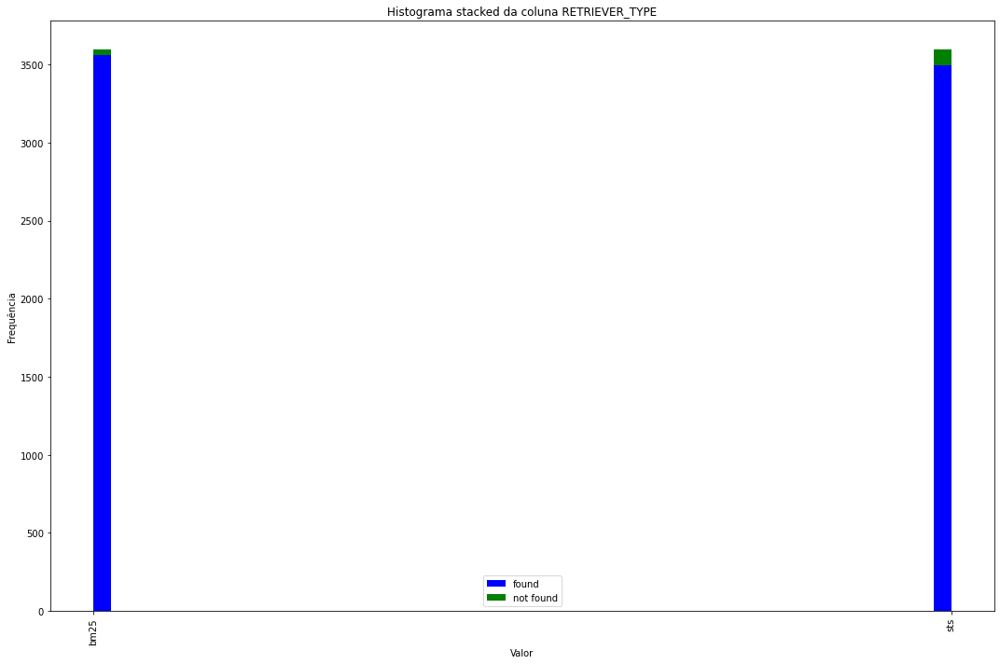

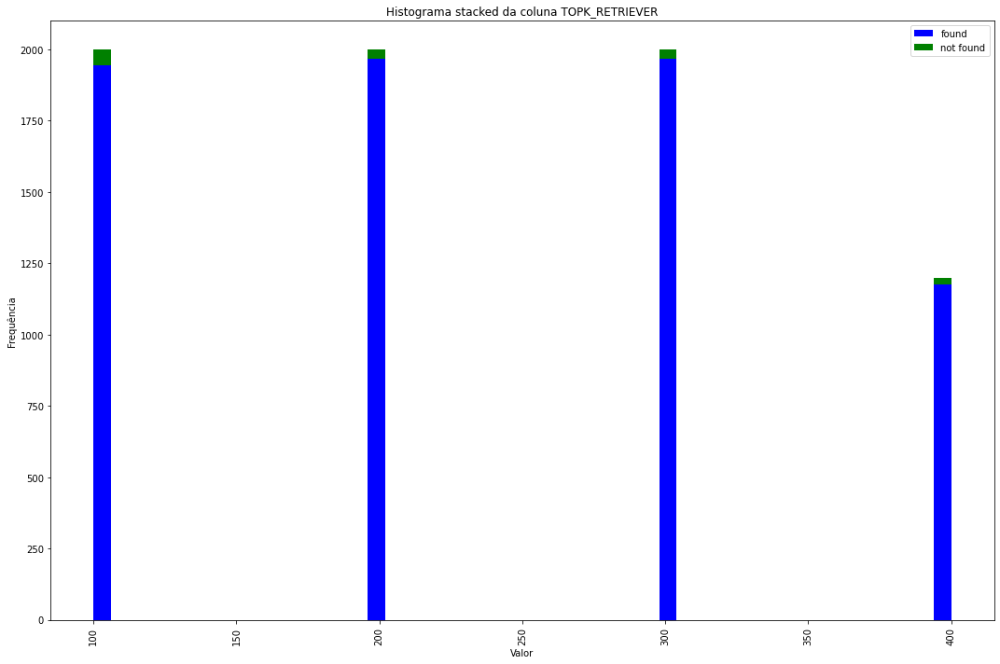

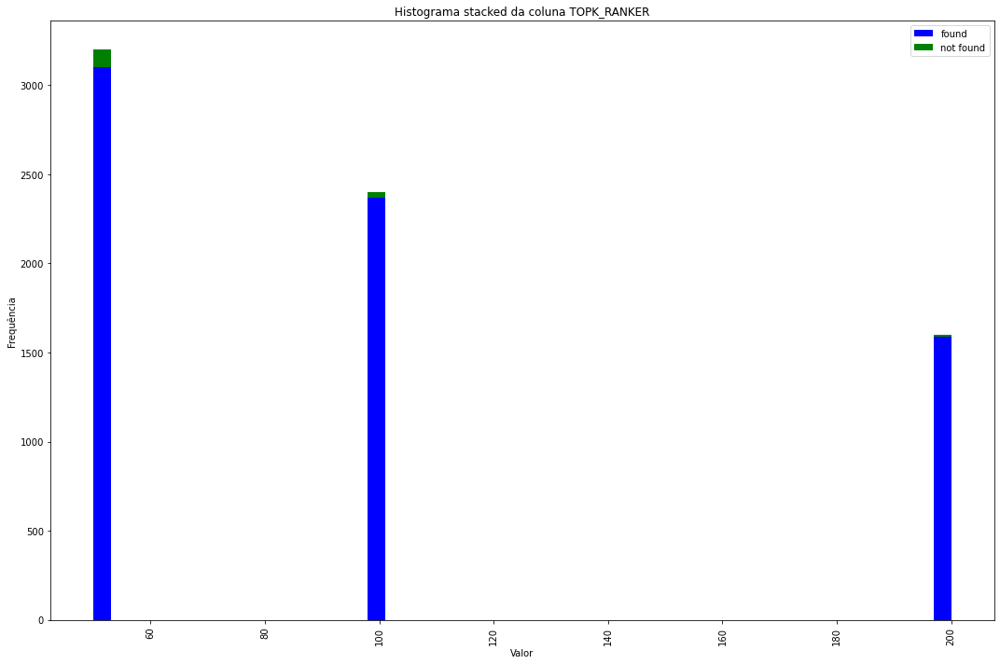

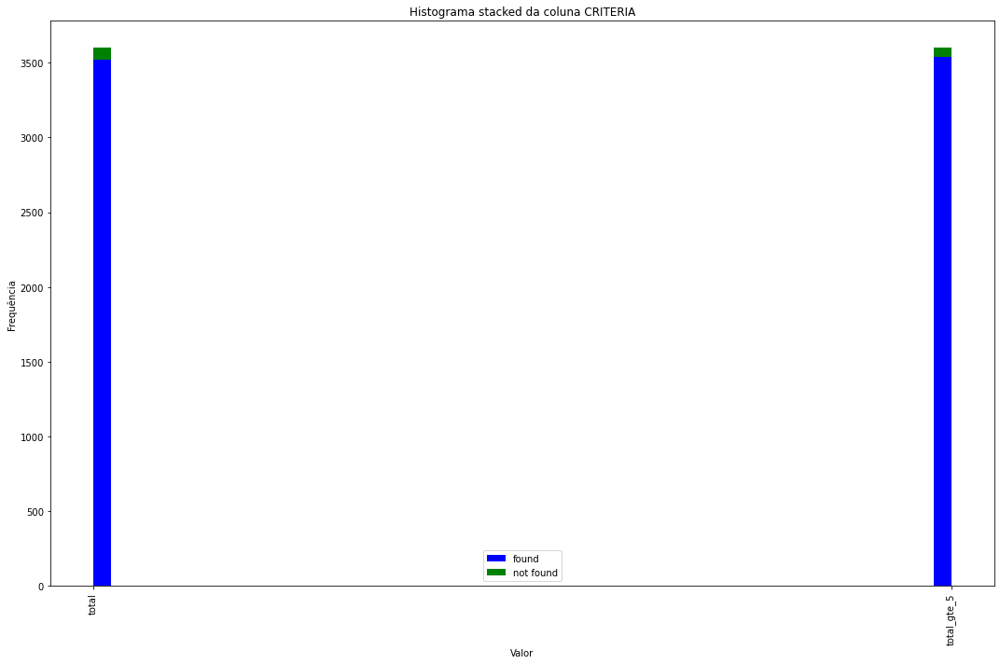

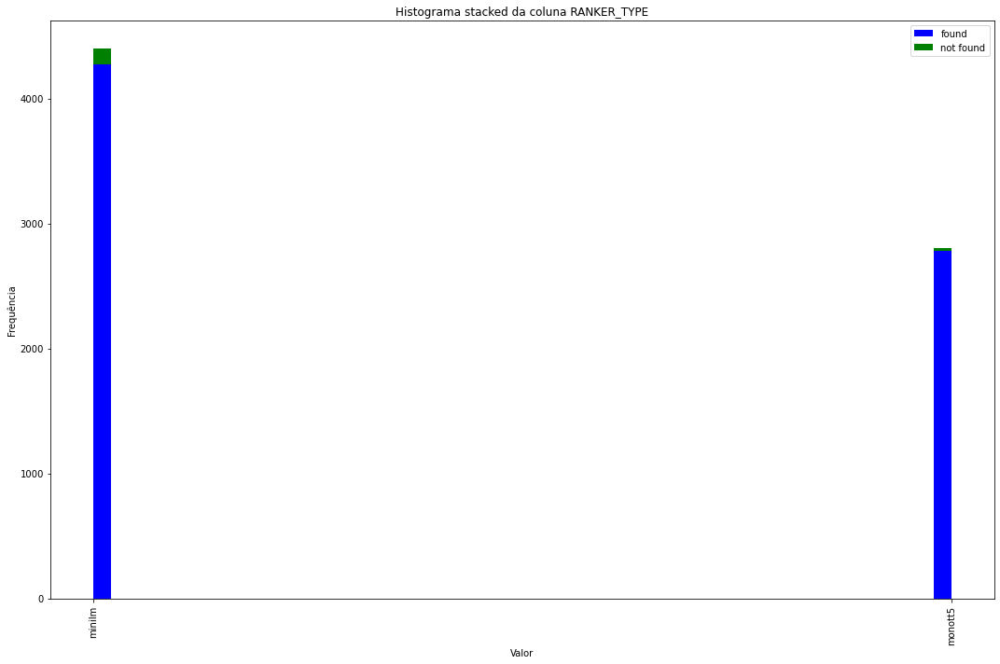

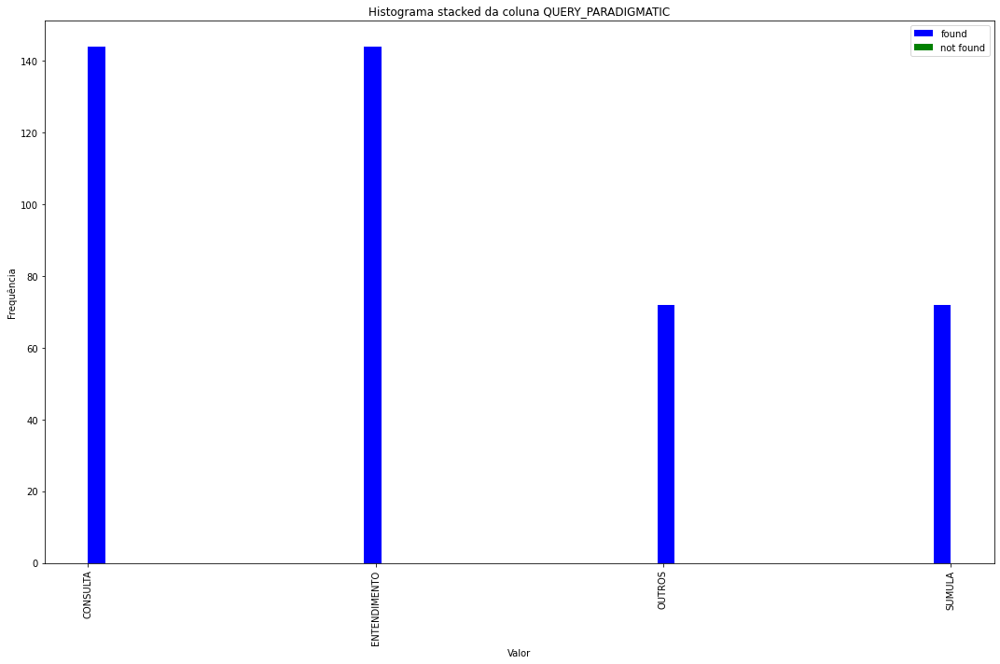

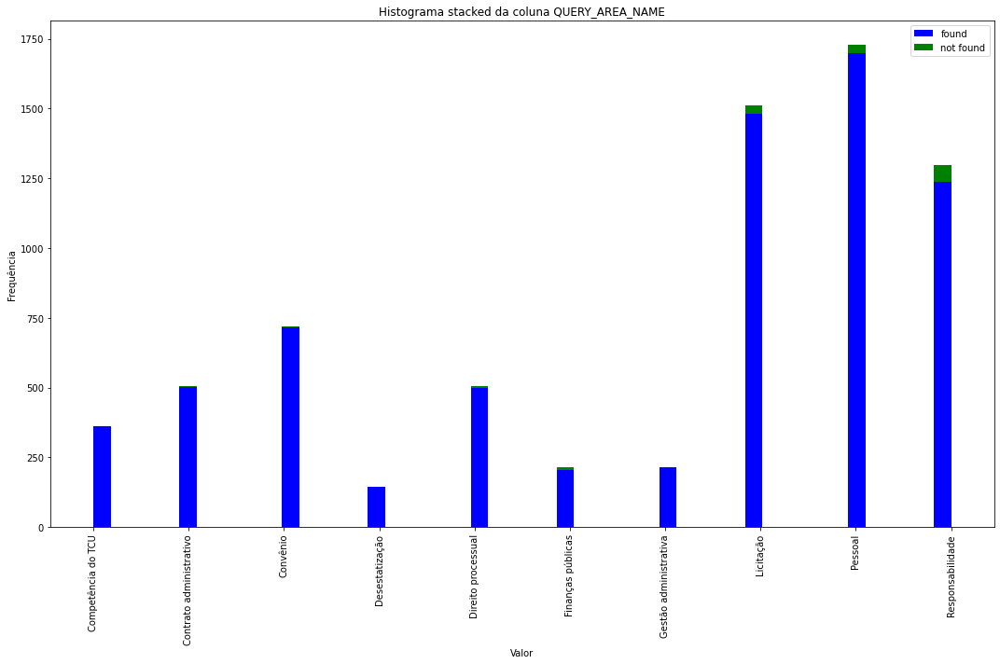

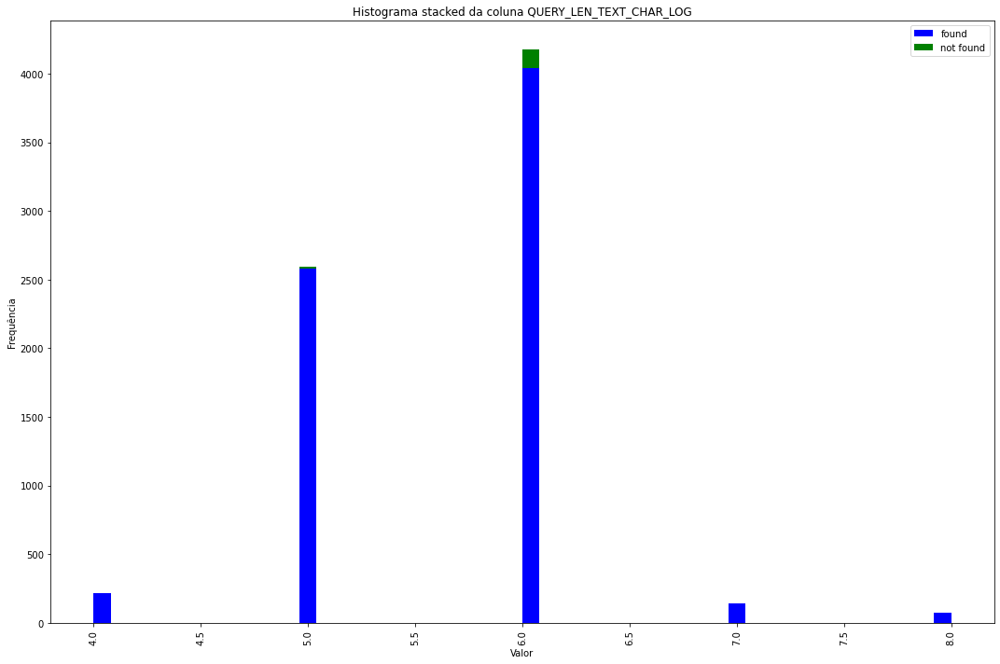

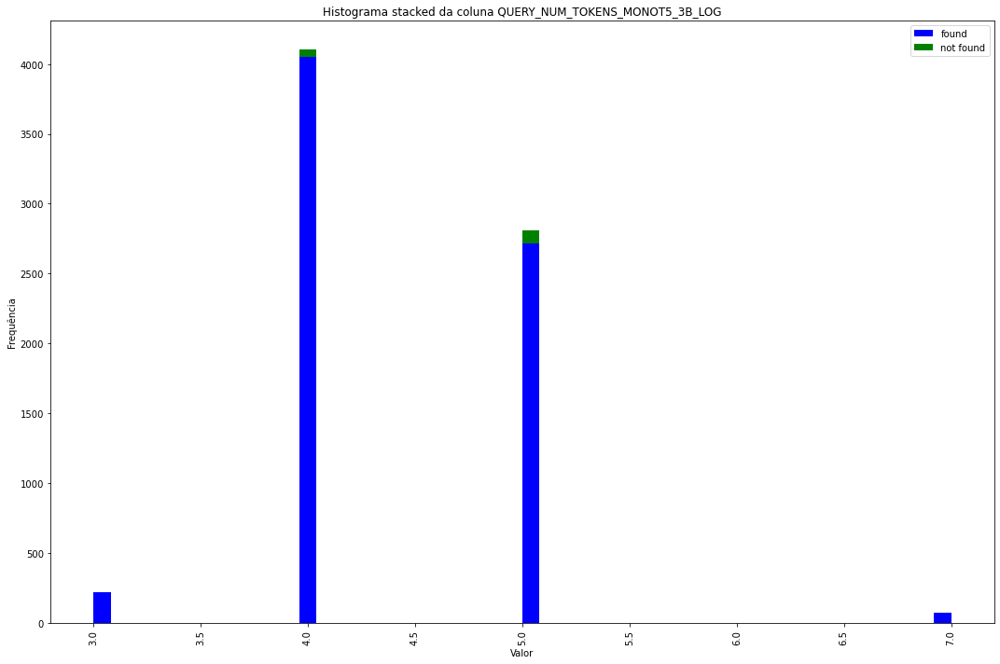

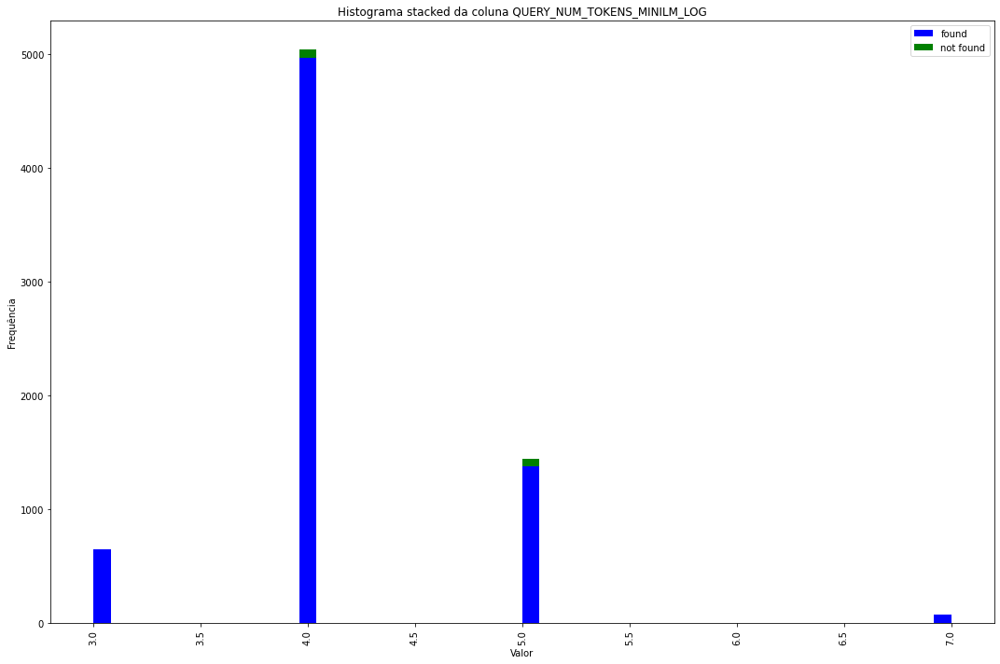

In [ ]:
for coluna in list_category:
    f, ax = plt.subplots(1, 1, figsize=(15,10))
    plt.hist([df_result.sort_values(by=coluna)[coluna].dropna(), df_not_found.sort_values(by=coluna)[coluna].dropna()], color=['blue', 'green'], label=['found', 'not found'], stacked=True, bins=50)


    plt.legend()
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.title(f'Stacked histogram {coluna}: found x not found')
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

## Category evaluation

/home/borela/miniconda3/envs/relevar-busca/lib/python3.7/site-packages/ipykernel_launcher.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


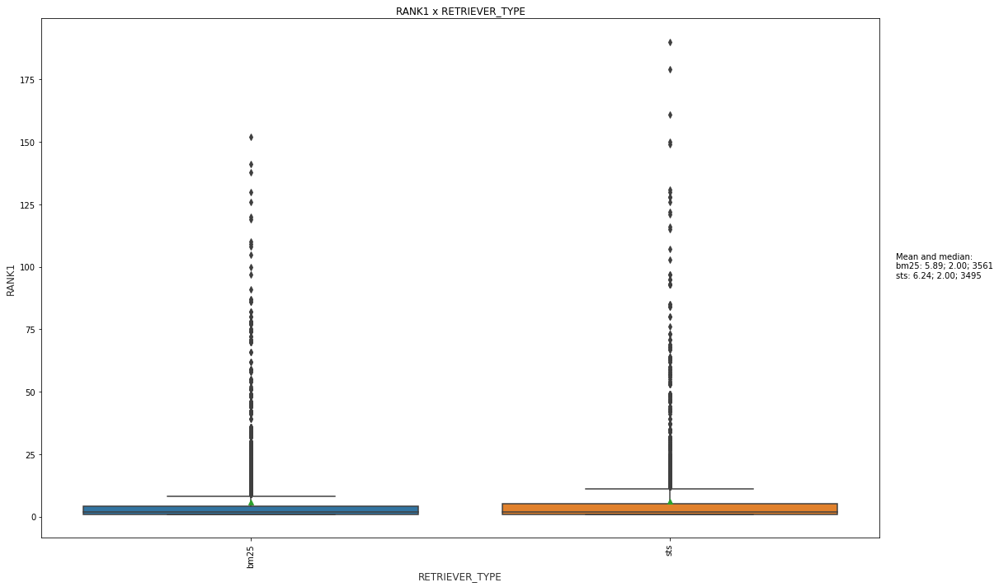

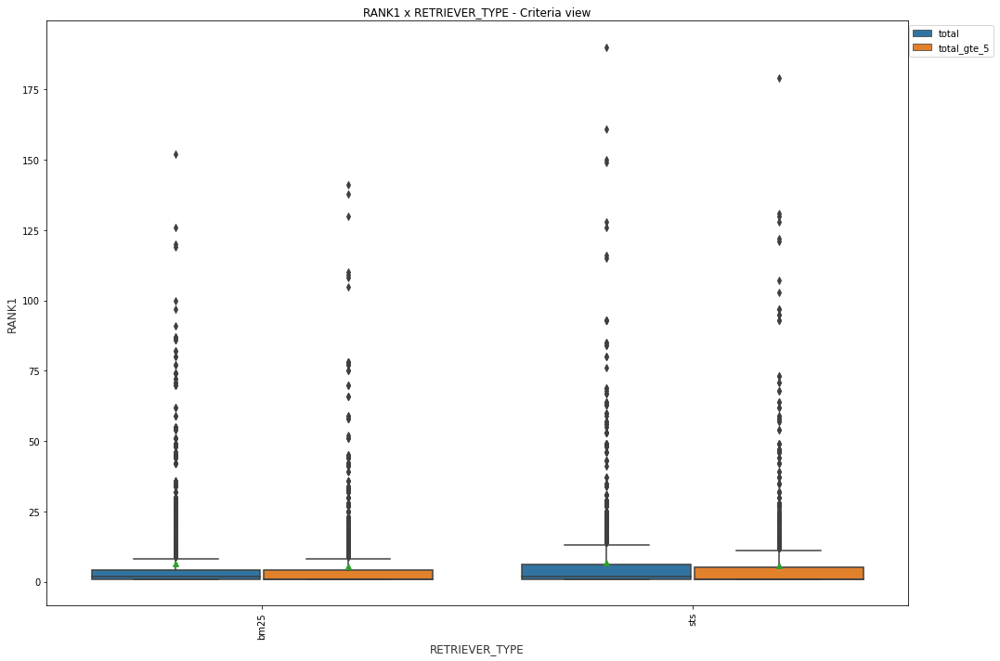

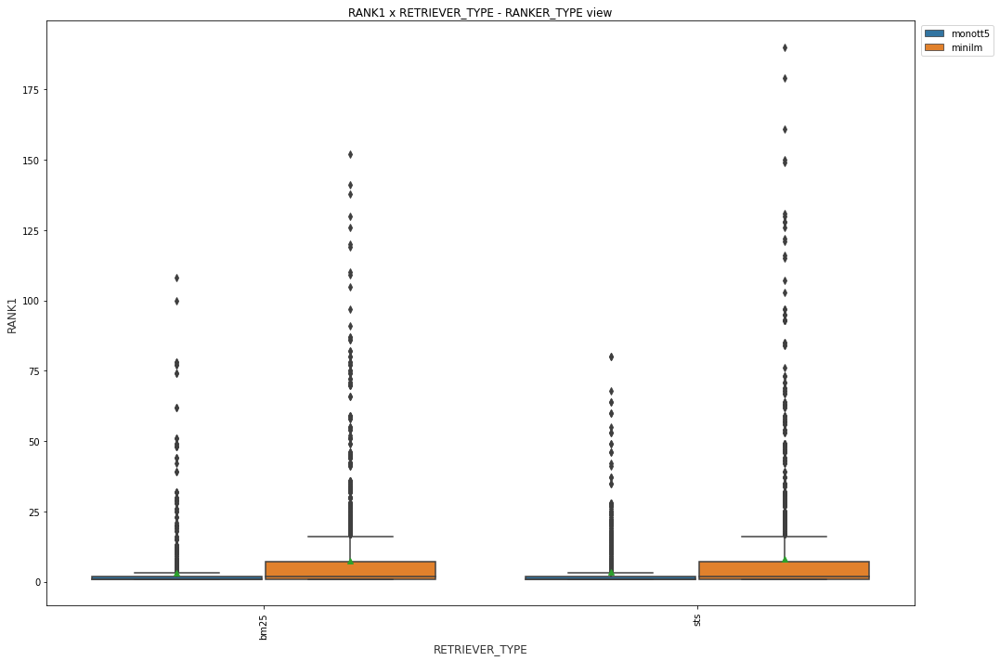

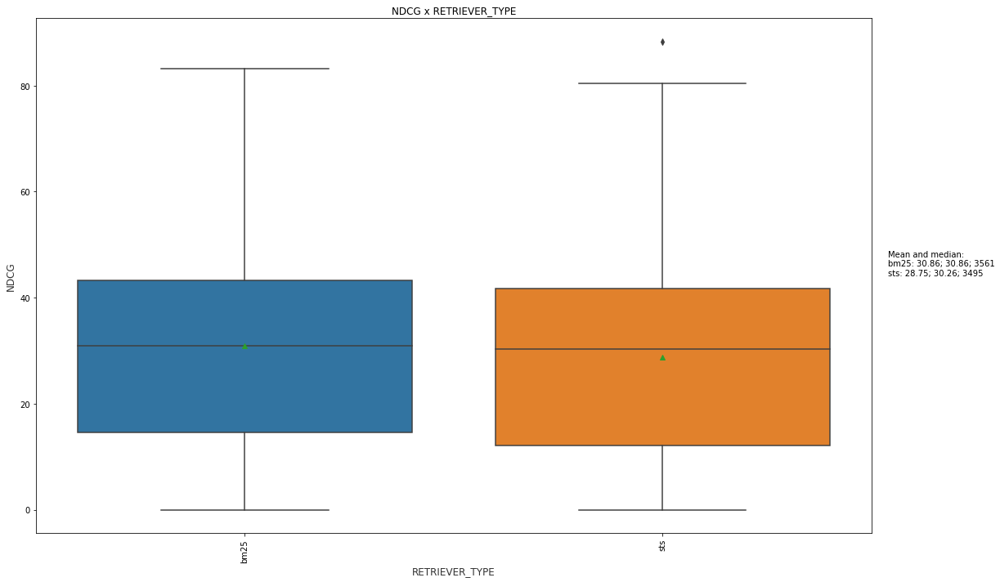

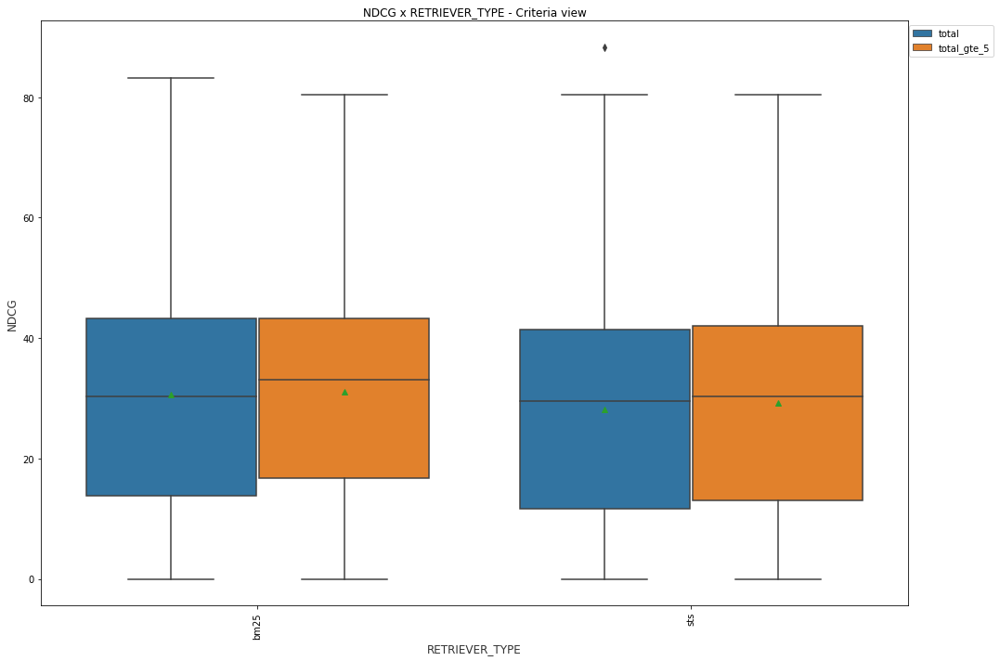

...

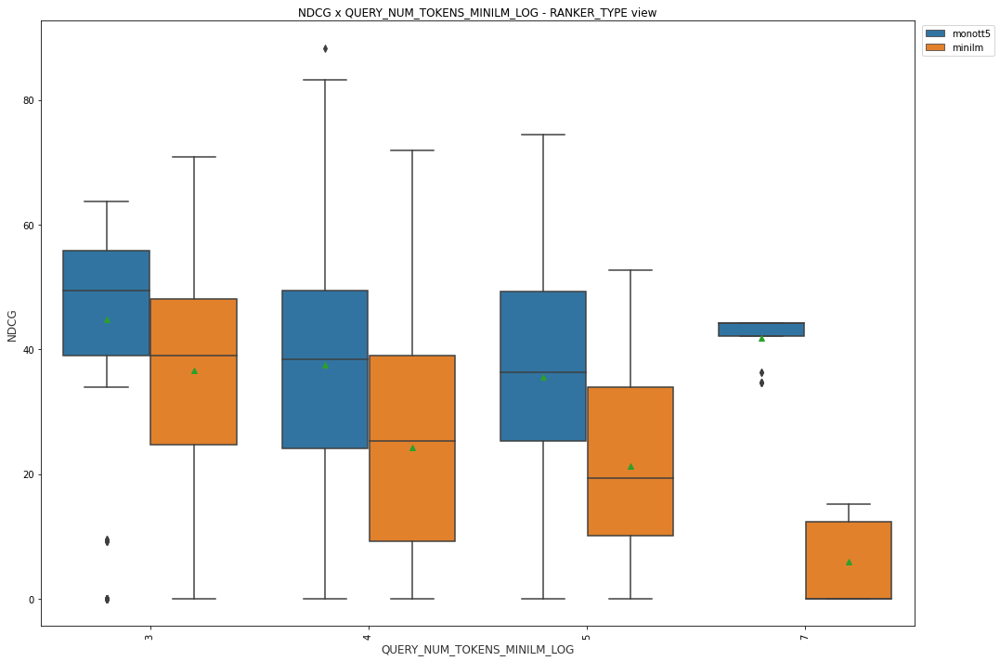

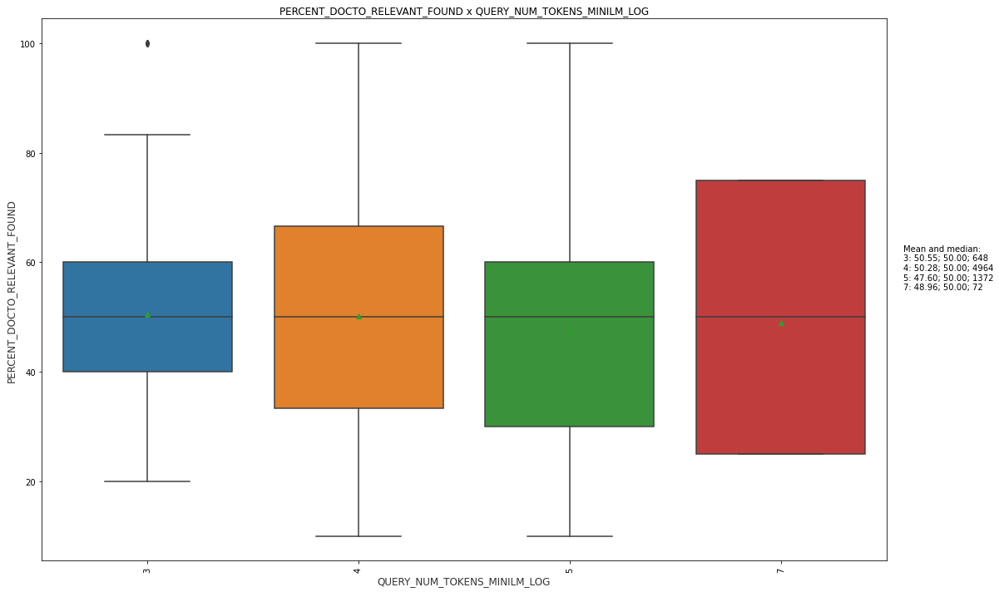

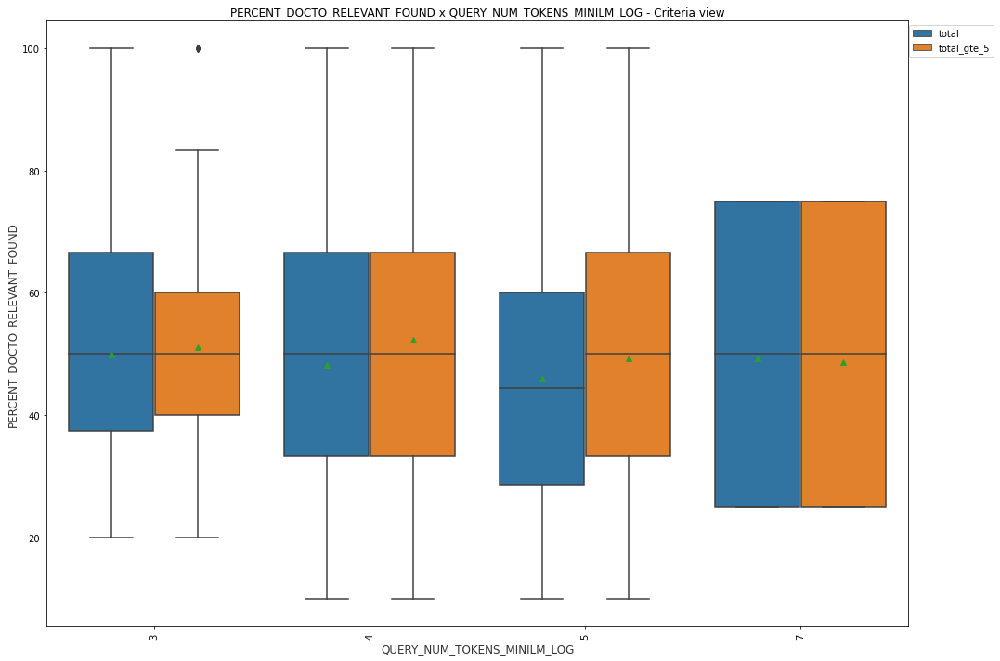

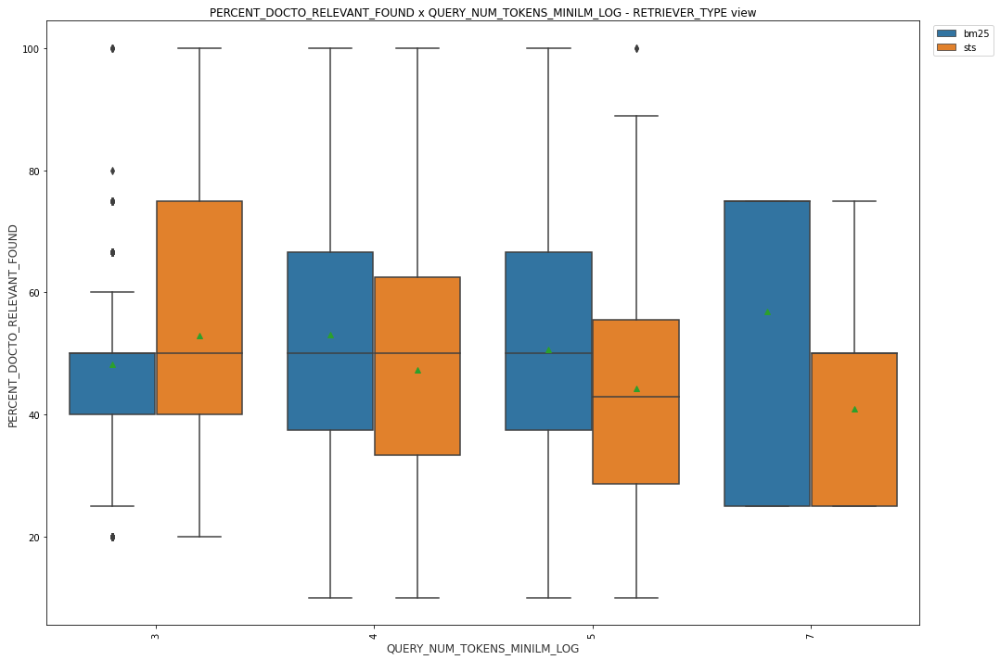

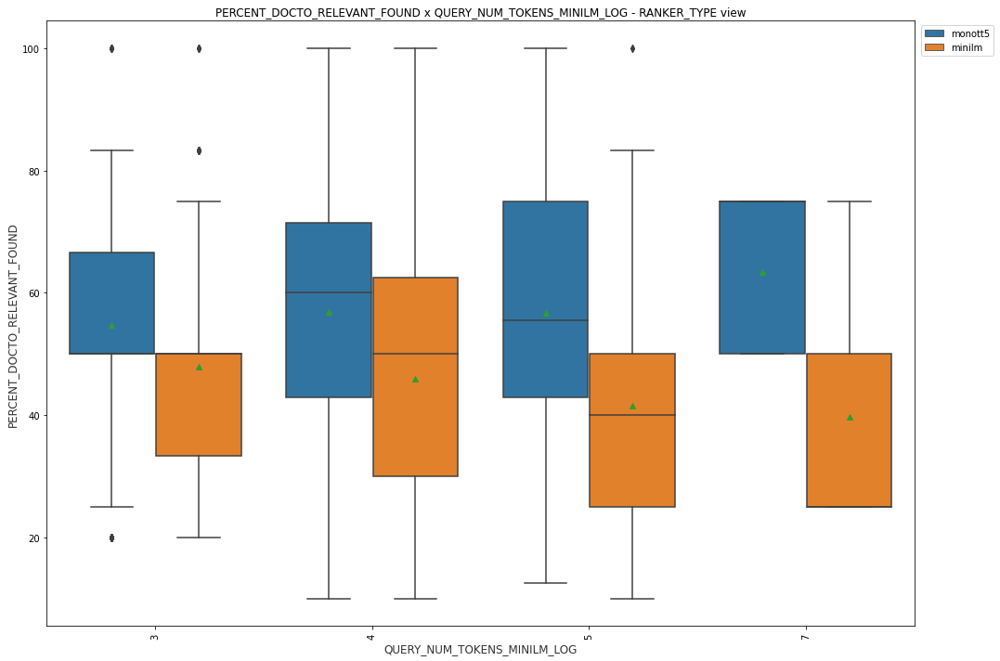

In [ ]:
for context in list_category: 
    for metric in list_metric:
        
        # criar lista com valores únicos da coluna a ser ordenada
        # valores_unicos = sorted(df_result[context].unique())
        
        valores_unicos = sorted(df_result[context].dropna().unique())


        f, ax = plt.subplots(1, 1, figsize=(15,10))
        sns.boxplot(x=context, y=metric, data=df_result, showmeans=True, ax=ax, order=valores_unicos)
        ax.set_xlabel(context,size = 12,alpha=0.8)
        ax.set_ylabel(metric,size = 12,alpha=0.8)
        ax.set_title(f'{metric} x {context}')
        plt.xticks(rotation=90)
        plt.tight_layout()

        # Média e Mediana
        media = df_result.groupby(context)[metric].mean()
        mediana = df_result.groupby(context)[metric].median()
        count = df_result.groupby(context)[metric].count()
        mm_list = [f"{i}: {j:.2f}; {k:.2f}; {l:.0f}" for i,j,k,l in zip(media.index, media, mediana, count)]
        mm_str = "\n".join(mm_list)
        ax.text(1.02, 0.5, f"Mean and median:\n{mm_str}", transform=ax.transAxes)

        if context != 'CRITERIA':
            
            f, ax = plt.subplots(1, 1, figsize=(15,10))
            sns.boxplot(x=context, y=metric, hue='CRITERIA' , data=df_result, showmeans=True, ax=ax, order=valores_unicos)
            f.subplots_adjust(top=0.5)


            ax.set_xlabel(context,size = 12,alpha=0.8)
            ax.set_ylabel(metric,size = 12,alpha=0.8)
            ax.set_title(f'{metric} x {context} - Criteria view')
            ax.legend(bbox_to_anchor=(1.05, 1), loc='upper center', ncol=1)
            plt.xticks(rotation=90)
            plt.tight_layout()

        if context != 'RETRIEVER_TYPE':
            
            f, ax = plt.subplots(1, 1, figsize=(15,10))
            sns.boxplot(x=context, y=metric, hue='RETRIEVER_TYPE' , data=df_result, showmeans=True, ax=ax, order=valores_unicos)
            f.subplots_adjust(top=0.5)


            ax.set_xlabel(context,size = 12,alpha=0.8)
            ax.set_ylabel(metric,size = 12,alpha=0.8)
            ax.set_title(f'{metric} x {context} - RETRIEVER_TYPE view')
            ax.legend(bbox_to_anchor=(1.05, 1), loc='upper center', ncol=1)
            plt.xticks(rotation=90)
            plt.tight_layout()

        if context != 'RANKER_TYPE':
            f, ax = plt.subplots(1, 1, figsize=(15,10))
            sns.boxplot(x=context, y=metric, hue='RANKER_TYPE' , data=df_result, showmeans=True, ax=ax, order=valores_unicos)
            f.subplots_adjust(top=0.5)


            ax.set_xlabel(context,size = 12,alpha=0.8)
            ax.set_ylabel(metric,size = 12,alpha=0.8)
            ax.set_title(f'{metric} x {context} - RANKER_TYPE view')
            ax.legend(bbox_to_anchor=(1.05, 1), loc='upper center', ncol=1)
            plt.xticks(rotation=90)
            plt.tight_layout()

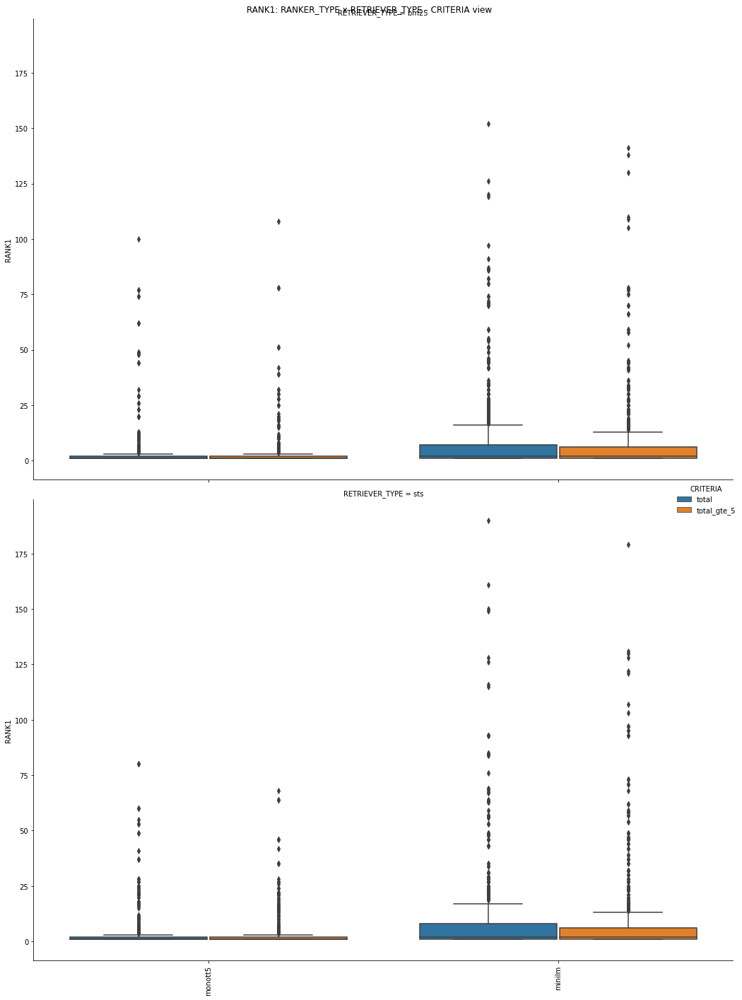

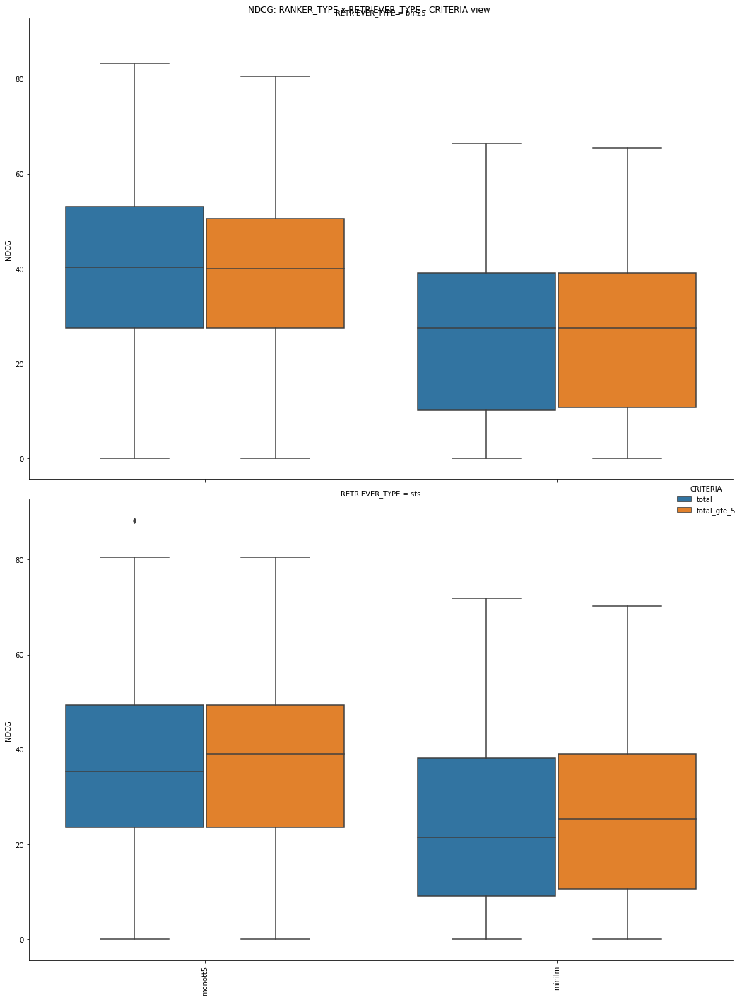

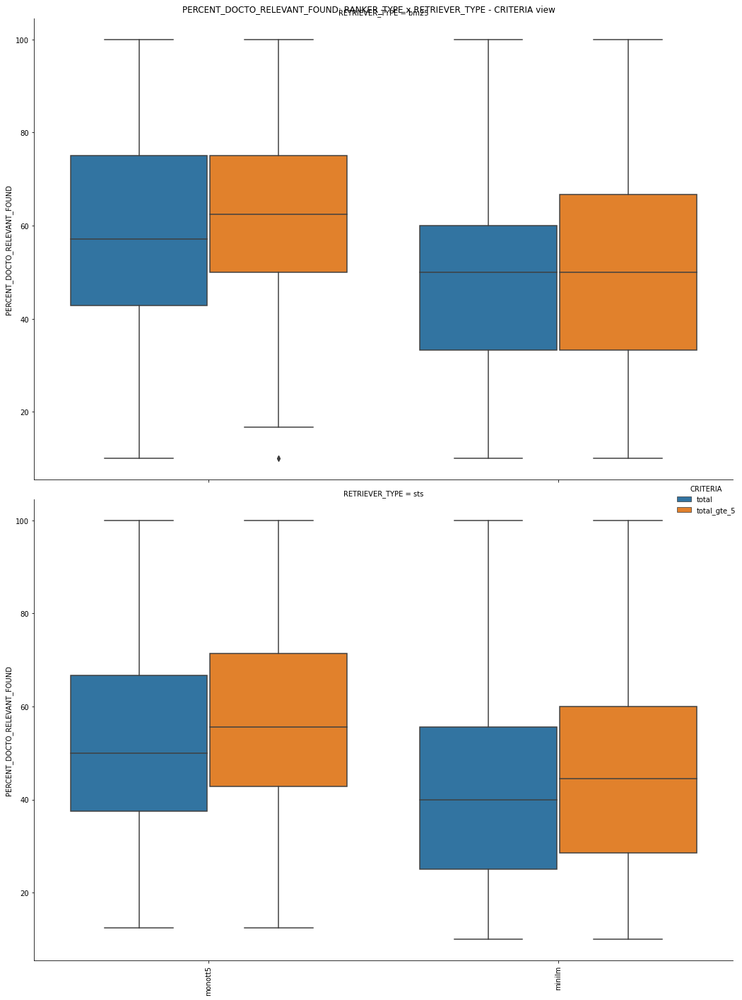

In [ ]:
for metric in list_metric:
    g = sns.catplot(x="RANKER_TYPE", sharex=True, y=metric, hue="CRITERIA", row="RETRIEVER_TYPE", kind="box", data=df_result, height=10, aspect=20/15)
    g.fig.suptitle(f"{metric}: RANKER_TYPE x RETRIEVER_TYPE - CRITERIA view")
    g.set_xticklabels(rotation=90)
    g.set_axis_labels("", metric)
    plt.tight_layout()
plt.show()

STS encontrou mais (percent_found)
BM25 alcançou ndcg melhor entre os 12 primeiros


In [ ]:
df_result.corr()

,COUNT_DOCTO_RELEVANT,TIME_SPENT,NDCG,COUNT_DOCTO_FOUND,RANK1,TOPK_RETRIEVER,TOPK_RANKER,NDCG_LIMIT,QUERY_ID,QUERY_ID_DOCTO,QUERY_LEN_TEXT_CHAR,QUERY_LEN_TEXT_CHAR_LOG,QUERY_NUM_WORD,QUERY_NUM_TOKENS_MONOT5_3B,QUERY_NUM_TOKENS_MINILM,QUERY_NUM_TOKENS_MONOT5_3B_LOG,QUERY_NUM_TOKENS_MINILM_LOG,COUNT_DOCTO_RELEVANT_FOUND,PERCENT_DOCTO_RELEVANT_FOUND
COUNT_DOCTO_RELEVANT,1.000000,0.013206,-0.253396,0.008190,0.169028,-0.009742,0.007391,NaN,-0.109893,-0.015374,-0.047578,0.254118,-0.052618,-0.050033,-0.051838,0.245551,0.104871,0.298150,-0.244072
TIME_SPENT,0.013206,1.000000,0.291301,0.842056,-0.126671,0.302145,-0.380393,NaN,0.004916,0.003268,0.011115,0.024252,0.011389,0.011521,0.011831,0.023282,0.024871,0.338254,0.332312
NDCG,-0.253396,0.291301,1.000000,0.196392,-0.513955,-0.004537,-0.154947,NaN,-0.039241,0.027306,-0.114001,-0.209009,-0.111374,-0.112311,-0.112368,-0.169303,-0.154749,0.313878,0.463934
COUNT_DOCTO_FOUND,0.008190,0.842056,0.196392,1.000000,-0.033031,0.472440,0.087992,NaN,0.001812,-0.000150,0.000978,0.008500,0.001321,0.001592,0.001938,0.006463,0.008122,0.400285,0.403690
RANK1,0.169028,-0.126671,-0.513955,-0.033031,1.000000,0.037316,0.148376,NaN,-0.009382,-0.019504,0.052858,0.130120,0.054233,0.056037,0.058643,0.085569,0.103940,-0.157645,-0.237838
TOPK_RETRIEVER,-0.009742,0.302145,-0.004537,0.472440,0.037316,1.000000,0.002686,NaN,0.003800,-0.000940,0.000595,0.000756,0.000620,0.000605,0.000640,0.001907,0.001705,0.113561,0.129689
TOPK_RANKER,0.007391,-0.380393,-0.154947,0.087992,0.148376,0.002686,1.000000,NaN,-0.000556,0.000592,0.000130,0.004565,0.000305,0.000434,0.000602,0.002357,0.003088,0.081770,0.083561
NDCG_LIMIT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
QUERY_ID,-0.109893,0.004916,-0.039241,0.001812,-0.009382,0.003800,-0.000556,NaN,1.000000,0.158068,-0.045329,-0.013113,-0.037884,-0.041855,-0.032350,0.021639,0.088059,-0.091997,-0.042899
QUERY_ID_DOCTO,-0.015374,0.003268,0.027306,-0.000150,-0.019504,-0.000940,0.000592,NaN,0.158068,1.000000,0.033150,0.056160,0.023769,0.027844,0.023214,0.061615,0.213774,-0.123145,-0.089795


## Correlation 

In [ ]:
df_result.corr()

,ID_QUERY,COUNT_DOCTO_RELEVANT,TIME_SPENT,NDCG,COUNT_DOCTO_FOUND,RANK1,TOPK_RETRIEVER,TOPK_RANKER,NDCG_LIMIT,ID_DOCTO,LEN_TEXT_CHAR,LEN_TEXT_CHAR_LOG,NUM_WORD,NUM_TOKENS_MONOT5_3B,NUM_TOKENS_MINILM,NUM_TOKENS_MONOT5_3B_LOG,NUM_TOKENS_MINILM_LOG,COUNT_DOCTO_RELEVANT_FOUND,PERCENT_DOCTO_RELEVANT_FOUND
ID_QUERY,1.000000,-0.109893,0.004916,-0.039241,0.001812,-0.009382,0.003800,-0.000556,NaN,0.158068,-0.045329,-0.013113,-0.037884,-0.041855,-0.032350,0.021639,0.088059,-0.091997,-0.042899
COUNT_DOCTO_RELEVANT,-0.109893,1.000000,0.013206,-0.253396,0.008190,0.169028,-0.009742,0.007391,NaN,-0.015374,-0.047578,0.254118,-0.052618,-0.050033,-0.051838,0.245551,0.104871,0.298150,-0.244072
TIME_SPENT,0.004916,0.013206,1.000000,0.291301,0.842056,-0.126671,0.302145,-0.380393,NaN,0.003268,0.011115,0.024252,0.011389,0.011521,0.011831,0.023282,0.024871,0.338254,0.332312
NDCG,-0.039241,-0.253396,0.291301,1.000000,0.196392,-0.513955,-0.004537,-0.154947,NaN,0.027306,-0.114001,-0.209009,-0.111374,-0.112311,-0.112368,-0.169303,-0.154749,0.313878,0.463934
COUNT_DOCTO_FOUND,0.001812,0.008190,0.842056,0.196392,1.000000,-0.033031,0.472440,0.087992,NaN,-0.000150,0.000978,0.008500,0.001321,0.001592,0.001938,0.006463,0.008122,0.400285,0.403690
RANK1,-0.009382,0.169028,-0.126671,-0.513955,-0.033031,1.000000,0.037316,0.148376,NaN,-0.019504,0.052858,0.130120,0.054233,0.056037,0.058643,0.085569,0.103940,-0.157645,-0.237838
TOPK_RETRIEVER,0.003800,-0.009742,0.302145,-0.004537,0.472440,0.037316,1.000000,0.002686,NaN,-0.000940,0.000595,0.000756,0.000620,0.000605,0.000640,0.001907,0.001705,0.113561,0.129689
TOPK_RANKER,-0.000556,0.007391,-0.380393,-0.154947,0.087992,0.148376,0.002686,1.000000,NaN,0.000592,0.000130,0.004565,0.000305,0.000434,0.000602,0.002357,0.003088,0.081770,0.083561
NDCG_LIMIT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ID_DOCTO,0.158068,-0.015374,0.003268,0.027306,-0.000150,-0.019504,-0.000940,0.000592,NaN,1.000000,0.033150,0.056160,0.023769,0.027844,0.023214,0.061615,0.213774,-0.123145,-0.089795


    NDCG    
        COUNT_DOCTO_FOUND
        RANK1
        PERCENT_DOCTO_RELEVANT_FOUND
        COUNT_DOCTO_RELEVANT_FOUND
        COUNT_DOCTO_RELEVANT(-)
        TOPK_RANKER (-)
        LEN_TEXT_CHAR_LOG (-)

    RANK1 (contribui se leva a um rank1 menor)
        PERCENT_DOCTO_RELEVANT_FOUND
        NDCG
        COUNT_DOCTO_RELEVANT (-)
        TOPK_RANKER (-)

    COUNT_DOCTO_RELEVANT
        COUNT_DOCTO_RELEVANT_FOUND
        LEN_TEXT_CHAR_LOG

    TIME_SPENT
        COUNT_DOCTO_RELEVANT_FOUND
        PERCENT_DOCTO_RELEVANT_FOUND
        COUNT_DOCTO_FOUND
        TOPK_RETRIEVER
        TOPK_RANKER (-)

    COUNT_DOCTO_FOUND
        TOPK_RETRIEVER
        PERCENT_DOCTO_RELEVANT_FOUND
        COUNT_DOCTO_RELEVANT_FOUND

    TOPK_RETRIEVER
        PERCENT_DOCTO_RELEVANT_FOUND
        COUNT_DOCTO_RELEVANT_FOUND


## Distribution of values

/home/borela/miniconda3/envs/relevar-busca/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  after removing the cwd from sys.path.


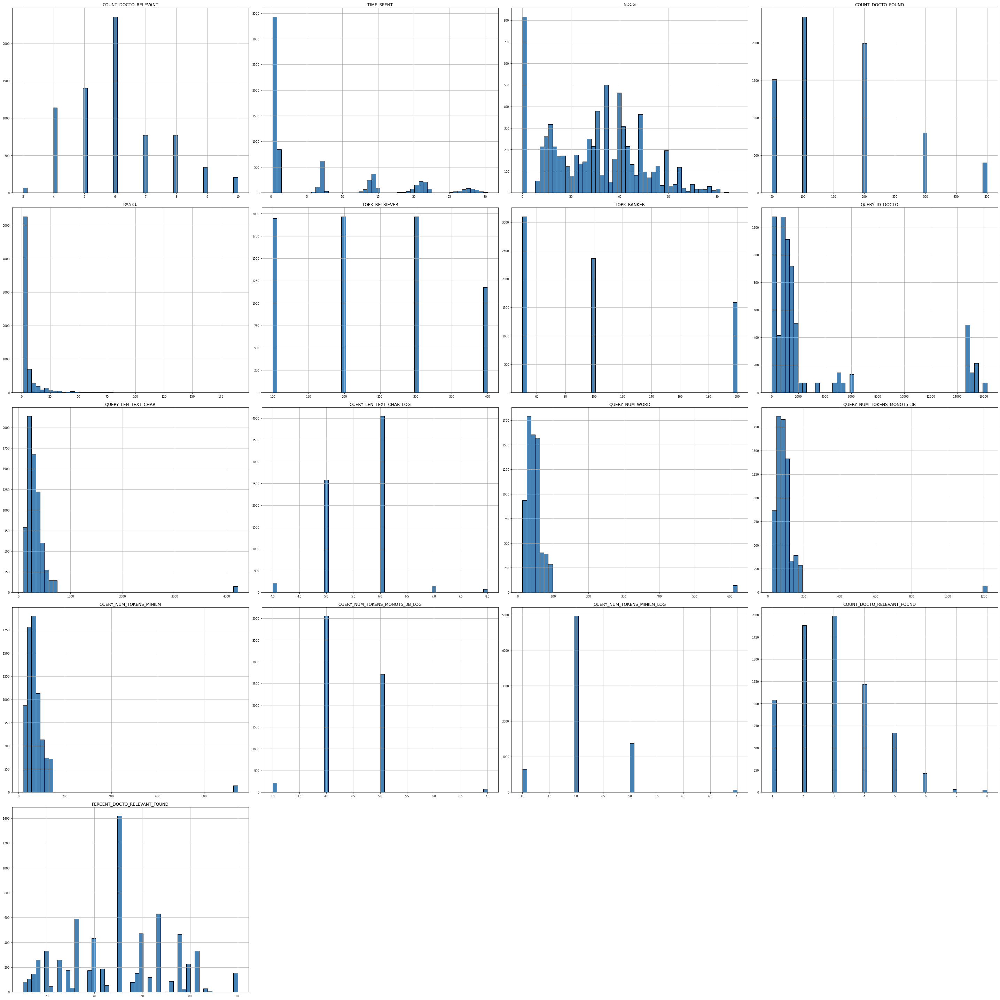

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(40,40))
ax.set_title('Histogram')
df_result.drop(['QUERY_ID','NDCG_LIMIT'],axis=1).hist(bins=50, color='steelblue', edgecolor='black', linewidth=1.0,
           xlabelsize=8, ylabelsize=8, grid=True, ax=ax)  
plt.tight_layout()   

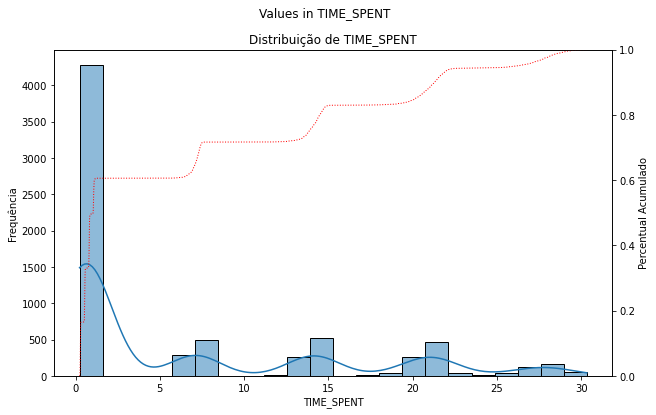

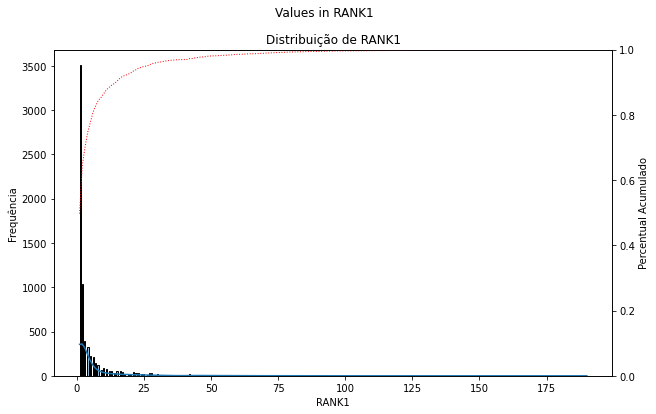

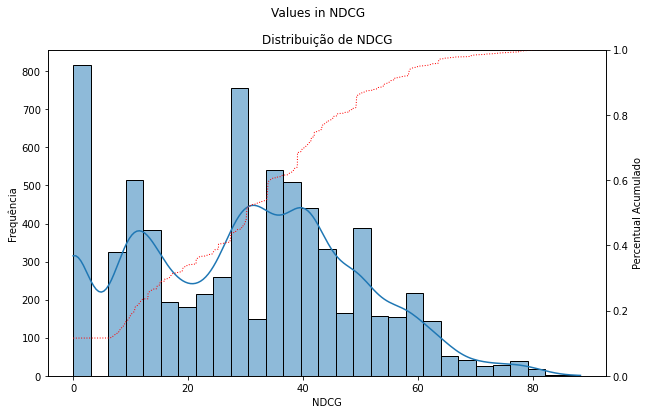

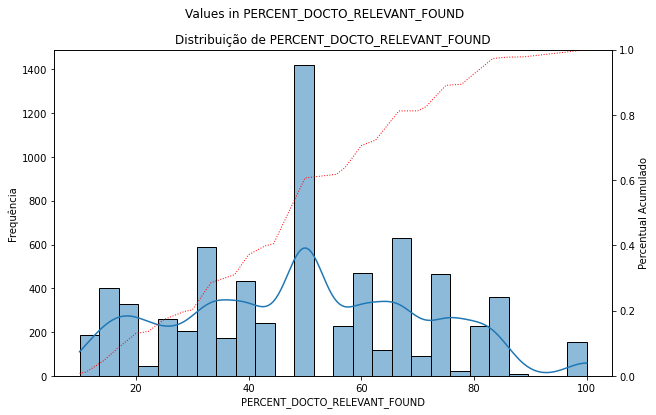

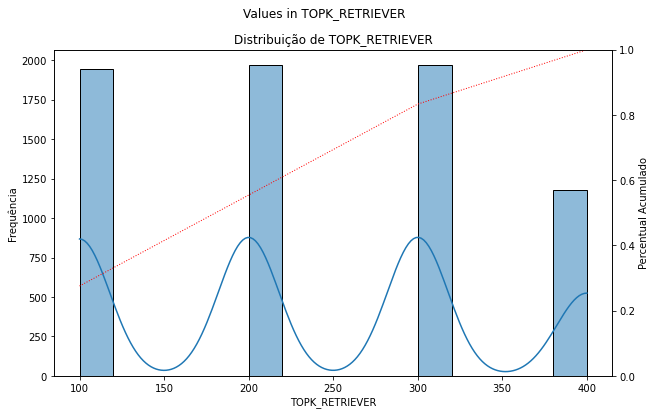

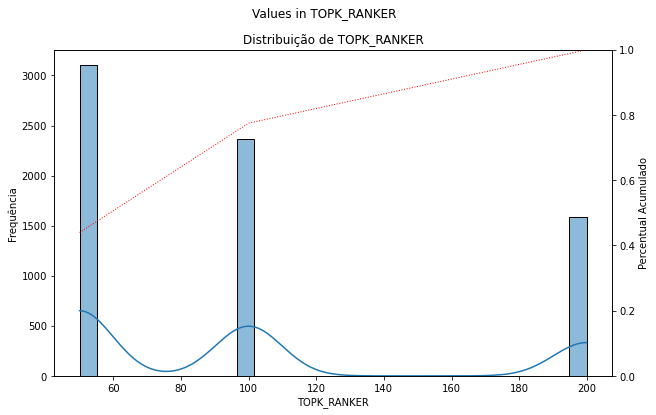

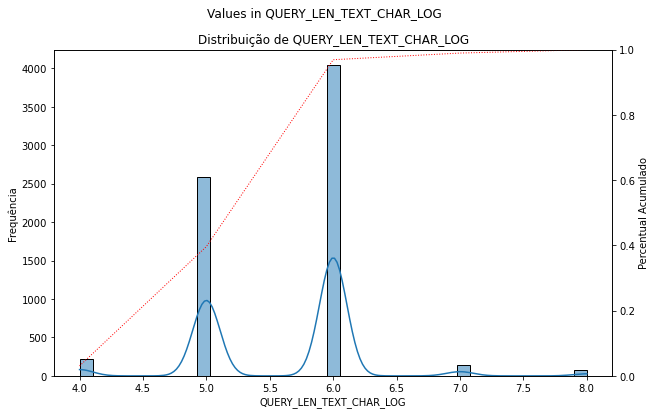

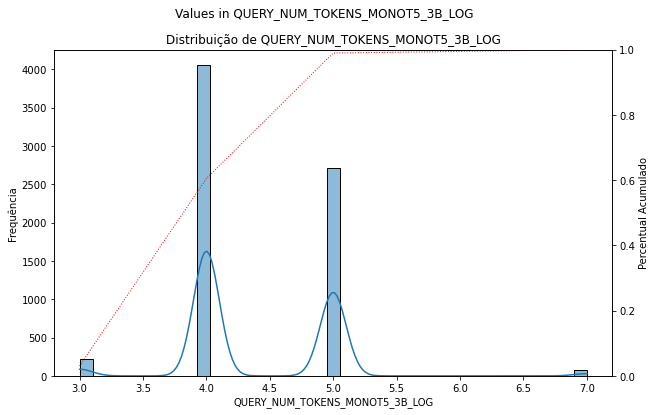

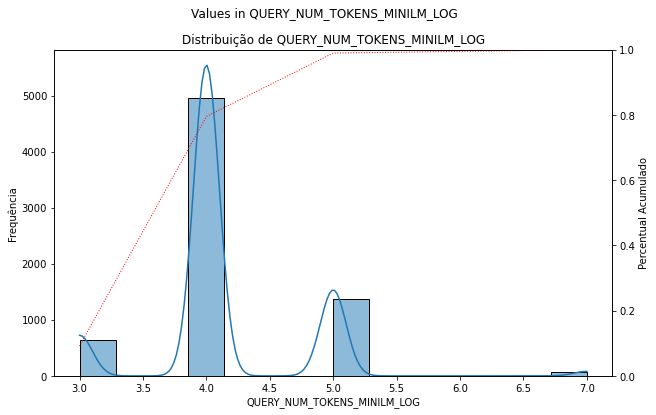

In [ ]:
for column in ['TIME_SPENT'] + list_metric + list_category:
    if df_result[column].dtype != object:
        f, ax = plt.subplots(1, 1, figsize=(10,6))
        f.suptitle(f'Values in {column}')    
        # Plot o histograma normalizado com KDE
        sns.histplot(data=df_result[column], kde=True, ax=ax, linewidth=1)

        # Calcula o percentual acumulado
        cumulative = df_result[column].value_counts(normalize=True).sort_index().cumsum()

        # Cria um novo eixo y com o percentual acumulado
        ax2 = ax.twinx()
        ax2.plot(cumulative.index, cumulative.values, linestyle='dotted', marker='', color='red', linewidth=1)
        ax2.set_ylim([0, 1])
        ax2.set_ylabel('Percentual Acumulado')

        # Configurações do gráfico
        ax.set_title(f'Distribuição de {column}')
        ax.set_xlabel(column)
        ax.set_ylabel('Frequência')
# Exibe o gráfico
plt.show()

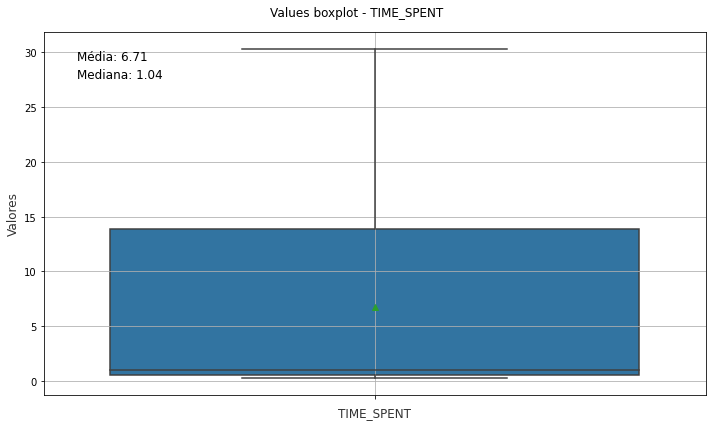

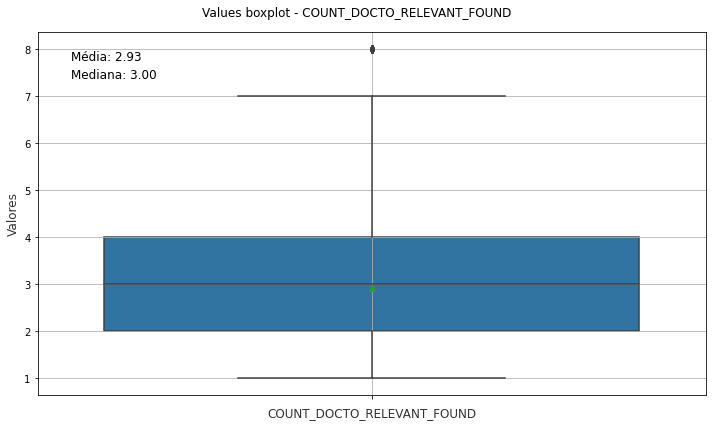

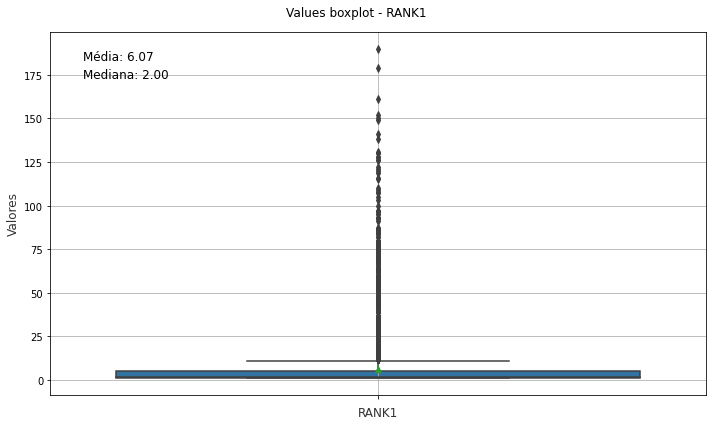

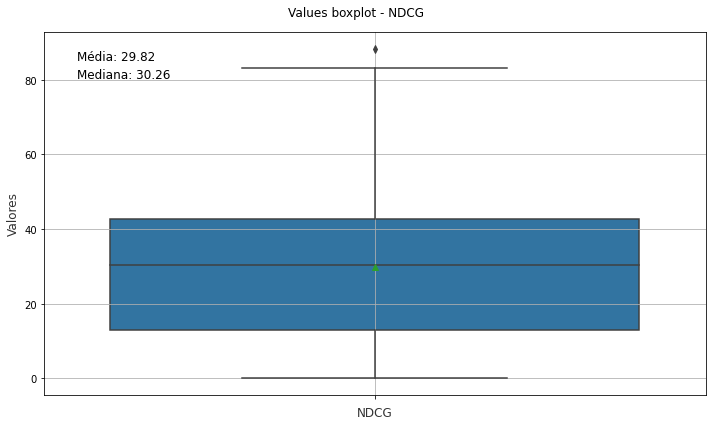

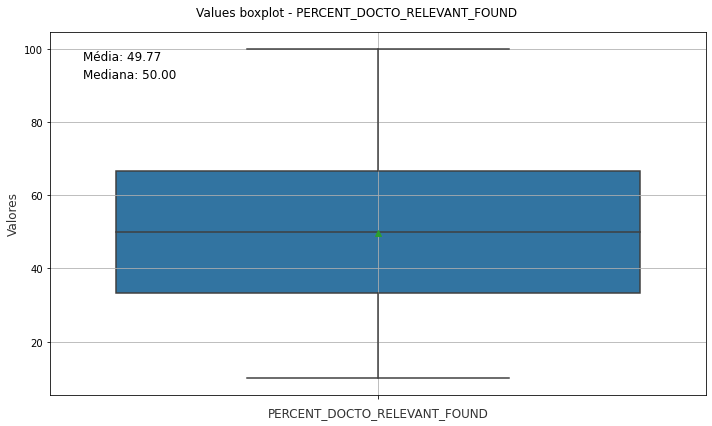

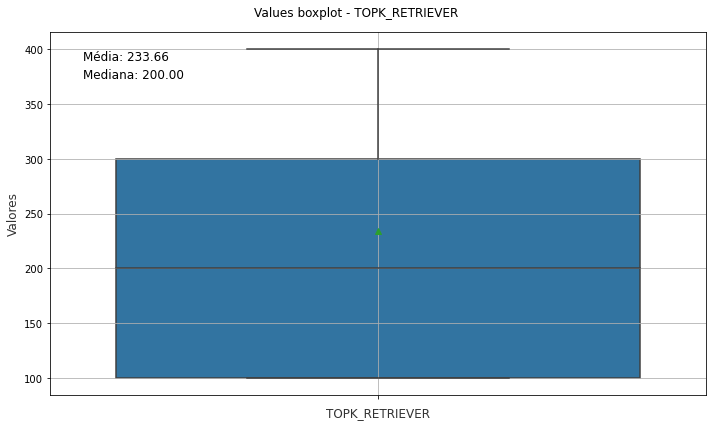

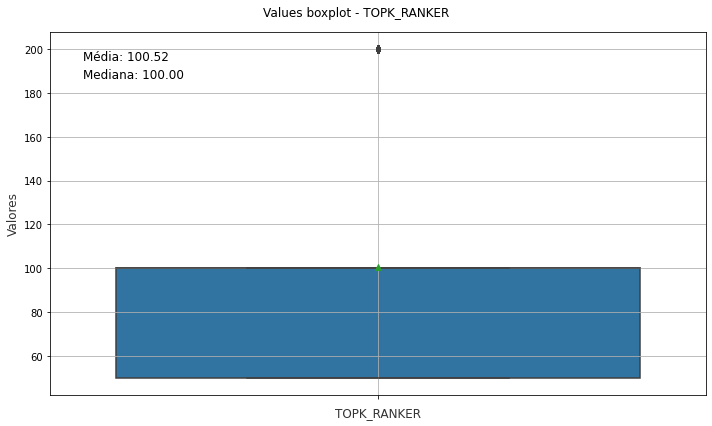

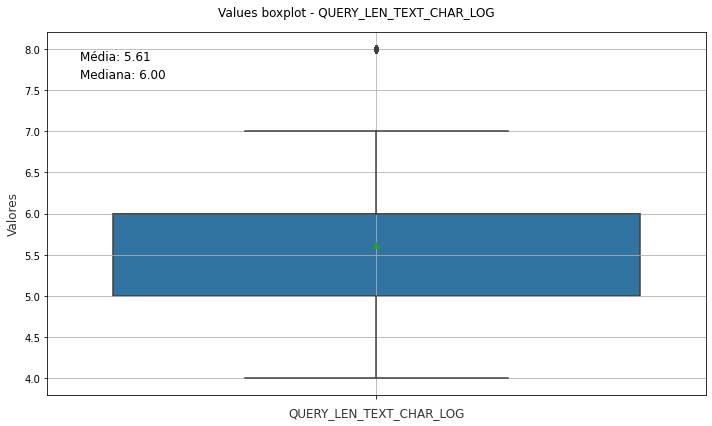

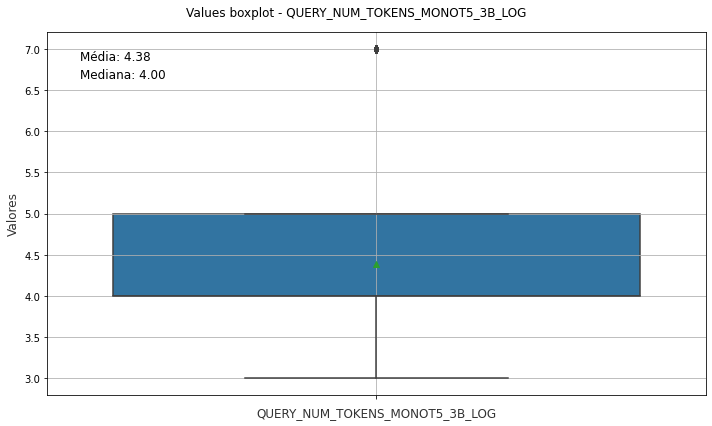

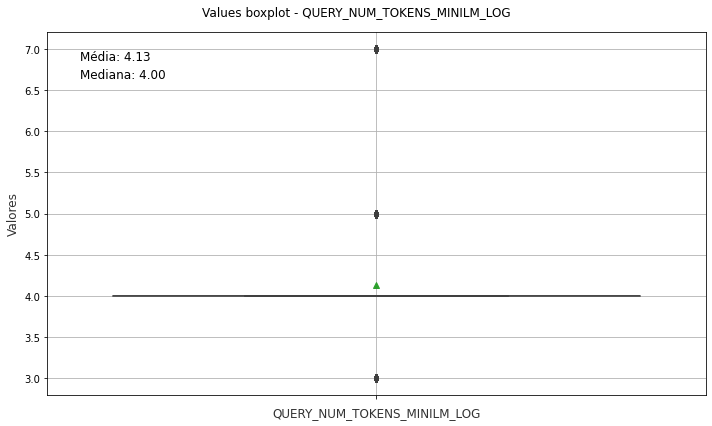

In [ ]:
metrics = {}
for column in ['TIME_SPENT', 'COUNT_DOCTO_RELEVANT_FOUND'] + list_metric + list_category: 
  if df_result[column].dtype != object:
    f, ax = plt.subplots(1, 1, figsize=(10,6))
    f.suptitle(f'Values boxplot - {column}')
    ax = sns.boxplot(y=column, data=df_result, showmeans=True, ax=ax)
    # Gráfico de disperção
    # ax = sns.stripplot(y=column, data=df_result, ax=ax) 

    # Calcula a média e mediana
    mean_val = round(df_result[column].mean(), 3)
    median_val = df_result[column].median()
    metrics[column] = {'media': mean_val, 'mediana':median_val}
    # Imprime a média e mediana no gráfico
    ax.text(0.05, 0.95, f'Média: {mean_val:.2f}', transform=ax.transAxes, fontsize=12, verticalalignment='top')
    ax.text(0.05, 0.9, f'Mediana: {median_val:.2f}', transform=ax.transAxes, fontsize=12, verticalalignment='top')

    plt.grid() 
    # sns.boxplot(data=df_result['{column}'], showmeans=True,  ax=ax)
    ax.set_xlabel(f"{column}",size = 12,alpha=0.8)
    ax.set_ylabel("Valores",size = 12,alpha=0.8)
    plt.xticks(rotation=60)
    plt.tight_layout()  
plt.show()

## Best ndcg evaluation

In [ ]:
pd.set_option('display.max_rows', 200)
pd.set_option('display.max_columns', None)

In [ ]:
df_result.sort_values(by='NDCG', ascending=False).head(10)

,COUNT_DOCTO_RELEVANT,TIME_SPENT,NDCG,COUNT_DOCTO_FOUND,RANK1,LIST_RANK,LIST_DOCTO_FOUND,RETRIEVER_TYPE,TOPK_RETRIEVER,TOPK_RANKER,NDCG_LIMIT,CRITERIA,RETRIEVER_MODEL_NAME,RANKER_MODEL_NAME,QUERY_ID,QUERY_RELEVANCE_DICT_ID_DOC,QUERY_RELEVANCE_DICT_TYPE,QUERY_PARADIGMATIC,QUERY_AREA_NAME,QUERY_ID_DOCTO,QUERY_LEN_TEXT_CHAR,QUERY_LEN_TEXT_CHAR_LOG,QUERY_NUM_WORD,QUERY_NUM_TOKENS_MONOT5_3B,QUERY_NUM_TOKENS_MINILM,QUERY_NUM_TOKENS_MONOT5_3B_LOG,QUERY_NUM_TOKENS_MINILM_LOG,COUNT_DOCTO_RELEVANT_FOUND,PERCENT_DOCTO_RELEVANT_FOUND,RANKER_TYPE
1144,6,24.0912,88.29,400,1,"[2, 4, 1, 6, 3]","[1292, 2556, 16283, 2182, 1291, 657, 3735, 16017, 5246, 15638, 316, 6814, 13...",sts,400,50,12,total,rufimelo/Legal-BERTimbau-sts-large-ma-v3,unicamp-dl/mt5-3B-mmarco-en-pt,18371,"{2556: 'SUBTEMA', 2182: 'INDEXACAO_EXTRA', 331: 'AREA', 1292: 'TEMA', 657: '...","{'SUBTEMA': [2556], 'INDEXACAO_EXTRA': [2182, 657, 16283], 'AREA': [331], 'T...",NaN,Contrato administrativo,2556,185,5,25,52,42,4,4,5,83.33,monott5
1643,4,7.3449,83.19,100,1,"[3, 2, 1]","[1100227, 1002, 932, 15866, 5210, 6075, 2497, 1973, 1202, 284, 2530, 1204, 2...",bm25,100,50,12,total,NaN,unicamp-dl/mt5-3B-mmarco-en-pt,17156,"{932: 'AREA', 1002: 'TEMA', 15299: 'SUBTEMA', 1100227: 'INDEXACAO_EXTRA'}","{'AREA': [932], 'TEMA': [1002], 'SUBTEMA': [15299], 'INDEXACAO_EXTRA': [1100...",NaN,Licitação,932,271,6,43,80,59,4,4,3,75.00,monott5
1586,4,7.2750,83.19,100,1,"[3, 2, 1]","[1100227, 1002, 932, 15866, 5210, 6075, 2497, 1973, 1202, 284, 2530, 1204, 2...",bm25,100,100,12,total,NaN,unicamp-dl/mt5-3B-mmarco-en-pt,17156,"{932: 'AREA', 1002: 'TEMA', 15299: 'SUBTEMA', 1100227: 'INDEXACAO_EXTRA'}","{'AREA': [932], 'TEMA': [1002], 'SUBTEMA': [15299], 'INDEXACAO_EXTRA': [1100...",NaN,Licitação,932,271,6,43,80,59,4,4,3,75.00,monott5
4903,4,12.5678,80.48,200,1,"[4, 2, 1]","[16294, 15104, 310, 16263, 685, 1739, 1935, 305, 1526, 2663, 301, 949, 950, ...",sts,200,100,12,total,rufimelo/Legal-BERTimbau-sts-large-ma-v3,unicamp-dl/mt5-3B-mmarco-en-pt,17834,"{16263: 'SUBTEMA', 15104: 'TEMA', 16294: 'INDEXACAO_EXTRA', 629: 'AREA'}","{'SUBTEMA': [16263], 'TEMA': [15104], 'INDEXACAO_EXTRA': [16294], 'AREA': [6...",NaN,Finanças públicas,16263,172,5,25,50,36,4,4,3,75.00,monott5
3877,4,21.1123,80.48,300,1,"[4, 2, 1]","[1489, 5259, 1101548, 26, 1558, 373, 1491, 2971, 14851, 41, 1565, 1563, 724,...",bm25,300,50,12,total_gte_5,NaN,unicamp-dl/mt5-3B-mmarco-en-pt,14599,"{26: 'SUBTEMA', 5259: 'INDEXACAO_EXTRA', 1131: 'AREA', 1489: 'TEMA'}","{'SUBTEMA': [26], 'INDEXACAO_EXTRA': [5259], 'AREA': [1131], 'TEMA': [1489]}",NaN,Pessoal,26,275,6,45,84,71,4,4,3,75.00,monott5
4967,4,6.5354,80.48,100,1,"[4, 2, 1]","[16294, 15104, 310, 16263, 685, 1935, 1526, 2663, 301, 949, 950, 14767, 312,...",sts,100,50,12,total_gte_5,rufimelo/Legal-BERTimbau-sts-large-ma-v3,unicamp-dl/mt5-3B-mmarco-en-pt,17834,"{16263: 'SUBTEMA', 15104: 'TEMA', 16294: 'INDEXACAO_EXTRA', 629: 'AREA'}","{'SUBTEMA': [16263], 'TEMA': [15104], 'INDEXACAO_EXTRA': [16294], 'AREA': [6...",NaN,Finanças públicas,16263,172,5,25,50,36,4,4,3,75.00,monott5
4904,4,5.9648,80.48,100,1,"[4, 2, 1]","[16294, 15104, 310, 16263, 685, 1739, 1935, 305, 2663, 301, 950, 14767, 312,...",sts,100,100,12,total,rufimelo/Legal-BERTimbau-sts-large-ma-v3,unicamp-dl/mt5-3B-mmarco-en-pt,17834,"{16263: 'SUBTEMA', 15104: 'TEMA', 16294: 'INDEXACAO_EXTRA', 629: 'AREA'}","{'SUBTEMA': [16263], 'TEMA': [15104], 'INDEXACAO_EXTRA': [16294], 'AREA': [6...",NaN,Finanças públicas,16263,172,5,25,50,36,4,4,3,75.00,monott5
3816,4,21.5211,80.48,300,1,"[4, 2, 1]","[1489, 5259, 1101548, 26, 1558, 373, 1102692, 1491, 2971, 14851, 1565, 1415,...",bm25,300,100,12,total,NaN,unicamp-dl/mt5-3B-mmarco-en-pt,14599,"{26: 'SUBTEMA', 5259: 'INDEXACAO_EXTRA', 1131: 'AREA', 1489: 'TEMA'}","{'SUBTEMA': [26], 'INDEXACAO_EXTRA': [5259], 'AREA': [1131], 'TEMA': [1489]}",NaN,Pessoal,26,275,6,45,84,71,4,4,3,75.00,monott5
3872,4,28.0676,80.48,400,1,"[4, 2, 1]","[1489, 5259, 1101548, 26, 1558, 373, 1102692, 1491, 2971, 14851, 1565, 1415,..."

In [ ]:
df_top = df_result[df_result['NDCG'] >= 60].sort_values(by='NDCG', ascending=False)
df_top.shape

(370, 30)

### Distribution of Values

/home/borela/miniconda3/envs/relevar-busca/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  after removing the cwd from sys.path.


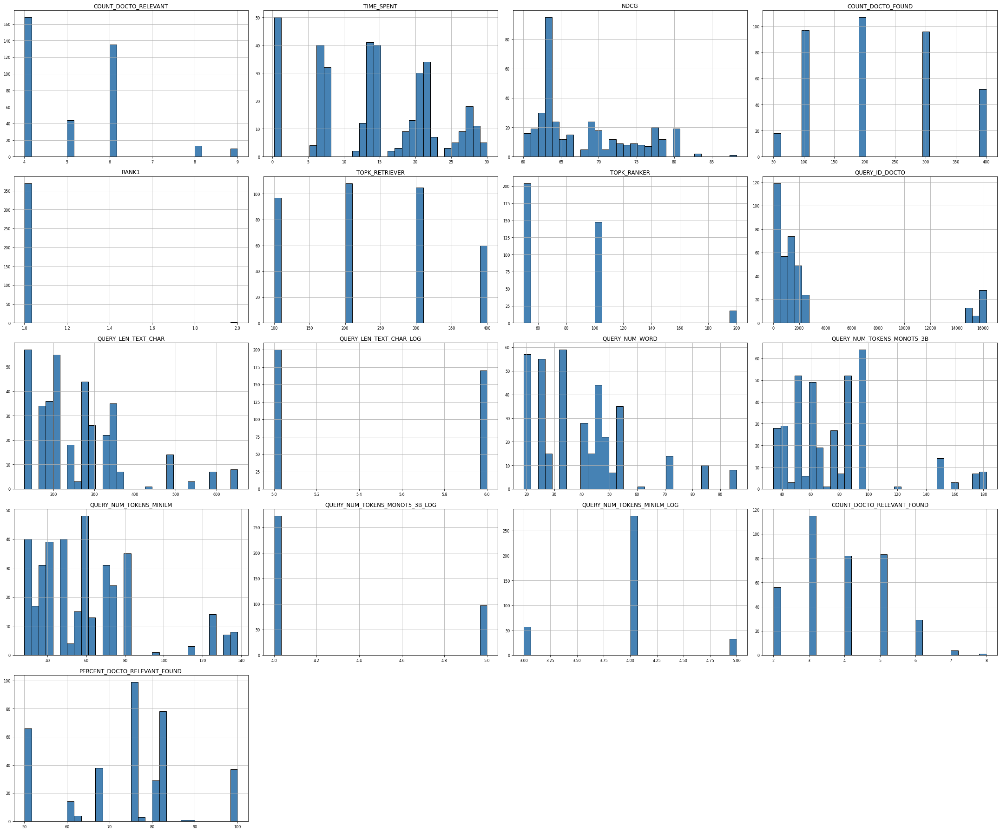

In [ ]:

fig, ax = plt.subplots(1, 1, figsize=(30,25))
ax.set_title('Histogram')
df_top.drop(['QUERY_ID','NDCG_LIMIT'],axis=1).hist(bins=30, color='steelblue', edgecolor='black', linewidth=1.0,
           xlabelsize=8, ylabelsize=8, grid=True, ax=ax)  
plt.tight_layout() 

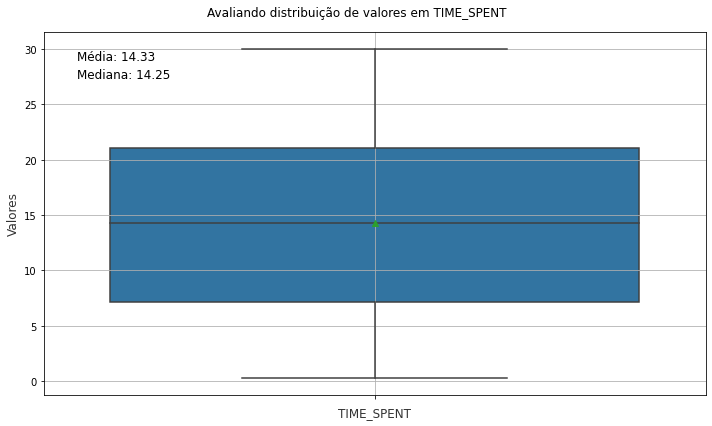

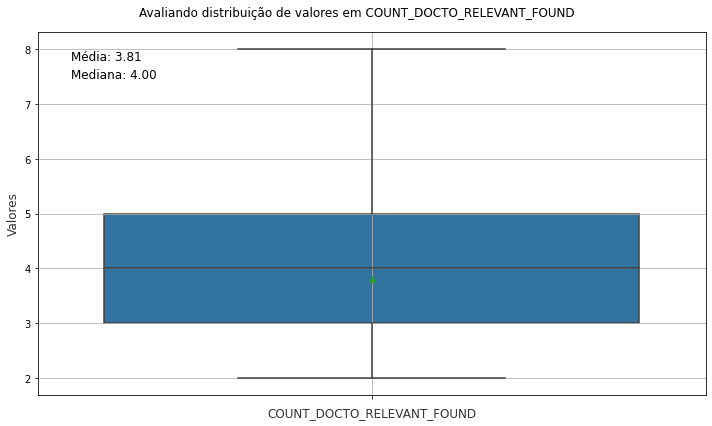

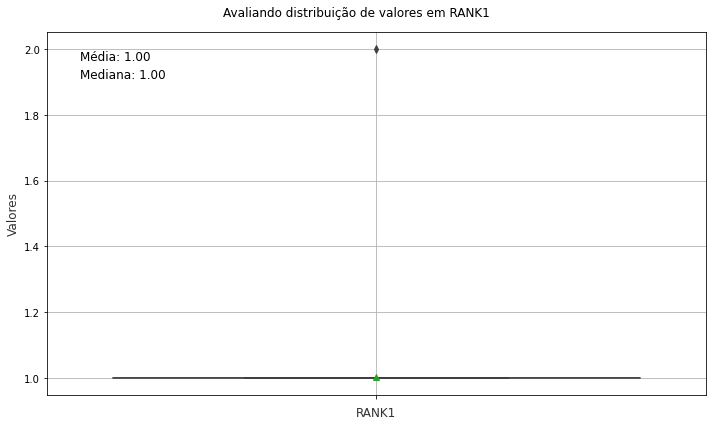

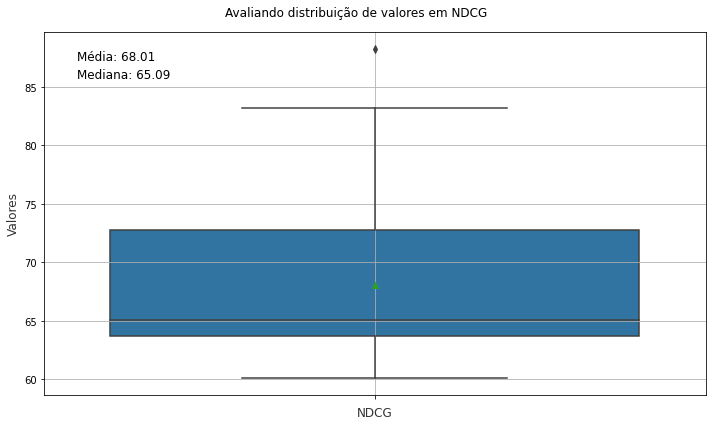

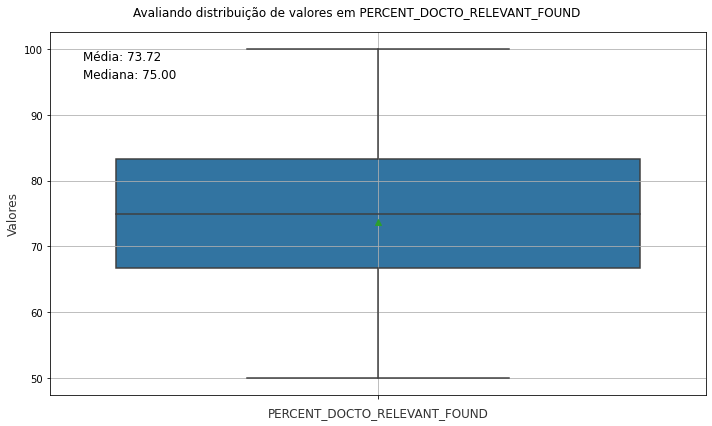

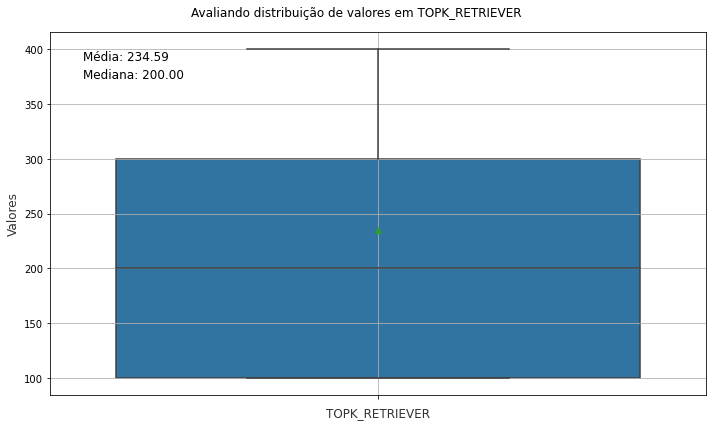

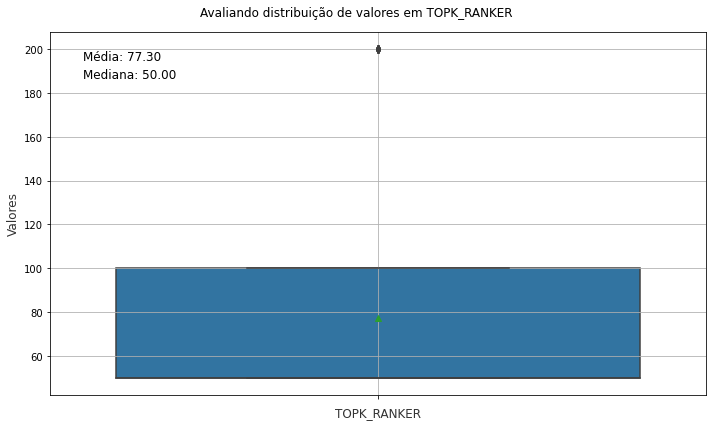

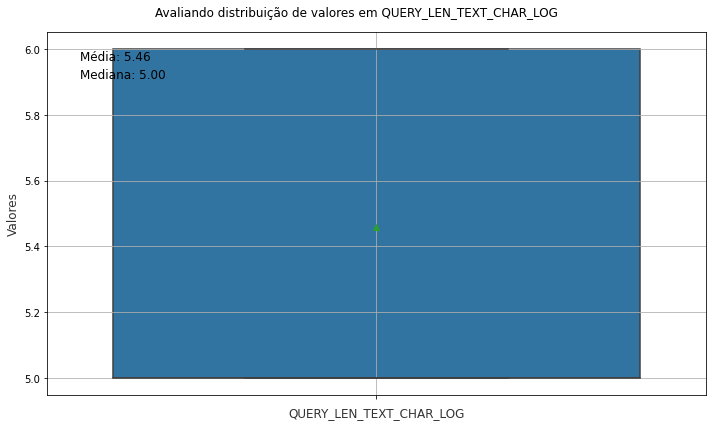

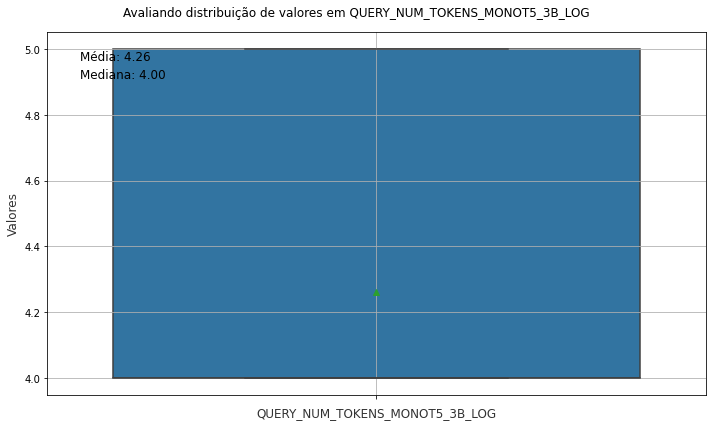

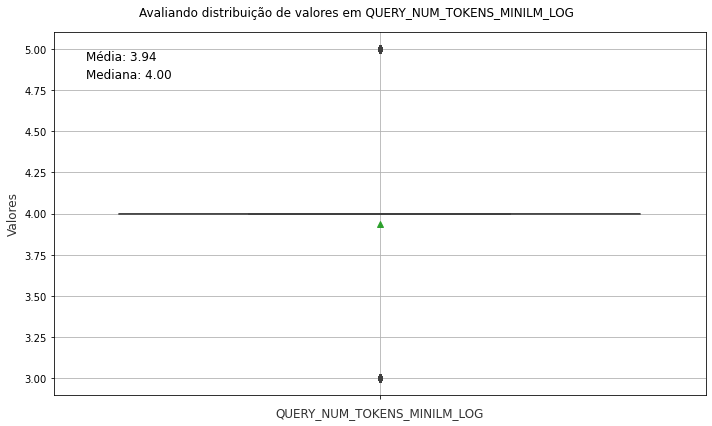

In [ ]:
metrics = {}
for column in ['TIME_SPENT', 'COUNT_DOCTO_RELEVANT_FOUND'] + list_metric + list_category: 
  if df_top[column].dtype != object:
    f, ax = plt.subplots(1, 1, figsize=(10,6))
    f.suptitle(f'Avaliando distribuição de valores em {column}')
    ax = sns.boxplot(y=column, data=df_top, showmeans=True, ax=ax)
    # Gráfico de disperção
    # ax = sns.stripplot(y=column, data=df_top, ax=ax) 

    # Calcula a média e mediana
    mean_val = round(df_top[column].mean(), 3)
    median_val = df_top[column].median()
    metrics[column] = {'media': mean_val, 'mediana':median_val}
    # Imprime a média e mediana no gráfico
    ax.text(0.05, 0.95, f'Média: {mean_val:.2f}', transform=ax.transAxes, fontsize=12, verticalalignment='top')
    ax.text(0.05, 0.9, f'Mediana: {median_val:.2f}', transform=ax.transAxes, fontsize=12, verticalalignment='top')

    plt.grid() 
    # sns.boxplot(data=df_top['{column}'], showmeans=True,  ax=ax)
    ax.set_xlabel(f"{column}",size = 12,alpha=0.8)
    ax.set_ylabel("Valores",size = 12,alpha=0.8)
    plt.xticks(rotation=60)
    plt.tight_layout()  
plt.show()

### Category evaluation

/home/borela/miniconda3/envs/relevar-busca/lib/python3.7/site-packages/ipykernel_launcher.py:42: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


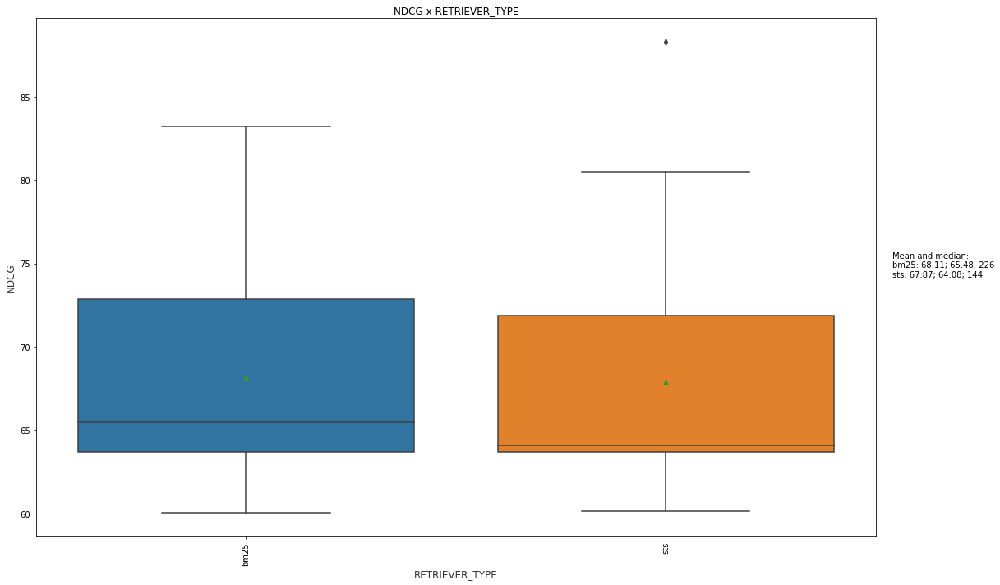

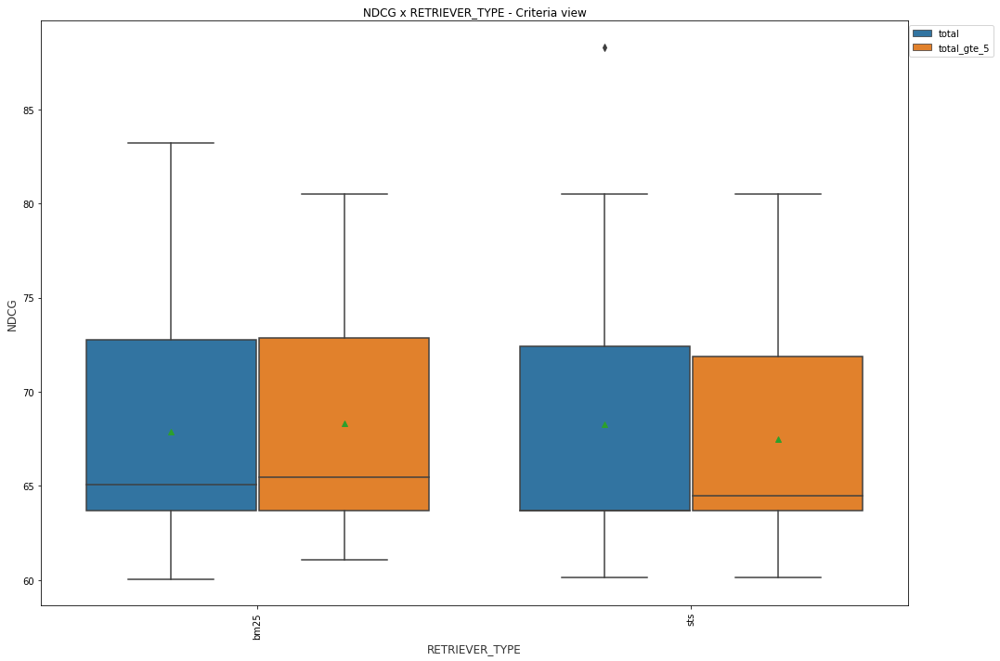

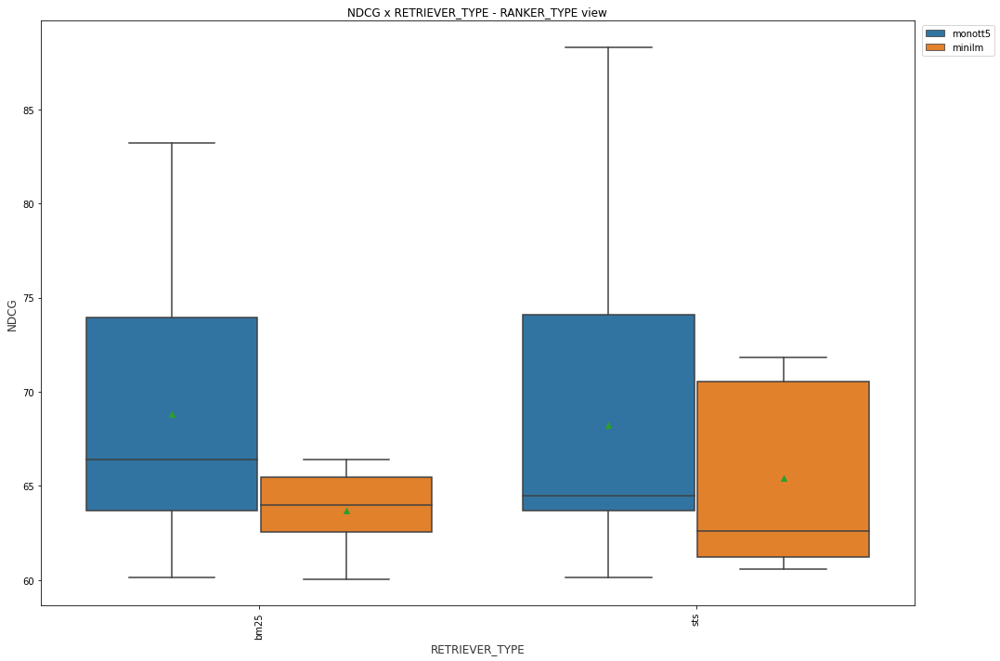

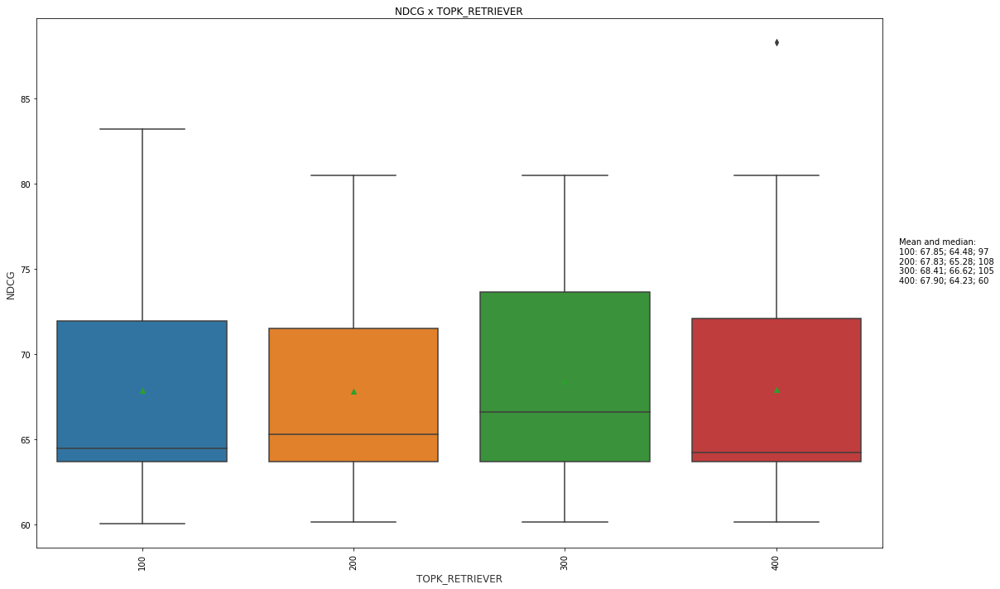

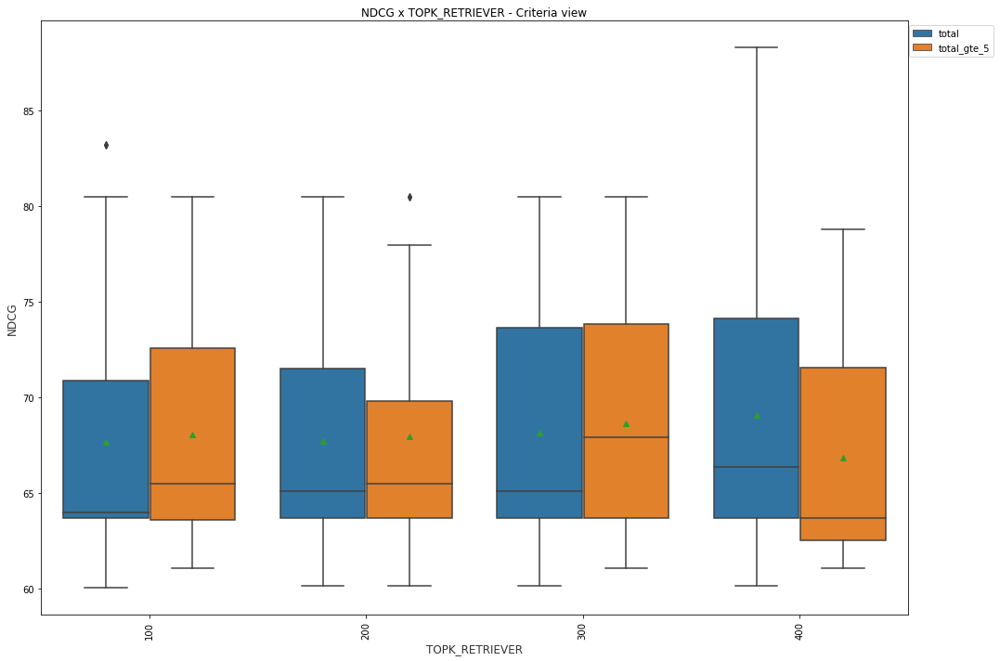

...

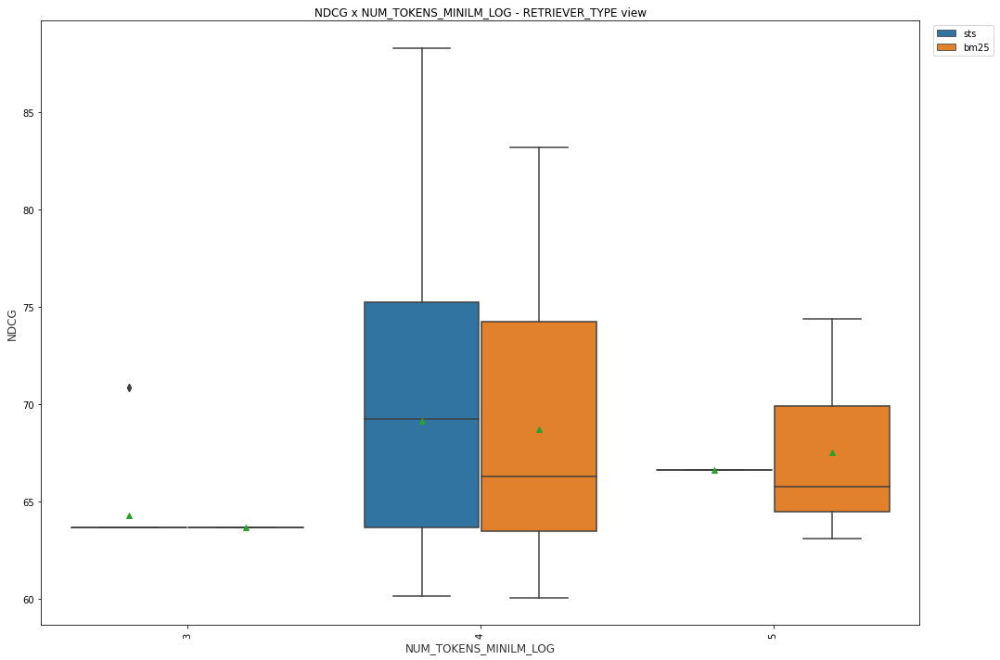

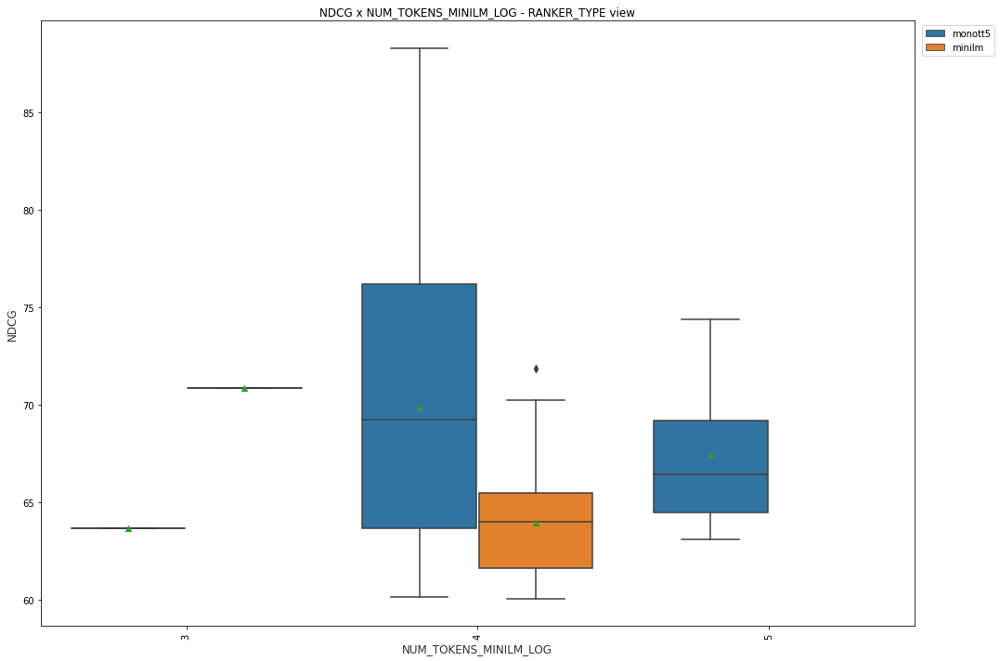

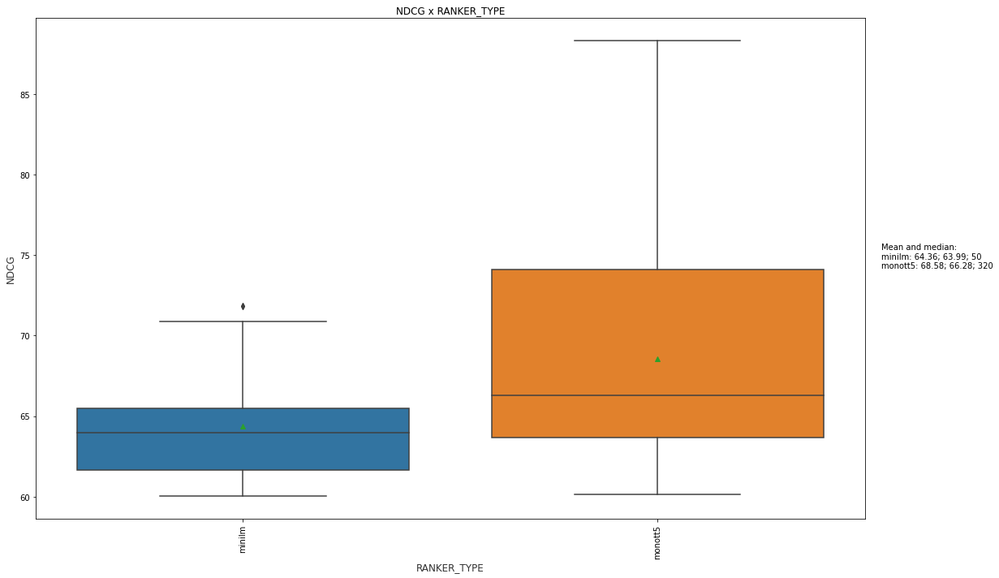

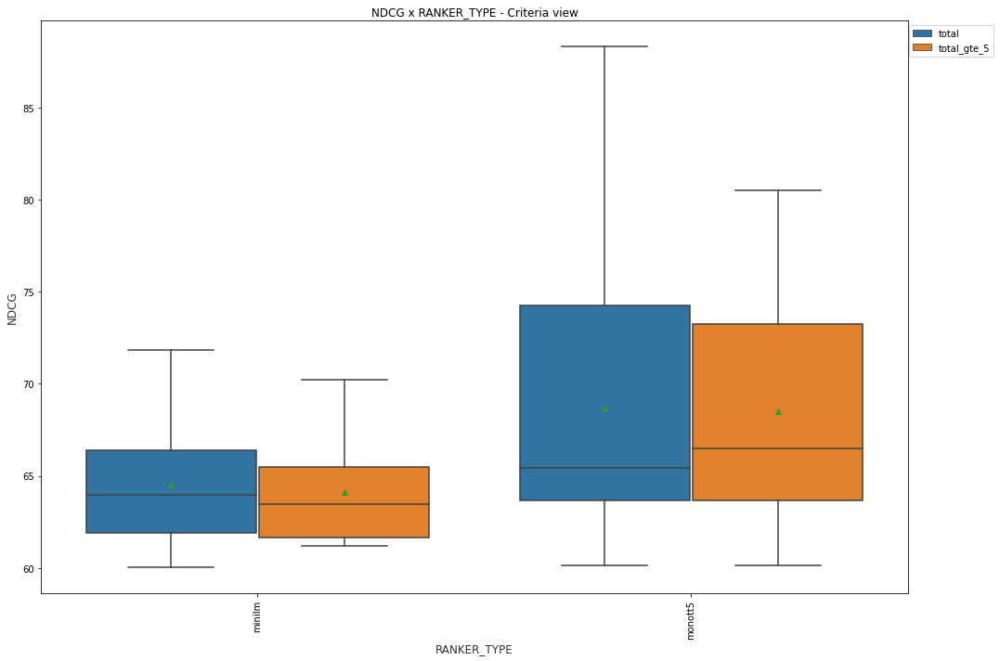

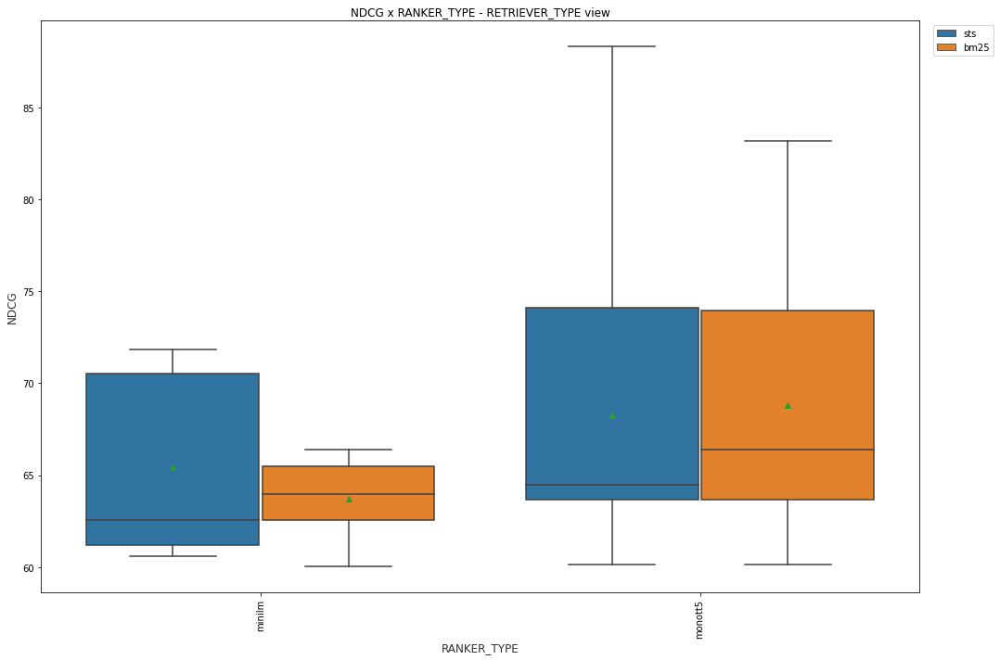

In [ ]:
for context in list_category: 
    for metric in ['NDCG']:
        
        # criar lista com valores únicos da coluna a ser ordenada
        # valores_unicos = sorted(df_top[context].unique())
        
        valores_unicos = sorted(df_top[context].dropna().unique())


        f, ax = plt.subplots(1, 1, figsize=(15,10))
        sns.boxplot(x=context, y=metric, data=df_top, showmeans=True, ax=ax, order=valores_unicos)
        ax.set_xlabel(context,size = 12,alpha=0.8)
        ax.set_ylabel(metric,size = 12,alpha=0.8)
        ax.set_title(f'{metric} x {context}')
        plt.xticks(rotation=90)
        plt.tight_layout()

        # Média e Mediana
        media = df_top.groupby(context)[metric].mean()
        mediana = df_top.groupby(context)[metric].median()
        count = df_top.groupby(context)[metric].count()
        mm_list = [f"{i}: {j:.2f}; {k:.2f}; {l:.0f}" for i,j,k,l in zip(media.index, media, mediana, count)]
        mm_str = "\n".join(mm_list)
        ax.text(1.02, 0.5, f"Mean and median:\n{mm_str}", transform=ax.transAxes)


# Selected configuration

In [180]:
df_result.shape

(11188, 31)

In [151]:
df_result[df_result['RANKER_MODEL_NAME']== 'unicamp-dl/mt5-3B-mmarco-en-pt-tokens-extra'].shape

(200, 31)

In [42]:
# df_result = df_result[(df_result['RANKER_TYPE']=='monot5') & (df_result['RANKER_MODEL_NAME']=='unicamp-dl/mt5-3B-mmarco-en-pt') & (df_result['TOPK_RANKER'] == 100)]
df_result = df_result[(df_result['RANKER_TYPE']=='monot5') & (df_result['RANKER_MODEL_NAME']=='unicamp-dl/mt5-3B-mmarco-en-pt')]

In [181]:
# df_result = df_result[(df_result['TOPK_RETRIEVER']==300) & (df_result['RETRIEVER_TYPE']=='bm25') &  (df_result['RANKER_MODEL_NAME']=='unicamp-dl/mt5-3B-mmarco-en-pt') ]
df_result = df_result[(df_result['TOPK_RETRIEVER']==300) & (df_result['RANKER_TYPE'].isin(['monot5', 'none']))] #  &  (df_result['RANKER_MODEL_NAME']=='unicamp-dl/mt5-3B-mmarco-en-pt') ]

In [182]:
df_result['RANKER_MODEL_NAME'].unique()

array(['unicamp-dl/mt5-3B-mmarco-en-pt', nan], dtype=object)

In [183]:
df_result.shape

(4588, 31)

## Separate found x not found

In [76]:
df_not_found = df_result[df_result['RANK1']==0]

In [77]:
df_not_found.shape

(515, 31)

In [78]:
df_result = df_result[df_result['RANK1']>0]

In [79]:
df_result.shape

(5871, 31)

In [80]:
del df_not_found['RANK1']

In [92]:
df_result[df_result['CRITERIA']=='extra']

,TIME_SPENT,NDCG,RANK1,COUNT_DOCTO_FOUND,LIST_RANK,COUNT_DOCTO_RELEVANT,GROUND_TRUTH,LIST_DOCTO_FOUND,RETRIEVER_TYPE,TOPK_RETRIEVER,...,QUERY_LEN_TEXT_CHAR,QUERY_LEN_TEXT_CHAR_LOG,QUERY_NUM_WORD,QUERY_NUM_TOKENS_MONOT5_3B,QUERY_NUM_TOKENS_MINILM,QUERY_NUM_TOKENS_MONOT5_3B_LOG,QUERY_NUM_TOKENS_MINILM_LOG,COUNT_DOCTO_RELEVANT_FOUND,PERCENT_DOCTO_RELEVANT_FOUND,RANKER_TYPE
407,21.5923,70.39,1,300,"[43, 1, 3]",3,"{2126: 'INDEXACAO_EXTRA', 4628: 'INDEXACAO_EXT...","[4628, 14871, 6082, 2858, 4614, 4633, 1101915,...",bm25,300,...,368,6,51,95,70,5,4,3,100.00,monot5
747,20.8911,100.00,1,300,[1],1,{14801: 'INDEXACAO_EXTRA'},"[14801, 1558, 1298, 2706, 3036, 1100212, 15426...",bm25,300,...,179,5,27,54,42,4,4,1,100.00,monot5
3131,20.7326,24.07,4,300,"[11, 60, 4]",5,"{327: 'INDEXACAO_EXTRA', 2126: 'INDEXACAO_EXTR...","[384, 777, 816, 6390, 1499, 16010, 15594, 2485...",bm25,300,...,249,6,36,67,59,4,4,3,60.00,monot5
7534,21.5682,27.66,3,300,"[3, 8, 16, 63]",5,"{874: 'INDEXACAO_EXTRA', 15301: 'INDEXACAO_EXT...","[547, 2865, 874, 1116074, 1727, 15915, 311, 23...",bm25,300,...,281,6,47,81,65,4,4,4,80.00,monot5
7582,21.3975,46.93,1,300,[1],3,"{5912: 'INDEXACAO_EXTRA', 15103: 'INDEXACAO_EX...","[14822, 342, 6390, 1100214, 1487, 15214, 11003...",bm25,300,...,160,5,22,42,36,4,4,1,33.33,monot5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11888,21.6176,58.56,1,300,"[3, 1, 23]",4,"{15098: 'INDEXACAO_EXTRA', 855: 'INDEXACAO_EXT...","[2651, 1100082, 855, 1412, 4206, 1995, 6124, 1...",bm25,300,...,324,6,50,105,93,5,5,3,75.00,monot5
11936,20.3094,63.09,2,300,[2],1,{4495: 'INDEXACAO_EXTRA'},"[1739, 4495, 1499, 5298, 1364, 3503, 6390, 270...",bm25,300,...,175,5,27,47,39,4,4,1,100.00,monot5
11984,19.6935,50.00,3,300,[3],1,{2786: 'INDEXACAO_EXTRA'},"[3503, 5298, 2786, 360, 6429, 2134, 2739, 359,...",bm25,300,...,129,5,20,32,31,3,3,1,100.00,monot5
12032,21.8645,14.61,4,300,"[179, 4, 89]",5,"{376: 'INDEXACAO_EXTRA', 15005: 'INDEXACAO_EXT...","[15426, 1116912, 251, 1142, 1759, 16010, 1730,...",bm25,300,...,491,6,77,147,112,5,5,3,60.00,monot5


## Some consolidated data

In [184]:
df_result.groupby(['RANKER_TYPE','CRITERIA', 'RETRIEVER_TYPE','TOPK_RANKER']).agg(dict_metrics)

RANK1                    \
                                                   count       mean median   
RANKER_TYPE CRITERIA    RETRIEVER_TYPE TOPK_RANKER                           
monot5      area        bm25           0.0           200   3.750000    2.0   
                        sts            0.0           100   3.750000    2.0   
                        sts_multihop   0.0           100   3.750000    2.0   
            class_termo sts_multihop   0.0           100  11.040000    1.0   
            extra       bm25           0.0            98  16.010204    3.0   
                        sts            0.0            98  20.428571    2.5   
                        sts_multihop   0.0            98  13.357143    1.0   
            subtheme    bm25           0.0           100  16.830000    1.0   
                        sts            0.0           100  23.140000    2.0   
                        sts_multihop   0.0           100  18.770000    1.0   
            theme       bm25           0.0           100  25.890000    2.0   
                        sts            0.0           100  24.600000    2.5   
                        sts_multihop   0.0           100  22.840000    2.0   
            total       bm25           0.0           300   4.250000    1.0   
                        sts            0.0           300   5.163333    1.0   
                        sts_multihop   0.0           100   8.760000    1.0   
            total_gte_5 bm25           0.0           300   3.316667    1.0   
                        sts            0.0           300   3.570000    1.0   
                        sts_multihop   0.0           100   3.630000    2.0   
none        area        bm25           0.0           100   5.590000    5.0   
                        sts            0.0           100   3.620000    3.0   
                        sts_multihop   0.0           100   4.370000    4.0   
            extra       bm25           0.0            98  26.734694    5.0   
                        sts            0.0            98  68.244898   25.5   
                        sts_multihop   0.0            98  71.979592   28.0   
            subtheme    bm25           0.0           100  38.090000    3.0   
                        sts            0.0           100  58.890000   18.5   
                        sts_multihop   0.0           100  62.310000   14.5   
            theme       bm25           0.0           100  29.410000    5.5   
                        sts            0.0           100  48.140000   19.5   
                        sts_multihop   0.0           100  62.140000   35.0   
            total       bm25           0.0           100   9.350000    2.0   
                        sts            0.0           100  38.750000   17.5   
                        sts_multihop   0.0           100  53.580000   28.0   
            total_gte_5 bm25           0.0           100   5.310000    5.0   
                        sts            0.0           100   3.470000    3.0   
                        sts_multihop   0.0           100   4.130000    3.5   

                                                    NDCG                     \
                                                   count       mean  median   
RANKER_TYPE CRITERIA    RETRIEVER_TYPE TOPK_RANKER                            
monot5      area        bm25           0.0           200  62.093700  63.090   
                        sts            0.0           100  62.093700  63.090   
                        sts_multihop   0.0           100  62.093700  63.090   
            class_termo sts_multihop   0.0           100  22.938100  22.675   
            extra       bm25           0.0            98  26.888776  20.920   
                        sts            0.0            98  23.573980  15.370   
                        sts_multihop   0.0            98  20.520612  13.330   
            subtheme    bm25           0.0           100  35.315000  13.945   
                        sts            0.0           100  32.

In [29]:
df_result.groupby(['CRITERIA','RANKER_TYPE', 'RETRIEVER_TYPE']).agg(dict_metrics).dropna()

RANK1                    NDCG  \
                                       count       mean median count   
CRITERIA    RANKER_TYPE RETRIEVER_TYPE                                 
area        monot5      sts_multihop     100   3.750000    2.0   100   
class_termo monot5      sts_multihop      86  12.837209    1.5    86   
extra       monot5      sts_multihop      73  17.931507    4.0    73   
subtheme    monot5      sts_multihop      66  28.439394    5.0    66   
theme       monot5      sts_multihop      96  23.791667    2.5    96   
total       monot5      bm25             700   3.507143    1.0   700   
                        join             100   7.500000    1.0   100   
                        sts              688   3.760174    1.0   688   
                        sts_multihop     181   6.933702    1.0   181   
total_gte_5 monot5      bm25             700   3.025714    1.0   700   
                        sts              692   3.333815    1.0   692   

                                                           \
                                             mean  median   
CRITERIA    RANKER_TYPE RETRIEVER_TYPE                      
area        monot5      sts_multihop    62.093700  63.090   
class_termo monot5      sts_multihop    26.672209  27.490   
extra       monot5      sts_multihop    27.548219  26.410   
subtheme    monot5      sts_multihop    46.235303  38.690   
theme       monot5      sts_multihop    54.689167  56.545   
total       monot5      bm25            39.337014  40.260   
                        join            37.202100  39.205   
                        sts             35.494055  35.380   
                        sts_multihop    30.189227  30.260   
total_gte_5 monot5      bm25            39.810414  39.960   
                        sts             36.411575  39.040   

                                       PERCENT_DOCTO_RELEVANT_FOUND  \
                                                              count   
CRITERIA    RANKER_TYPE RETRIEVER_TYPE                                
area        monot5      sts_multihop                            100   
class_termo monot5      sts_multihop                             86   
extra       monot5      sts_multihop                             73   
subtheme    monot5      sts_multihop                             66   
theme       monot5      sts_multihop                             96   
total       monot5      bm25                                    700   
                        join                                    100   
                        sts                                     688   
                        sts_multihop                            181   
total_gte_5 monot5      bm25                                    700   
                        sts                                     692   

                                                            
                                              mean  median  
CRITERIA    RANKER_TYPE RETRIEVER_TYPE                      
area        monot5      sts_multihop    100.000000  100.00  
class_termo monot5      sts_multihop     41.215233   40.00  
extra       monot5      sts_multihop     52.149178   50.00  
subtheme    monot5      sts_multihop    100.000000  100.00  
theme       monot5      sts_multihop    100.000000  100.00  
total       monot5      bm25             57.966686   57.14  
                        join             65.898100   66.67  
                        sts              50.890727   50.00  
                        sts_multihop     43.986077   40.00  
total_gte_5 monot5      bm25             61.557000   62.50  
                        sts              56.450014   55.56

In [68]:
df_result.groupby([ 'CRITERIA', 'RANKER_TYPE', 'RETRIEVER_TYPE']).agg(dict_metrics).dropna()

RANK1                    NDCG  \
                                       count       mean median count   
CRITERIA    RANKER_TYPE RETRIEVER_TYPE                                 
area        monot5      sts_multihop     100   3.750000    2.0   100   
class_termo monot5      sts_multihop      86  12.837209    1.5    86   
total       monot5      bm25             700   3.507143    1.0   700   
                        join             100   7.500000    1.0   100   
                        sts              688   3.760174    1.0   688   
                        sts_multihop     181   6.933702    1.0   181   
total_gte_5 monot5      bm25             700   3.025714    1.0   700   
                        sts              692   3.333815    1.0   692   

                                                           \
                                             mean  median   
CRITERIA    RANKER_TYPE RETRIEVER_TYPE                      
area        monot5      sts_multihop    62.093700  63.090   
class_termo monot5      sts_multihop    26.672209  27.490   
total       monot5      bm25            39.337014  40.260   
                        join            37.202100  39.205   
                        sts             35.494055  35.380   
                        sts_multihop    30.189227  30.260   
total_gte_5 monot5      bm25            39.810414  39.960   
                        sts             36.411575  39.040   

                                       PERCENT_DOCTO_RELEVANT_FOUND  \
                                                              count   
CRITERIA    RANKER_TYPE RETRIEVER_TYPE                                
area        monot5      sts_multihop                            100   
class_termo monot5      sts_multihop                             86   
total       monot5      bm25                                    700   
                        join                                    100   
                        sts                                     688   
                        sts_multihop                            181   
total_gte_5 monot5      bm25                                    700   
                        sts                                     692   

                                                            
                                              mean  median  
CRITERIA    RANKER_TYPE RETRIEVER_TYPE                      
area        monot5      sts_multihop    100.000000  100.00  
class_termo monot5      sts_multihop     41.215233   40.00  
total       monot5      bm25             57.966686   57.14  
                        join             65.898100   66.67  
                        sts              50.890727   50.00  
                        sts_multihop     43.986077   40.00  
total_gte_5 monot5      bm25             61.557000   62.50  
                        sts              56.450014   55.56

In [72]:
df_result.groupby([ 'RANKER_TYPE', 'CRITERIA', 'RETRIEVER_TYPE', 'TOPK_RETRIEVER']).agg({'TIME_SPENT':['count', 'mean', 'median'], 'COUNT_DOCTO_FOUND':['count', 'mean', 'median']})

TIME_SPENT             \
                                                           count       mean   
RANKER_TYPE CRITERIA    RETRIEVER_TYPE TOPK_RETRIEVER                         
monot5      area        sts_multihop   300                   100   0.743169   
            class_termo sts_multihop   300                    86  20.568570   
            total       bm25           100                   200   7.188654   
                                       200                   200  14.336542   
                                       300                   200  21.155666   
                                       400                   100  27.888086   
                        join           100                   100  24.302755   
                        sts            100                   190   6.966628   
                                       200                   198  13.763070   
                                       300                   200  20.325029   
                                       400                   100  26.862344   
                        sts_multihop   100                    81   6.964330   
                                       400                   100  27.666609   
            total_gte_5 bm25           100                   200   7.228233   
                                       200                   200  14.350307   
                                       300                   200  21.392300   
                                       400                   100  28.277349   
                        sts            100                   192   7.032529   
                                       200                   200  13.933342   
                                       300                   200  20.771878   
                                       400                   100  27.391167   

                                                                 \
                                                         median   
RANKER_TYPE CRITERIA    RETRIEVER_TYPE TOPK_RETRIEVER             
monot5      area        sts_multihop   300              0.74230   
            class_termo sts_multihop   300             20.66695   
            total       bm25           100              7.25090   
                                       200             14.35840   
                                       300             21.21690   
                                       400             27.85395   
                        join           100             24.22370   
                        sts            100              7.05295   
                                       200             13.83305   
                                       300             20.45715   
                                       400             26.99940   
                        sts_multihop   100              7.04090   
                                       400             27.72925   
            total_gte_5 bm25           100              7.25850   
                                       200             14.38840   
                                       300             21.39225   
                                       400             28.27050   
                        sts            100              7.07995   
                                       200             13.93640   
                                       300             20.82485   
                                       400             27.35480   

                                                      COUNT_DOCTO_FOUND  \
                                                                  count   
RANKER_TYPE CRITERIA    RETRIEVER_TYPE TOPK_RETRIEVER                     
monot5      area        sts_multihop   300                          100   
            class_termo sts_multihop   300                           86   
            total       bm25           100                          200   
                                       200                          200   
                       

In [74]:
df_result.groupby(['RANKER_TYPE', 'CRITERIA',  'RETRIEVER_TYPE', 'TOPK_RETRIEVER']).agg(dict_metrics).dropna()

RANK1                    \
                                                      count       mean median   
RANKER_TYPE CRITERIA    RETRIEVER_TYPE TOPK_RETRIEVER                           
monot5      area        sts_multihop   300              100   3.750000    2.0   
            class_termo sts_multihop   300               86  12.837209    1.5   
            total       bm25           100              200   2.870000    1.0   
                                       200              200   3.520000    1.0   
                                       300              200   4.100000    1.0   
                                       400              100   3.570000    1.0   
                        join           100              100   7.500000    1.0   
                        sts            100              190   3.547368    1.0   
                                       200              198   3.858586    1.0   
                                       300              200   3.810000    1.0   
                                       400              100   3.870000    1.0   
                        sts_multihop   100               81   7.444444    1.0   
                                       400              100   6.520000    1.0   
            total_gte_5 bm25           100              200   2.820000    1.0   
                                       200              200   2.810000    1.0   
                                       300              200   3.160000    1.0   
                                       400              100   3.600000    1.0   
                        sts            100              192   2.645833    1.0   
                                       200              200   3.330000    1.0   
                                       300              200   3.540000    1.0   
                                       400              100   4.250000    1.0   

                                                       NDCG             \
                                                      count       mean   
RANKER_TYPE CRITERIA    RETRIEVER_TYPE TOPK_RETRIEVER                    
monot5      area        sts_multihop   300              100  62.093700   
            class_termo sts_multihop   300               86  26.672209   
            total       bm25           100              200  38.850500   
                                       200              200  38.970200   
                                       300              200  39.937200   
                                       400              100  39.843300   
                        join           100              100  37.202100   
                        sts            100              190  34.133684   
                                       200              198  35.934141   
                                       300              200  36.021900   
                                       400              100  36.151700   
                        sts_multihop   100               81  27.546296   
                                       400              100  32.330000   
            total_gte_5 bm25           100              200  39.204600   
                                       200              200  40.248900   
                                       300              200  39.915000   
                                       400              100  39.935900   
                        sts            100              192  36.833333   
                                       200              200  36.033000   
                                       300              200  36.669900   
                                       400              100  35.842300   

                                                               \
                                                       median   
RANKER_TYPE CRITERIA    RETRIEVER_TYPE TOPK_RETRIEVER           
monot5      area        sts_multihop   300             63.090   
            class_termo sts_multihop   300             27.490   
       

In [71]:
df_result.groupby(['RANKER_TYPE', 'RETRIEVER_TYPE', 'CRITERIA', 'TOPK_RETRIEVER']).agg(dict_metrics).dropna()

RANK1                    \
                                                      count       mean median   
RANKER_TYPE RETRIEVER_TYPE CRITERIA    TOPK_RETRIEVER                           
monot5      bm25           total       100              200   2.870000    1.0   
                                       200              200   3.520000    1.0   
                                       300              200   4.100000    1.0   
                                       400              100   3.570000    1.0   
                           total_gte_5 100              200   2.820000    1.0   
                                       200              200   2.810000    1.0   
                                       300              200   3.160000    1.0   
                                       400              100   3.600000    1.0   
            join           total       100              100   7.500000    1.0   
            sts            total       100              190   3.547368    1.0   
                                       200              198   3.858586    1.0   
                                       300              200   3.810000    1.0   
                                       400              100   3.870000    1.0   
                           total_gte_5 100              192   2.645833    1.0   
                                       200              200   3.330000    1.0   
                                       300              200   3.540000    1.0   
                                       400              100   4.250000    1.0   
            sts_multihop   area        300              100   3.750000    2.0   
                           class_termo 300               86  12.837209    1.5   
                           total       100               81   7.444444    1.0   
                                       400              100   6.520000    1.0   

                                                       NDCG             \
                                                      count       mean   
RANKER_TYPE RETRIEVER_TYPE CRITERIA    TOPK_RETRIEVER                    
monot5      bm25           total       100              200  38.850500   
                                       200              200  38.970200   
                                       300              200  39.937200   
                                       400              100  39.843300   
                           total_gte_5 100              200  39.204600   
                                       200              200  40.248900   
                                       300              200  39.915000   
                                       400              100  39.935900   
            join           total       100              100  37.202100   
            sts            total       100              190  34.133684   
                                       200              198  35.934141   
                                       300              200  36.021900   
                                       400              100  36.151700   
                           total_gte_5 100              192  36.833333   
                                       200              200  36.033000   
                                       300              200  36.669900   
                                       400              100  35.842300   
            sts_multihop   area        300              100  62.093700   
                           class_termo 300               86  26.672209   
                           total       100               81  27.546296   
                                       400              100  32.330000   

                                                               \
                                                       median   
RANKER_TYPE RETRIEVER_TYPE CRITERIA    TOPK_RETRIEVER           
monot5      bm25           total       100             41.530   
                                       200             39.425   
       

In [75]:
df_not_found.groupby(['CRITERIA','RETRIEVER_TYPE','RANKER_TYPE']).agg({'COUNT_DOCTO_RELEVANT': ['count','mean','median']})

COUNT_DOCTO_RELEVANT                 
                                                      count      mean median
CRITERIA    RETRIEVER_TYPE RANKER_TYPE                                      
class_termo sts_multihop   monot5                        14  5.785714    6.0
total       sts            monot5                        12  5.000000    5.0
            sts_multihop   monot5                        19  5.789474    6.0
total_gte_5 sts            monot5                         8  5.500000    5.0

## Found x Not found

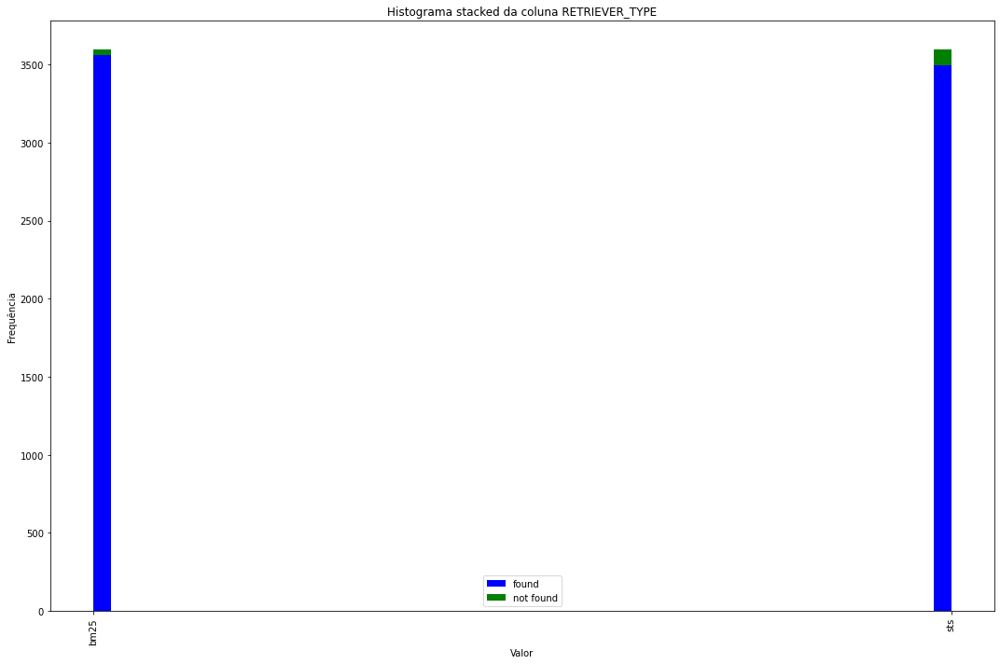

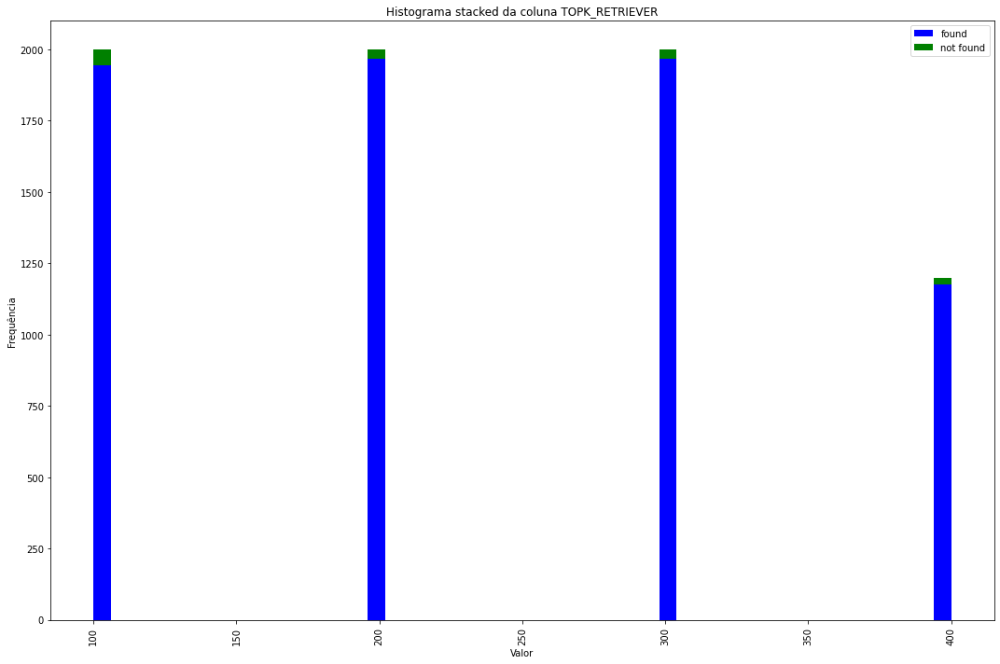

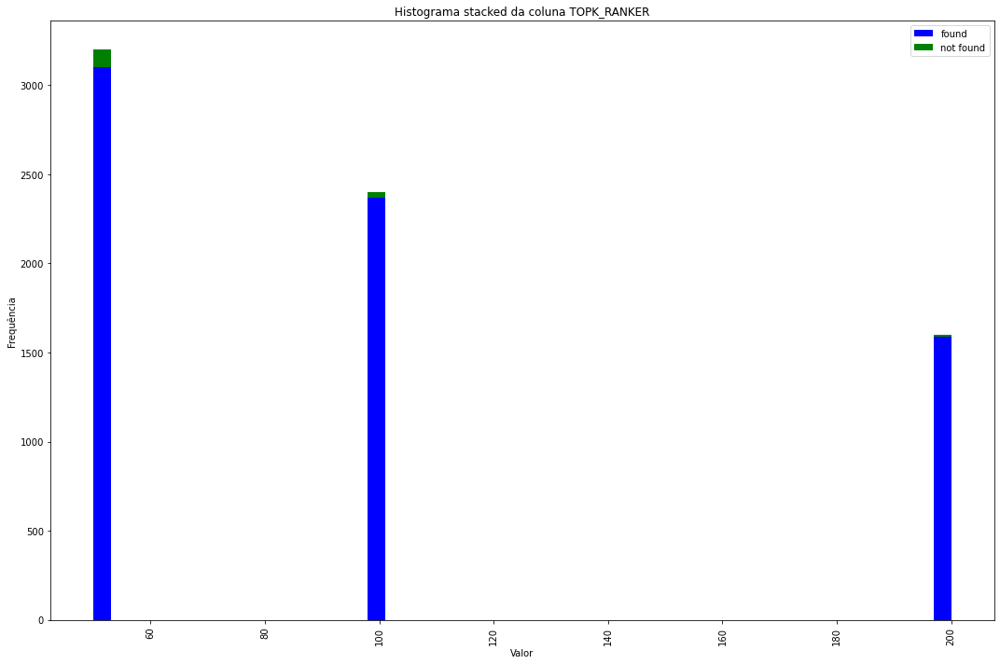

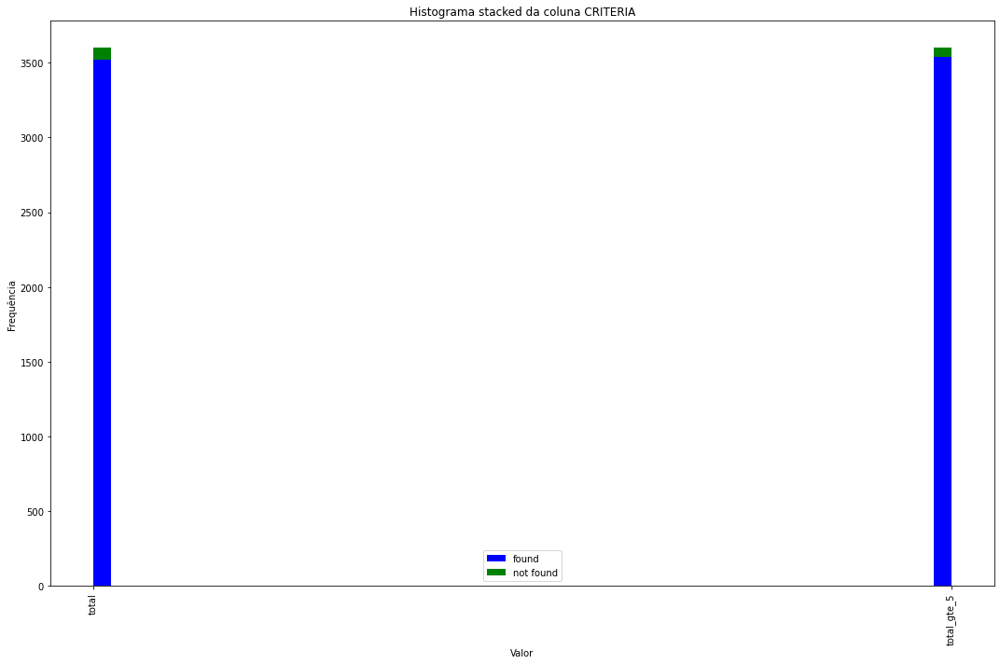

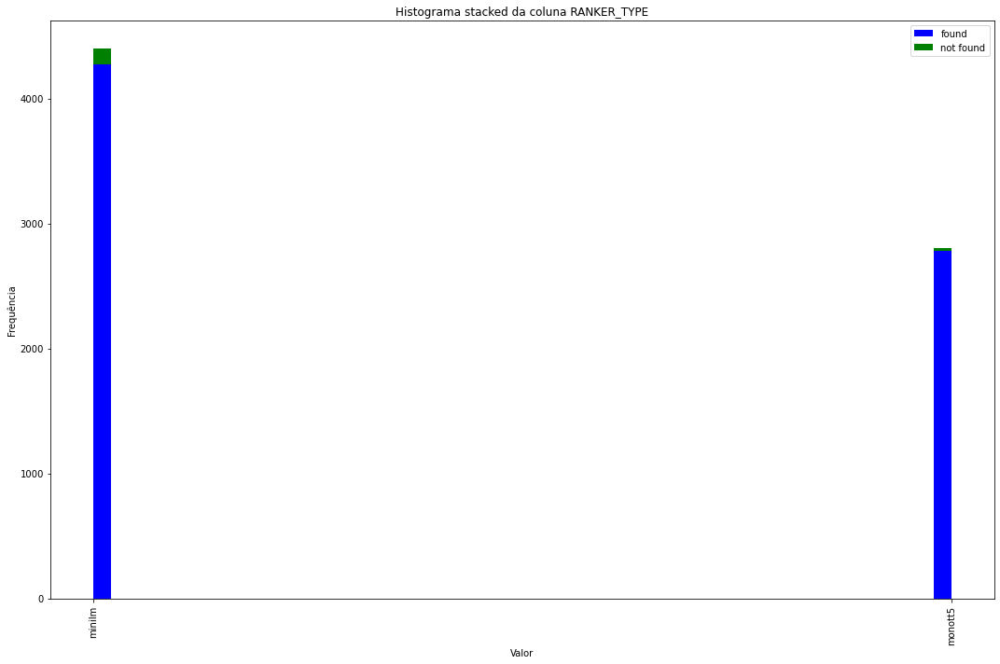

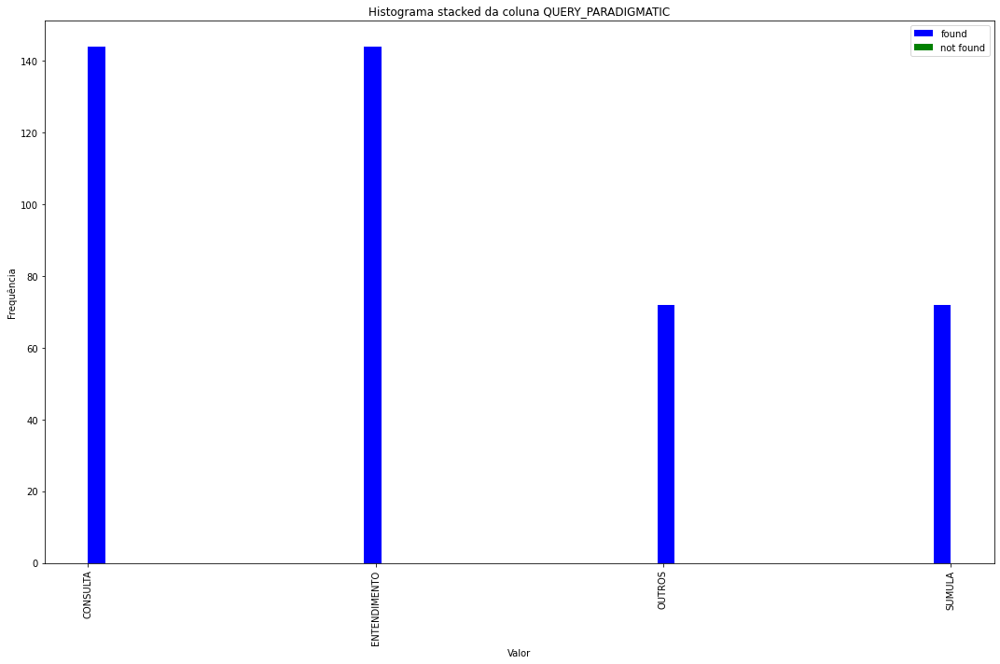

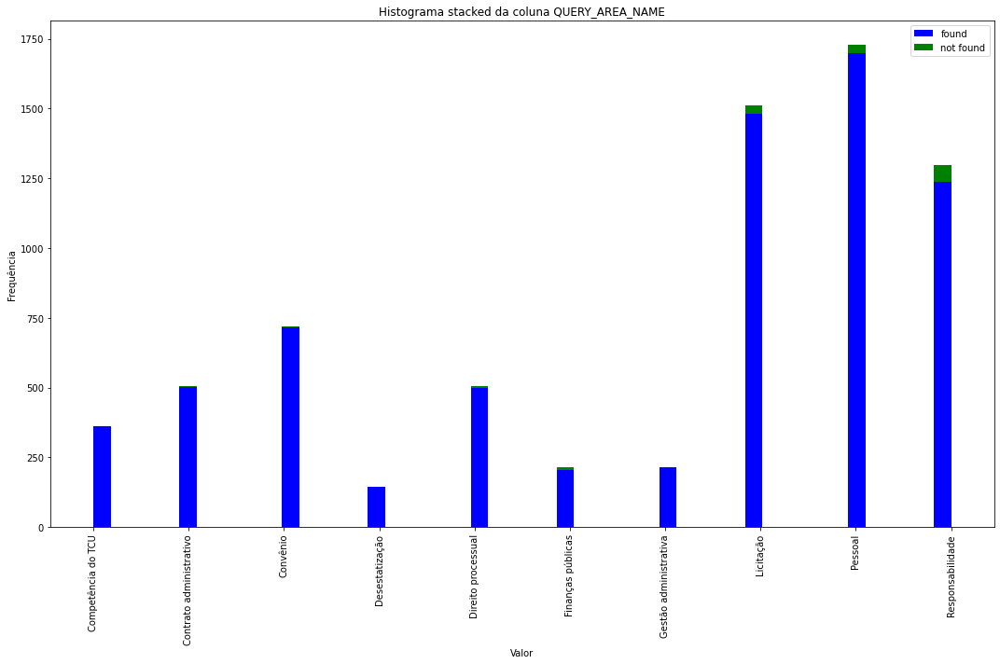

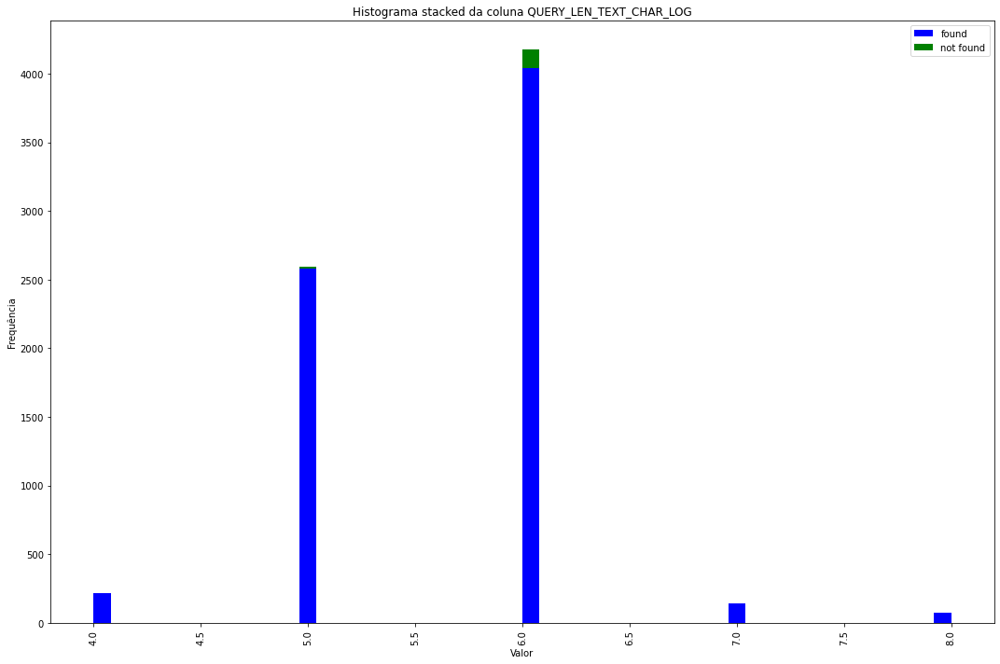

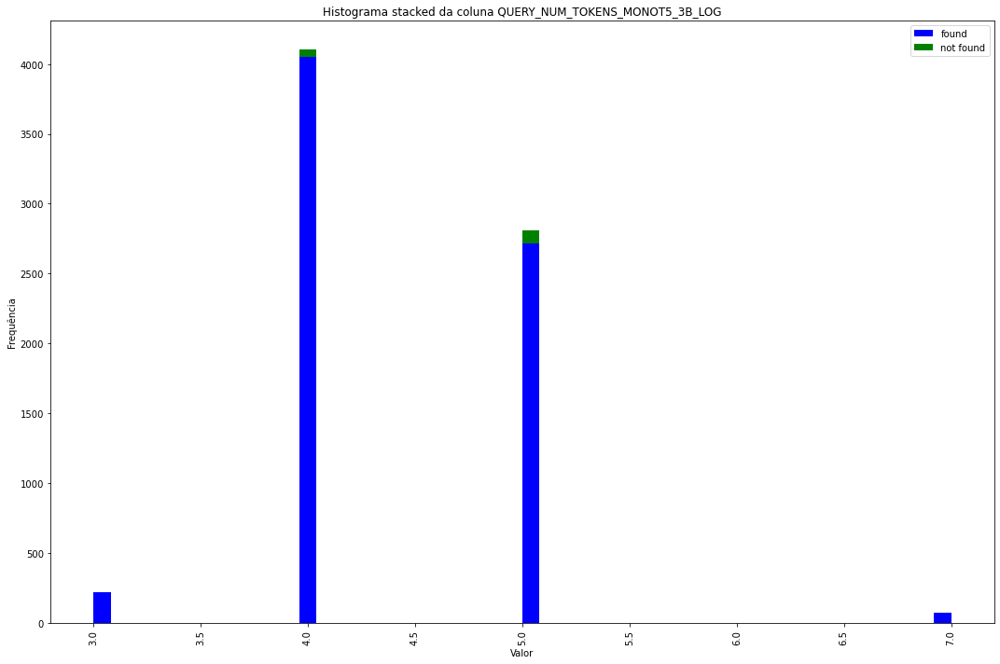

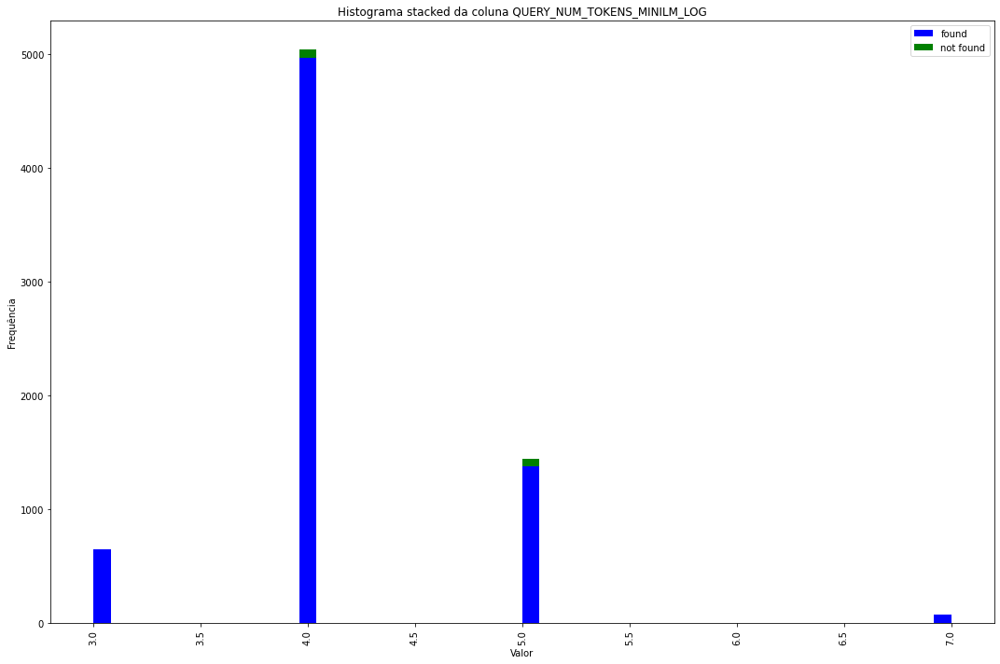

In [ ]:
for coluna in list_category:
    f, ax = plt.subplots(1, 1, figsize=(15,10))
    plt.hist([df_result.sort_values(by=coluna)[coluna].dropna(), df_not_found.sort_values(by=coluna)[coluna].dropna()], color=['blue', 'green'], label=['found', 'not found'], stacked=True, bins=50)


    plt.legend()
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.title(f'Stacked histogram {coluna}: found x not found')
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

## Category evaluation

/home/borela/miniconda3/envs/relevar-busca/lib/python3.7/site-packages/ipykernel_launcher.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


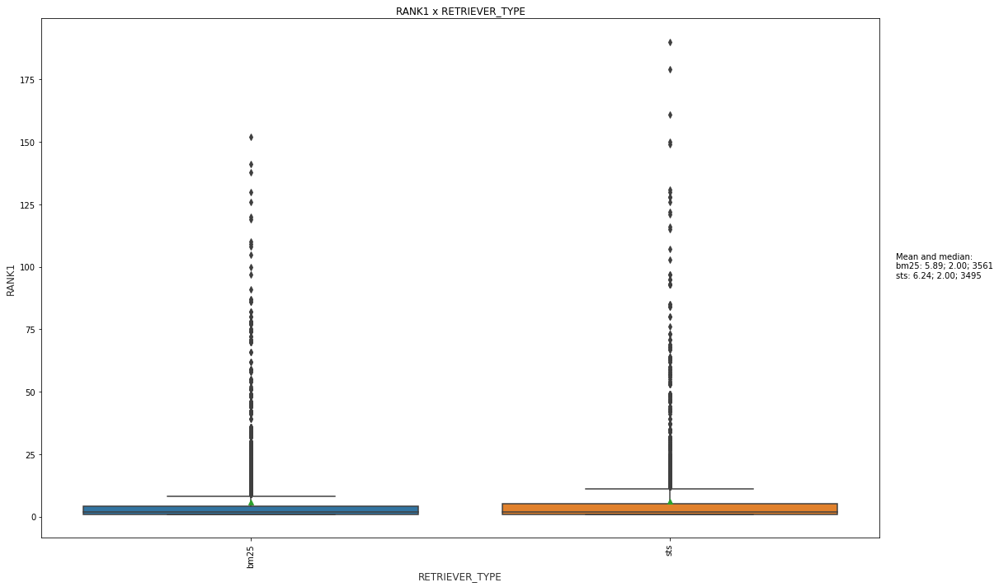

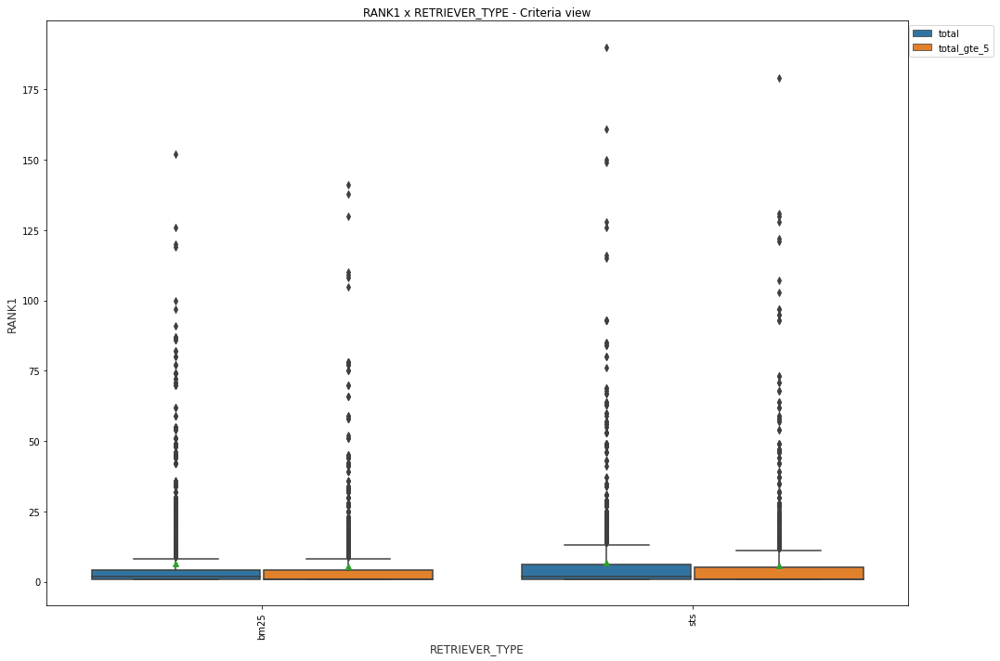

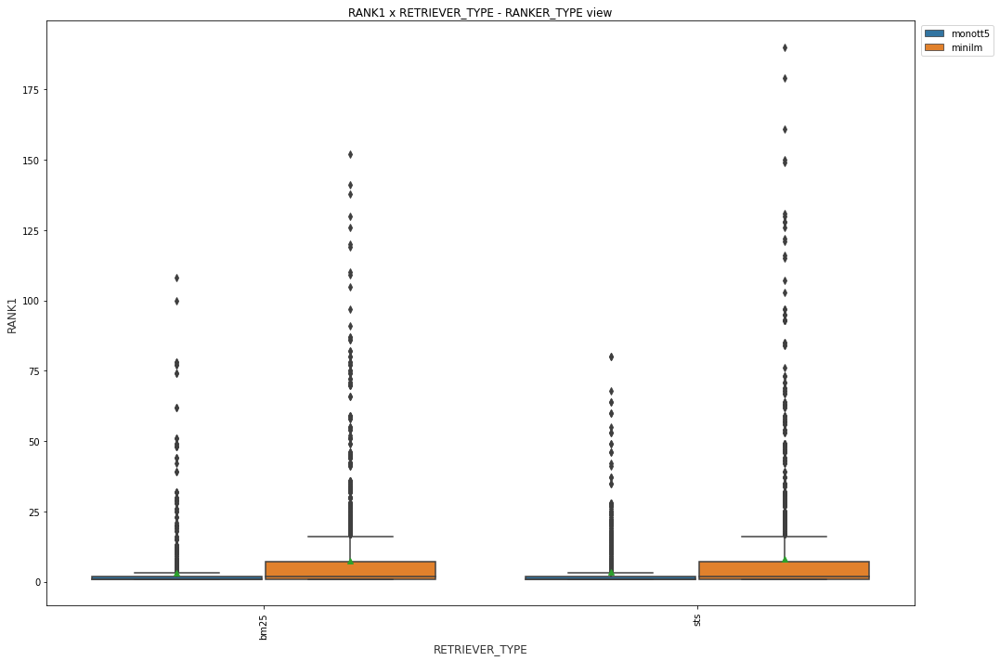

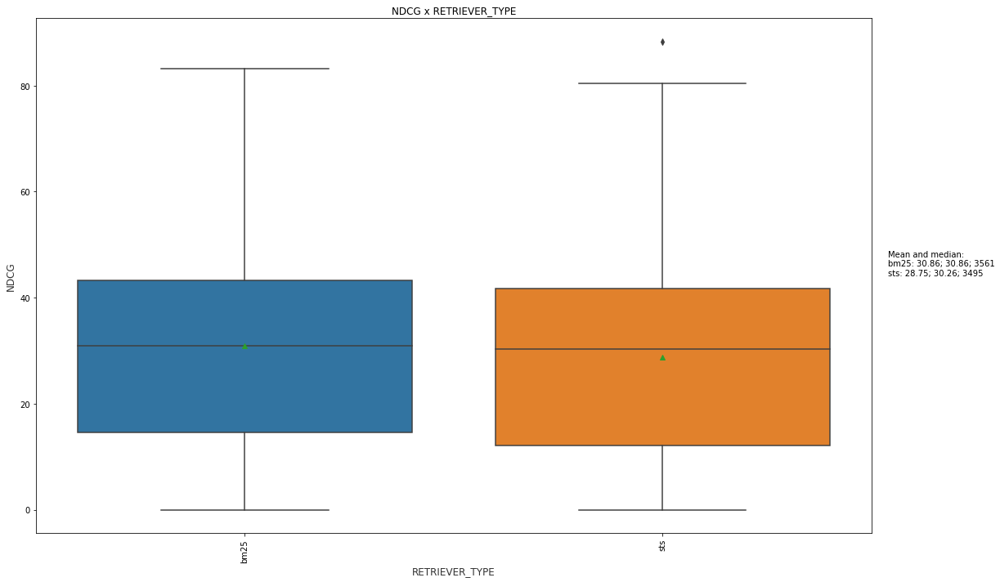

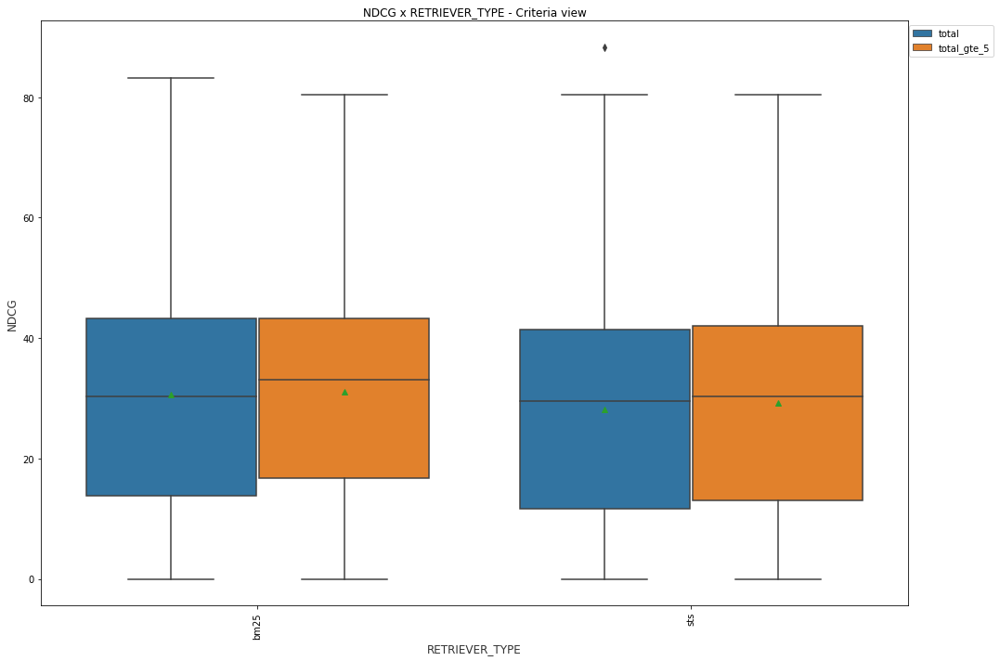

...

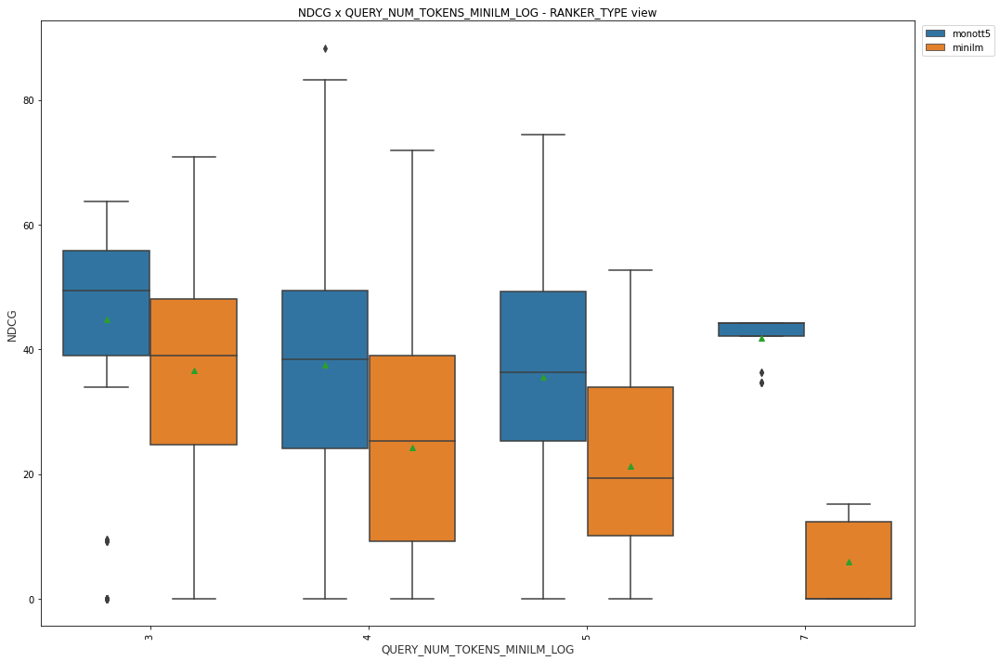

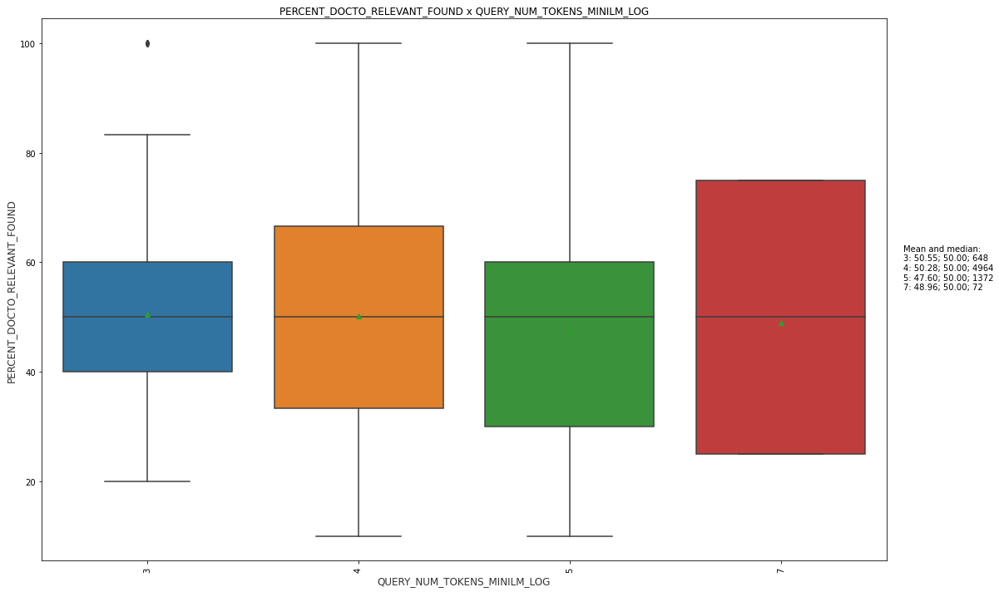

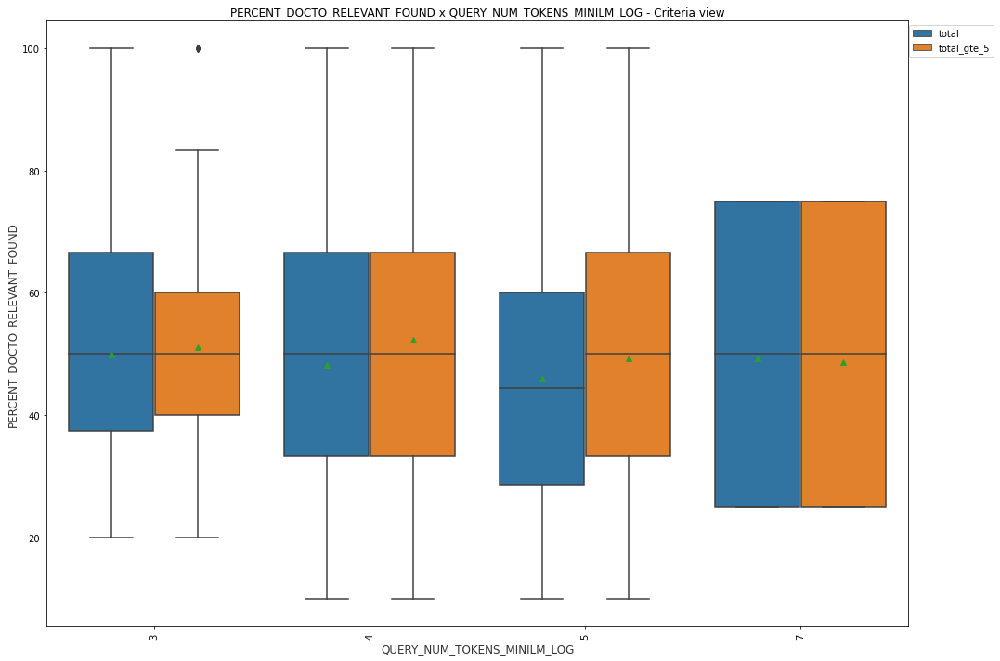

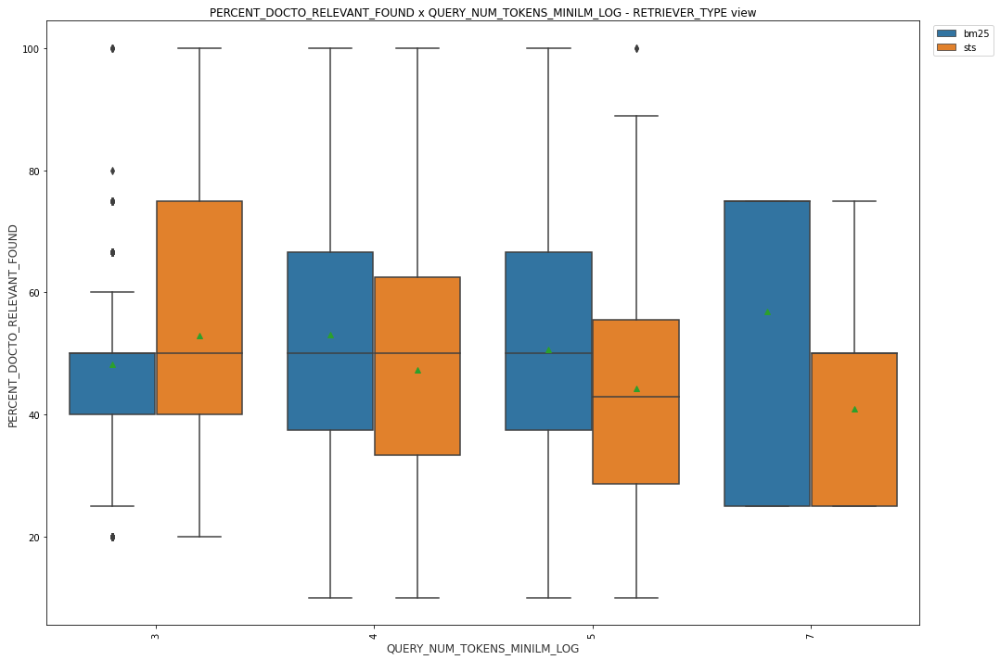

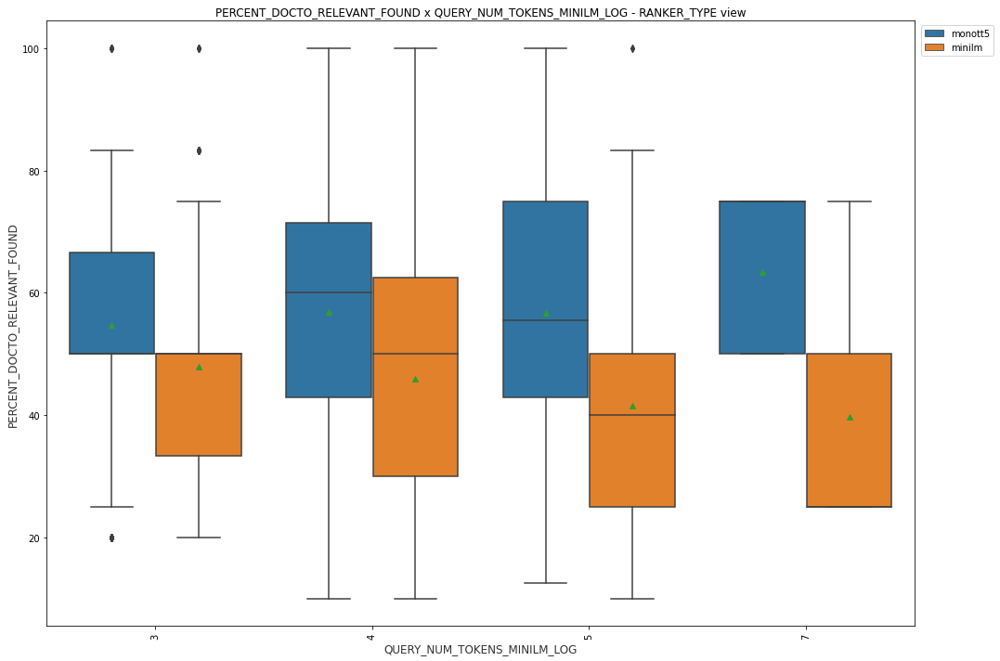

In [ ]:
for context in list_category: 
    for metric in list_metric:
        
        # criar lista com valores únicos da coluna a ser ordenada
        # valores_unicos = sorted(df_result[context].unique())
        
        valores_unicos = sorted(df_result[context].dropna().unique())


        f, ax = plt.subplots(1, 1, figsize=(15,10))
        sns.boxplot(x=context, y=metric, data=df_result, showmeans=True, ax=ax, order=valores_unicos)
        ax.set_xlabel(context,size = 12,alpha=0.8)
        ax.set_ylabel(metric,size = 12,alpha=0.8)
        ax.set_title(f'{metric} x {context}')
        plt.xticks(rotation=90)
        plt.tight_layout()

        # Média e Mediana
        media = df_result.groupby(context)[metric].mean()
        mediana = df_result.groupby(context)[metric].median()
        count = df_result.groupby(context)[metric].count()
        mm_list = [f"{i}: {j:.2f}; {k:.2f}; {l:.0f}" for i,j,k,l in zip(media.index, media, mediana, count)]
        mm_str = "\n".join(mm_list)
        ax.text(1.02, 0.5, f"Mean and median:\n{mm_str}", transform=ax.transAxes)

        if context != 'CRITERIA':
            
            f, ax = plt.subplots(1, 1, figsize=(15,10))
            sns.boxplot(x=context, y=metric, hue='CRITERIA' , data=df_result, showmeans=True, ax=ax, order=valores_unicos)
            f.subplots_adjust(top=0.5)


            ax.set_xlabel(context,size = 12,alpha=0.8)
            ax.set_ylabel(metric,size = 12,alpha=0.8)
            ax.set_title(f'{metric} x {context} - Criteria view')
            ax.legend(bbox_to_anchor=(1.05, 1), loc='upper center', ncol=1)
            plt.xticks(rotation=90)
            plt.tight_layout()

        if context != 'RETRIEVER_TYPE':
            
            f, ax = plt.subplots(1, 1, figsize=(15,10))
            sns.boxplot(x=context, y=metric, hue='RETRIEVER_TYPE' , data=df_result, showmeans=True, ax=ax, order=valores_unicos)
            f.subplots_adjust(top=0.5)


            ax.set_xlabel(context,size = 12,alpha=0.8)
            ax.set_ylabel(metric,size = 12,alpha=0.8)
            ax.set_title(f'{metric} x {context} - RETRIEVER_TYPE view')
            ax.legend(bbox_to_anchor=(1.05, 1), loc='upper center', ncol=1)
            plt.xticks(rotation=90)
            plt.tight_layout()

        if context != 'RANKER_TYPE':
            f, ax = plt.subplots(1, 1, figsize=(15,10))
            sns.boxplot(x=context, y=metric, hue='RANKER_TYPE' , data=df_result, showmeans=True, ax=ax, order=valores_unicos)
            f.subplots_adjust(top=0.5)


            ax.set_xlabel(context,size = 12,alpha=0.8)
            ax.set_ylabel(metric,size = 12,alpha=0.8)
            ax.set_title(f'{metric} x {context} - RANKER_TYPE view')
            ax.legend(bbox_to_anchor=(1.05, 1), loc='upper center', ncol=1)
            plt.xticks(rotation=90)
            plt.tight_layout()

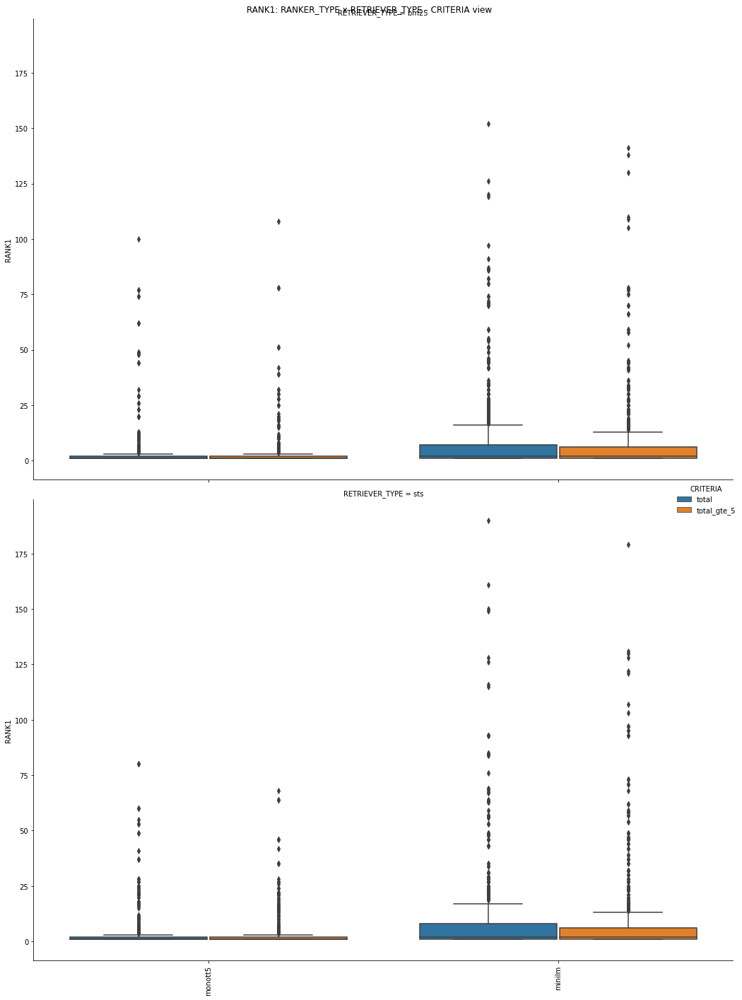

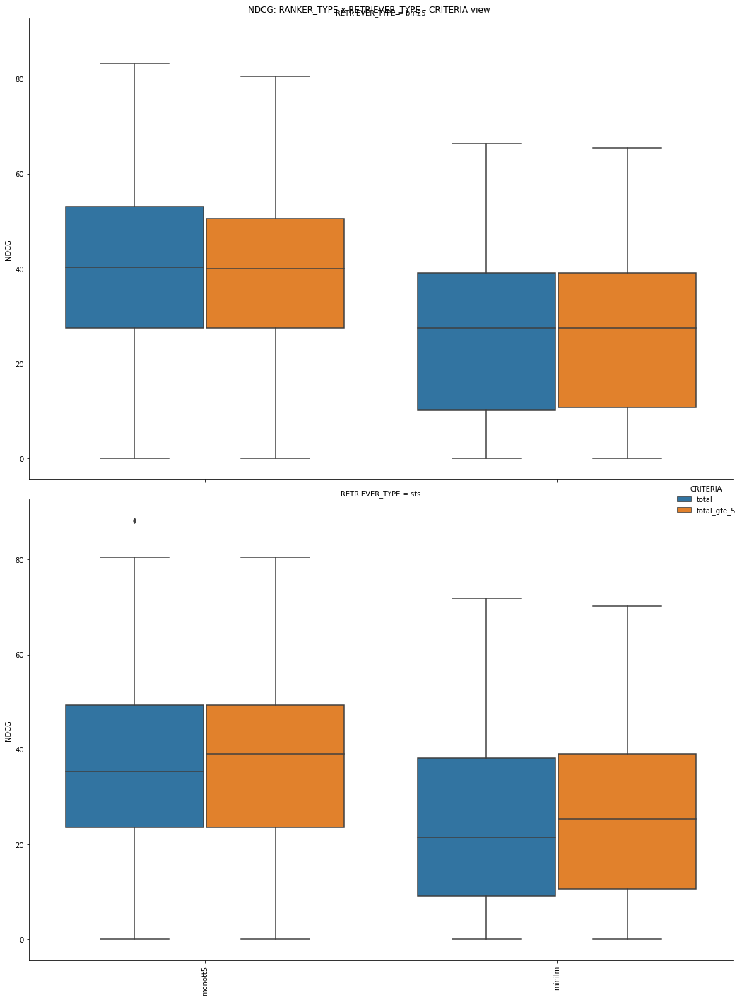

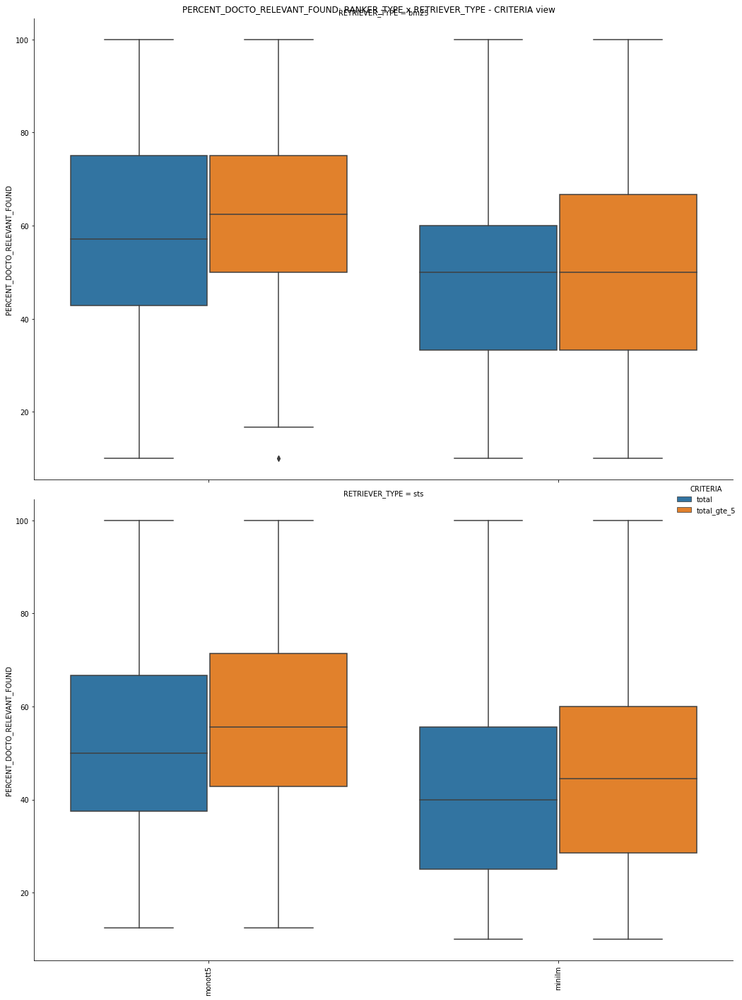

In [ ]:
for metric in list_metric:
    g = sns.catplot(x="RANKER_TYPE", sharex=True, y=metric, hue="CRITERIA", row="RETRIEVER_TYPE", kind="box", data=df_result, height=10, aspect=20/15)
    g.fig.suptitle(f"{metric}: RANKER_TYPE x RETRIEVER_TYPE - CRITERIA view")
    g.set_xticklabels(rotation=90)
    g.set_axis_labels("", metric)
    plt.tight_layout()
plt.show()

STS encontrou mais (percent_found)
BM25 alcançou ndcg melhor entre os 12 primeiros


In [ ]:
df_result.corr()

,COUNT_DOCTO_RELEVANT,TIME_SPENT,NDCG,COUNT_DOCTO_FOUND,RANK1,TOPK_RETRIEVER,TOPK_RANKER,NDCG_LIMIT,QUERY_ID,QUERY_ID_DOCTO,QUERY_LEN_TEXT_CHAR,QUERY_LEN_TEXT_CHAR_LOG,QUERY_NUM_WORD,QUERY_NUM_TOKENS_MONOT5_3B,QUERY_NUM_TOKENS_MINILM,QUERY_NUM_TOKENS_MONOT5_3B_LOG,QUERY_NUM_TOKENS_MINILM_LOG,COUNT_DOCTO_RELEVANT_FOUND,PERCENT_DOCTO_RELEVANT_FOUND
COUNT_DOCTO_RELEVANT,1.000000,0.013206,-0.253396,0.008190,0.169028,-0.009742,0.007391,NaN,-0.109893,-0.015374,-0.047578,0.254118,-0.052618,-0.050033,-0.051838,0.245551,0.104871,0.298150,-0.244072
TIME_SPENT,0.013206,1.000000,0.291301,0.842056,-0.126671,0.302145,-0.380393,NaN,0.004916,0.003268,0.011115,0.024252,0.011389,0.011521,0.011831,0.023282,0.024871,0.338254,0.332312
NDCG,-0.253396,0.291301,1.000000,0.196392,-0.513955,-0.004537,-0.154947,NaN,-0.039241,0.027306,-0.114001,-0.209009,-0.111374,-0.112311,-0.112368,-0.169303,-0.154749,0.313878,0.463934
COUNT_DOCTO_FOUND,0.008190,0.842056,0.196392,1.000000,-0.033031,0.472440,0.087992,NaN,0.001812,-0.000150,0.000978,0.008500,0.001321,0.001592,0.001938,0.006463,0.008122,0.400285,0.403690
RANK1,0.169028,-0.126671,-0.513955,-0.033031,1.000000,0.037316,0.148376,NaN,-0.009382,-0.019504,0.052858,0.130120,0.054233,0.056037,0.058643,0.085569,0.103940,-0.157645,-0.237838
TOPK_RETRIEVER,-0.009742,0.302145,-0.004537,0.472440,0.037316,1.000000,0.002686,NaN,0.003800,-0.000940,0.000595,0.000756,0.000620,0.000605,0.000640,0.001907,0.001705,0.113561,0.129689
TOPK_RANKER,0.007391,-0.380393,-0.154947,0.087992,0.148376,0.002686,1.000000,NaN,-0.000556,0.000592,0.000130,0.004565,0.000305,0.000434,0.000602,0.002357,0.003088,0.081770,0.083561
NDCG_LIMIT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
QUERY_ID,-0.109893,0.004916,-0.039241,0.001812,-0.009382,0.003800,-0.000556,NaN,1.000000,0.158068,-0.045329,-0.013113,-0.037884,-0.041855,-0.032350,0.021639,0.088059,-0.091997,-0.042899
QUERY_ID_DOCTO,-0.015374,0.003268,0.027306,-0.000150,-0.019504,-0.000940,0.000592,NaN,0.158068,1.000000,0.033150,0.056160,0.023769,0.027844,0.023214,0.061615,0.213774,-0.123145,-0.089795


## Correlation 

In [ ]:
df_result.corr()

,ID_QUERY,COUNT_DOCTO_RELEVANT,TIME_SPENT,NDCG,COUNT_DOCTO_FOUND,RANK1,TOPK_RETRIEVER,TOPK_RANKER,NDCG_LIMIT,ID_DOCTO,LEN_TEXT_CHAR,LEN_TEXT_CHAR_LOG,NUM_WORD,NUM_TOKENS_MONOT5_3B,NUM_TOKENS_MINILM,NUM_TOKENS_MONOT5_3B_LOG,NUM_TOKENS_MINILM_LOG,COUNT_DOCTO_RELEVANT_FOUND,PERCENT_DOCTO_RELEVANT_FOUND
ID_QUERY,1.000000,-0.109893,0.004916,-0.039241,0.001812,-0.009382,0.003800,-0.000556,NaN,0.158068,-0.045329,-0.013113,-0.037884,-0.041855,-0.032350,0.021639,0.088059,-0.091997,-0.042899
COUNT_DOCTO_RELEVANT,-0.109893,1.000000,0.013206,-0.253396,0.008190,0.169028,-0.009742,0.007391,NaN,-0.015374,-0.047578,0.254118,-0.052618,-0.050033,-0.051838,0.245551,0.104871,0.298150,-0.244072
TIME_SPENT,0.004916,0.013206,1.000000,0.291301,0.842056,-0.126671,0.302145,-0.380393,NaN,0.003268,0.011115,0.024252,0.011389,0.011521,0.011831,0.023282,0.024871,0.338254,0.332312
NDCG,-0.039241,-0.253396,0.291301,1.000000,0.196392,-0.513955,-0.004537,-0.154947,NaN,0.027306,-0.114001,-0.209009,-0.111374,-0.112311,-0.112368,-0.169303,-0.154749,0.313878,0.463934
COUNT_DOCTO_FOUND,0.001812,0.008190,0.842056,0.196392,1.000000,-0.033031,0.472440,0.087992,NaN,-0.000150,0.000978,0.008500,0.001321,0.001592,0.001938,0.006463,0.008122,0.400285,0.403690
RANK1,-0.009382,0.169028,-0.126671,-0.513955,-0.033031,1.000000,0.037316,0.148376,NaN,-0.019504,0.052858,0.130120,0.054233,0.056037,0.058643,0.085569,0.103940,-0.157645,-0.237838
TOPK_RETRIEVER,0.003800,-0.009742,0.302145,-0.004537,0.472440,0.037316,1.000000,0.002686,NaN,-0.000940,0.000595,0.000756,0.000620,0.000605,0.000640,0.001907,0.001705,0.113561,0.129689
TOPK_RANKER,-0.000556,0.007391,-0.380393,-0.154947,0.087992,0.148376,0.002686,1.000000,NaN,0.000592,0.000130,0.004565,0.000305,0.000434,0.000602,0.002357,0.003088,0.081770,0.083561
NDCG_LIMIT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ID_DOCTO,0.158068,-0.015374,0.003268,0.027306,-0.000150,-0.019504,-0.000940,0.000592,NaN,1.000000,0.033150,0.056160,0.023769,0.027844,0.023214,0.061615,0.213774,-0.123145,-0.089795


    NDCG    
        COUNT_DOCTO_FOUND
        RANK1
        PERCENT_DOCTO_RELEVANT_FOUND
        COUNT_DOCTO_RELEVANT_FOUND
        COUNT_DOCTO_RELEVANT(-)
        TOPK_RANKER (-)
        LEN_TEXT_CHAR_LOG (-)

    RANK1 (contribui se leva a um rank1 menor)
        PERCENT_DOCTO_RELEVANT_FOUND
        NDCG
        COUNT_DOCTO_RELEVANT (-)
        TOPK_RANKER (-)

    COUNT_DOCTO_RELEVANT
        COUNT_DOCTO_RELEVANT_FOUND
        LEN_TEXT_CHAR_LOG

    TIME_SPENT
        COUNT_DOCTO_RELEVANT_FOUND
        PERCENT_DOCTO_RELEVANT_FOUND
        COUNT_DOCTO_FOUND
        TOPK_RETRIEVER
        TOPK_RANKER (-)

    COUNT_DOCTO_FOUND
        TOPK_RETRIEVER
        PERCENT_DOCTO_RELEVANT_FOUND
        COUNT_DOCTO_RELEVANT_FOUND

    TOPK_RETRIEVER
        PERCENT_DOCTO_RELEVANT_FOUND
        COUNT_DOCTO_RELEVANT_FOUND


## Distribution of values

/home/borela/miniconda3/envs/relevar-busca/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  after removing the cwd from sys.path.


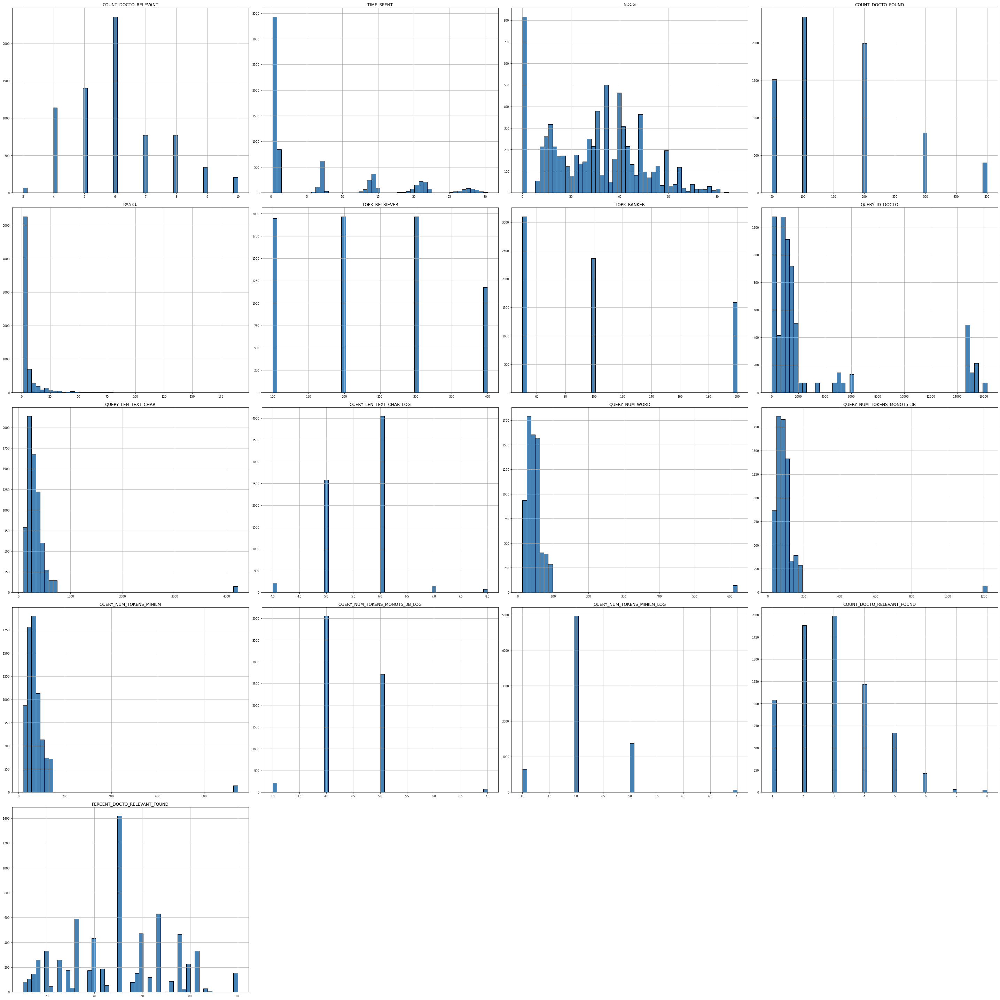

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(40,40))
ax.set_title('Histogram')
df_result.drop(['QUERY_ID','NDCG_LIMIT'],axis=1).hist(bins=50, color='steelblue', edgecolor='black', linewidth=1.0,
           xlabelsize=8, ylabelsize=8, grid=True, ax=ax)  
plt.tight_layout()   

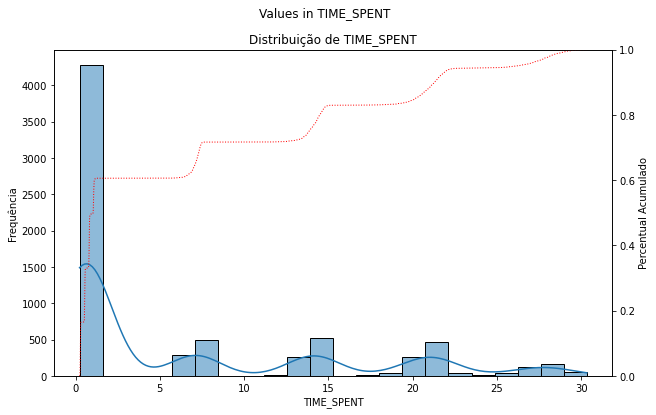

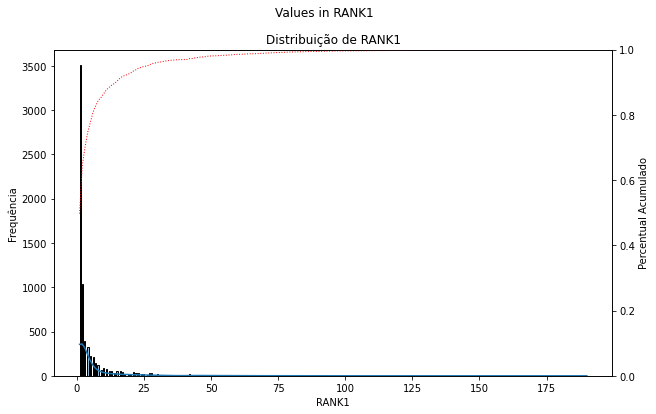

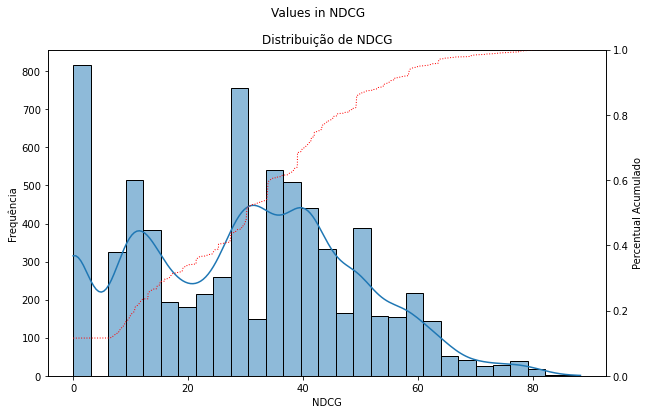

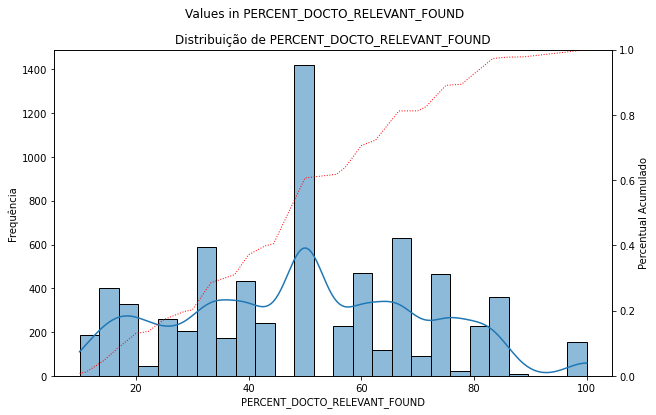

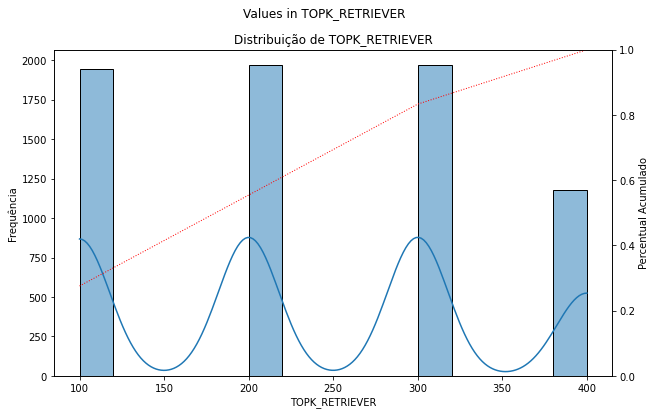

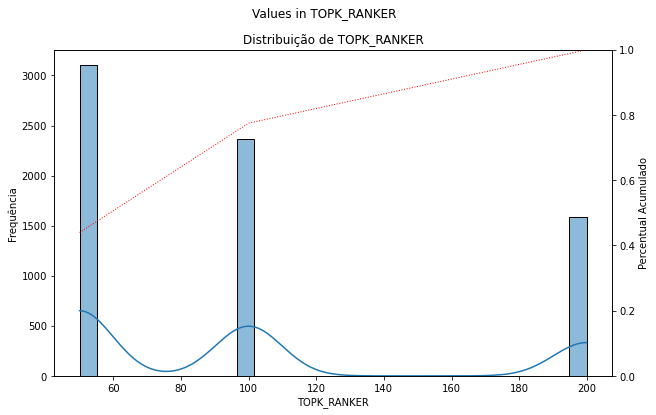

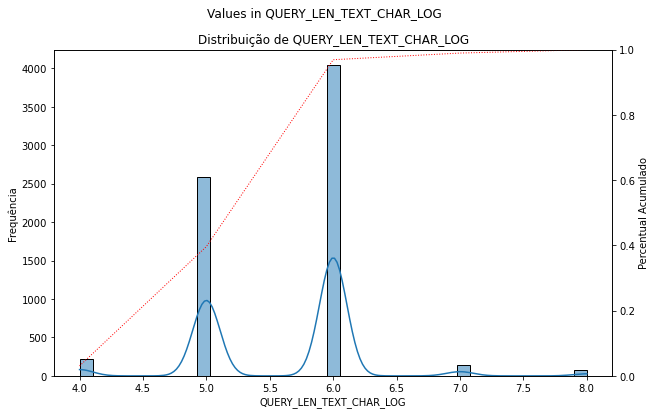

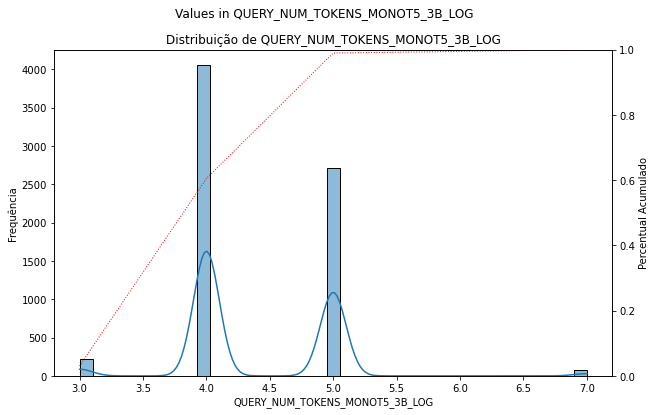

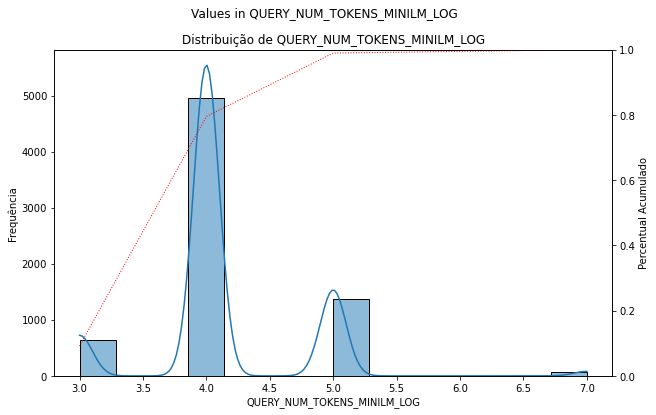

In [ ]:
for column in ['TIME_SPENT'] + list_metric + list_category:
    if df_result[column].dtype != object:
        f, ax = plt.subplots(1, 1, figsize=(10,6))
        f.suptitle(f'Values in {column}')    
        # Plot o histograma normalizado com KDE
        sns.histplot(data=df_result[column], kde=True, ax=ax, linewidth=1)

        # Calcula o percentual acumulado
        cumulative = df_result[column].value_counts(normalize=True).sort_index().cumsum()

        # Cria um novo eixo y com o percentual acumulado
        ax2 = ax.twinx()
        ax2.plot(cumulative.index, cumulative.values, linestyle='dotted', marker='', color='red', linewidth=1)
        ax2.set_ylim([0, 1])
        ax2.set_ylabel('Percentual Acumulado')

        # Configurações do gráfico
        ax.set_title(f'Distribuição de {column}')
        ax.set_xlabel(column)
        ax.set_ylabel('Frequência')
# Exibe o gráfico
plt.show()

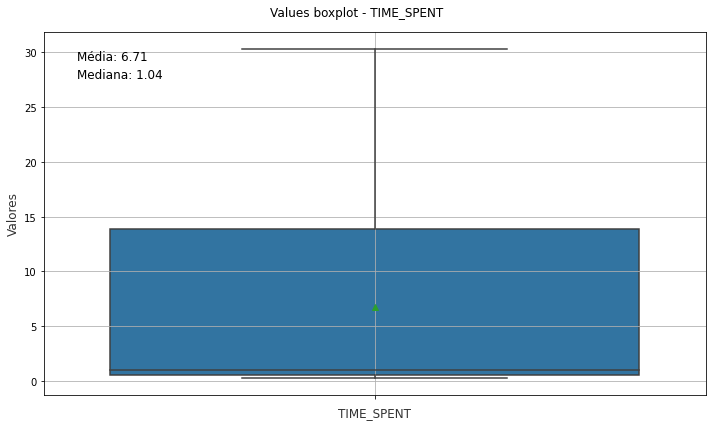

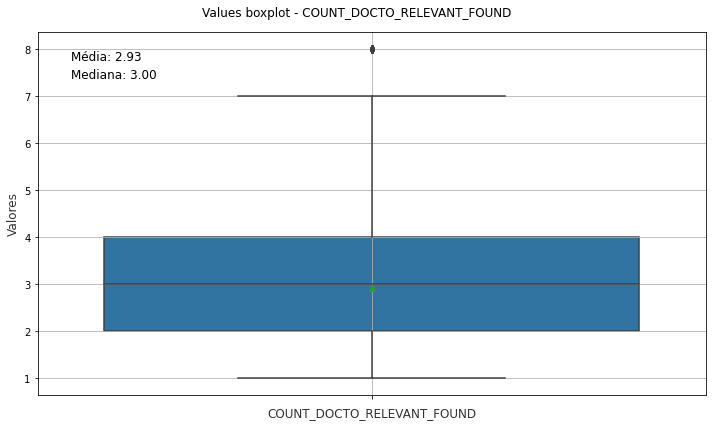

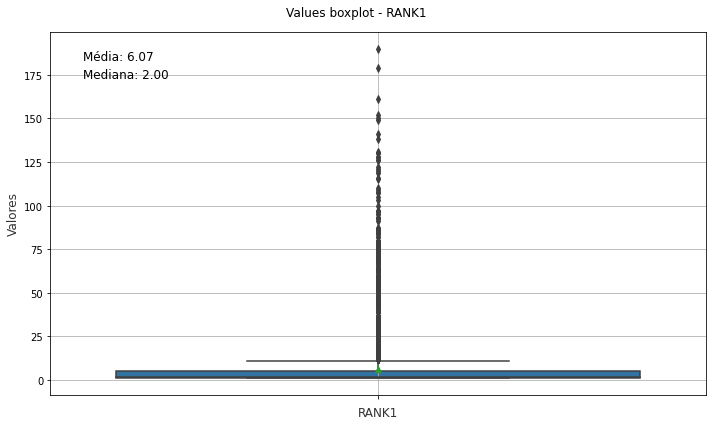

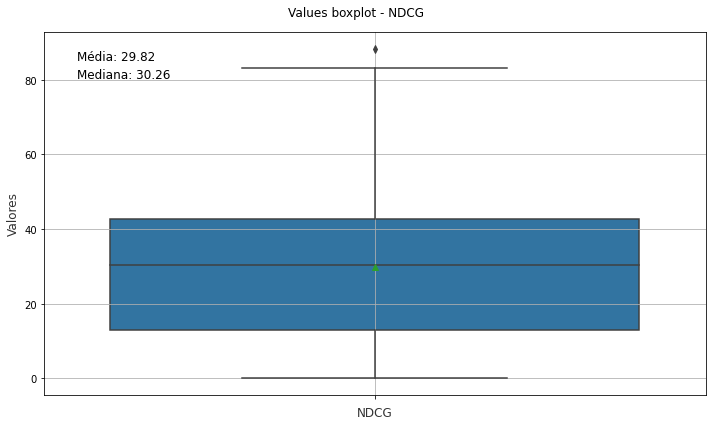

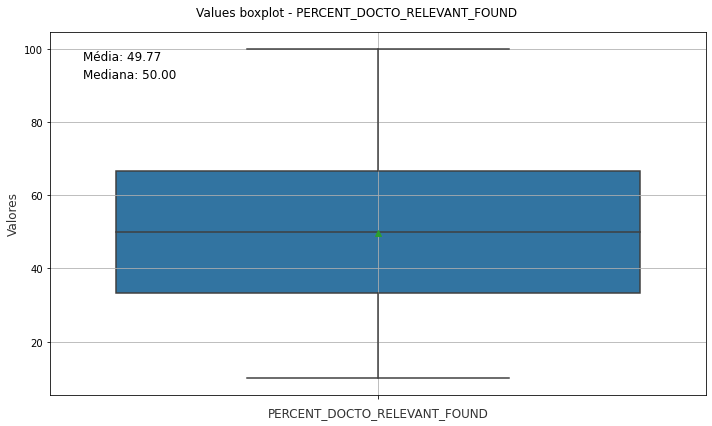

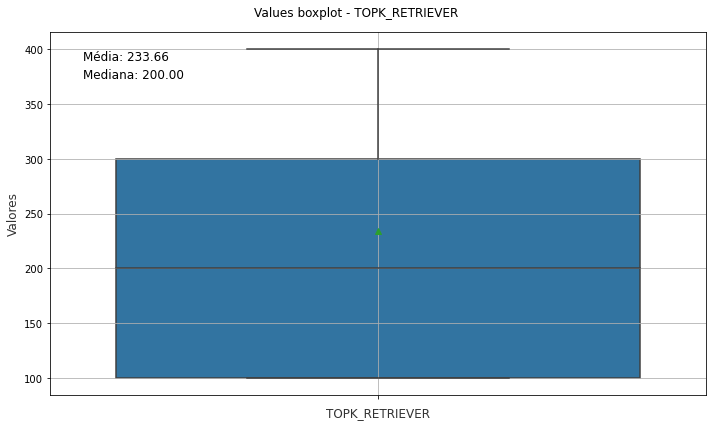

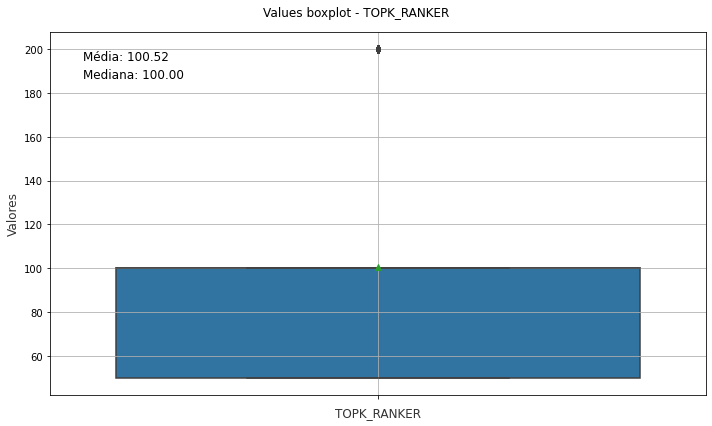

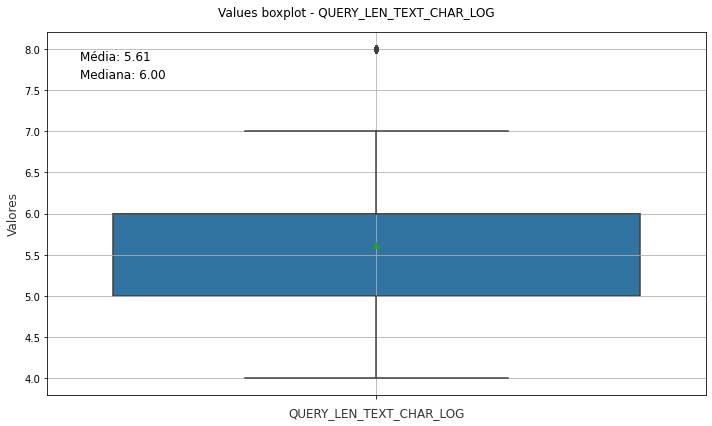

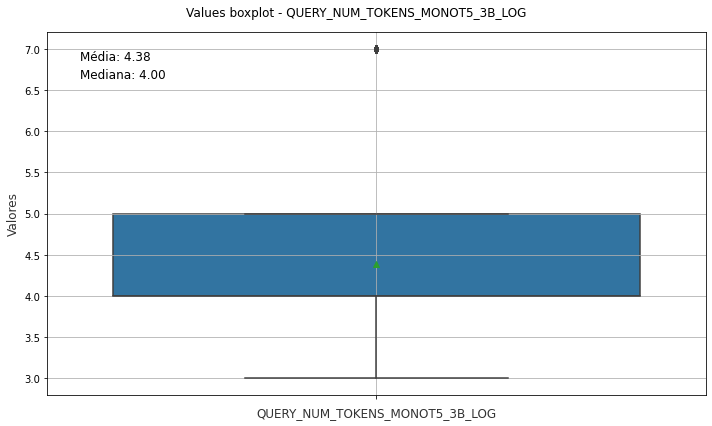

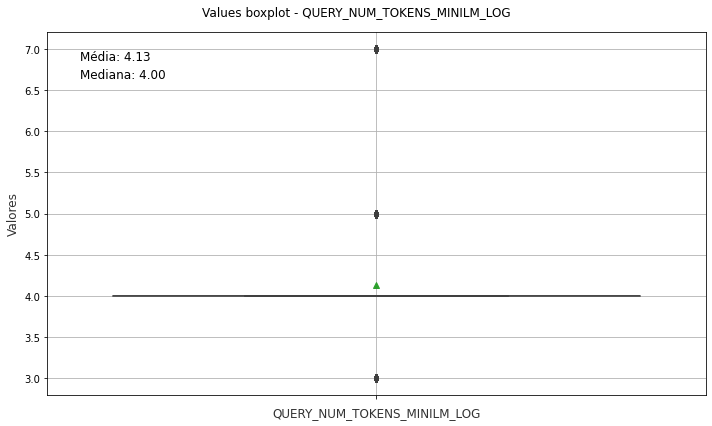

In [ ]:
metrics = {}
for column in ['TIME_SPENT', 'COUNT_DOCTO_RELEVANT_FOUND'] + list_metric + list_category: 
  if df_result[column].dtype != object:
    f, ax = plt.subplots(1, 1, figsize=(10,6))
    f.suptitle(f'Values boxplot - {column}')
    ax = sns.boxplot(y=column, data=df_result, showmeans=True, ax=ax)
    # Gráfico de disperção
    # ax = sns.stripplot(y=column, data=df_result, ax=ax) 

    # Calcula a média e mediana
    mean_val = round(df_result[column].mean(), 3)
    median_val = df_result[column].median()
    metrics[column] = {'media': mean_val, 'mediana':median_val}
    # Imprime a média e mediana no gráfico
    ax.text(0.05, 0.95, f'Média: {mean_val:.2f}', transform=ax.transAxes, fontsize=12, verticalalignment='top')
    ax.text(0.05, 0.9, f'Mediana: {median_val:.2f}', transform=ax.transAxes, fontsize=12, verticalalignment='top')

    plt.grid() 
    # sns.boxplot(data=df_result['{column}'], showmeans=True,  ax=ax)
    ax.set_xlabel(f"{column}",size = 12,alpha=0.8)
    ax.set_ylabel("Valores",size = 12,alpha=0.8)
    plt.xticks(rotation=60)
    plt.tight_layout()  
plt.show()

## Best ndcg evaluation

In [ ]:
pd.set_option('display.max_rows', 200)
pd.set_option('display.max_columns', None)

In [ ]:
df_result.sort_values(by='NDCG', ascending=False).head(10)

,COUNT_DOCTO_RELEVANT,TIME_SPENT,NDCG,COUNT_DOCTO_FOUND,RANK1,LIST_RANK,LIST_DOCTO_FOUND,RETRIEVER_TYPE,TOPK_RETRIEVER,TOPK_RANKER,NDCG_LIMIT,CRITERIA,RETRIEVER_MODEL_NAME,RANKER_MODEL_NAME,QUERY_ID,QUERY_RELEVANCE_DICT_ID_DOC,QUERY_RELEVANCE_DICT_TYPE,QUERY_PARADIGMATIC,QUERY_AREA_NAME,QUERY_ID_DOCTO,QUERY_LEN_TEXT_CHAR,QUERY_LEN_TEXT_CHAR_LOG,QUERY_NUM_WORD,QUERY_NUM_TOKENS_MONOT5_3B,QUERY_NUM_TOKENS_MINILM,QUERY_NUM_TOKENS_MONOT5_3B_LOG,QUERY_NUM_TOKENS_MINILM_LOG,COUNT_DOCTO_RELEVANT_FOUND,PERCENT_DOCTO_RELEVANT_FOUND,RANKER_TYPE
1144,6,24.0912,88.29,400,1,"[2, 4, 1, 6, 3]","[1292, 2556, 16283, 2182, 1291, 657, 3735, 16017, 5246, 15638, 316, 6814, 13...",sts,400,50,12,total,rufimelo/Legal-BERTimbau-sts-large-ma-v3,unicamp-dl/mt5-3B-mmarco-en-pt,18371,"{2556: 'SUBTEMA', 2182: 'INDEXACAO_EXTRA', 331: 'AREA', 1292: 'TEMA', 657: '...","{'SUBTEMA': [2556], 'INDEXACAO_EXTRA': [2182, 657, 16283], 'AREA': [331], 'T...",NaN,Contrato administrativo,2556,185,5,25,52,42,4,4,5,83.33,monott5
1643,4,7.3449,83.19,100,1,"[3, 2, 1]","[1100227, 1002, 932, 15866, 5210, 6075, 2497, 1973, 1202, 284, 2530, 1204, 2...",bm25,100,50,12,total,NaN,unicamp-dl/mt5-3B-mmarco-en-pt,17156,"{932: 'AREA', 1002: 'TEMA', 15299: 'SUBTEMA', 1100227: 'INDEXACAO_EXTRA'}","{'AREA': [932], 'TEMA': [1002], 'SUBTEMA': [15299], 'INDEXACAO_EXTRA': [1100...",NaN,Licitação,932,271,6,43,80,59,4,4,3,75.00,monott5
1586,4,7.2750,83.19,100,1,"[3, 2, 1]","[1100227, 1002, 932, 15866, 5210, 6075, 2497, 1973, 1202, 284, 2530, 1204, 2...",bm25,100,100,12,total,NaN,unicamp-dl/mt5-3B-mmarco-en-pt,17156,"{932: 'AREA', 1002: 'TEMA', 15299: 'SUBTEMA', 1100227: 'INDEXACAO_EXTRA'}","{'AREA': [932], 'TEMA': [1002], 'SUBTEMA': [15299], 'INDEXACAO_EXTRA': [1100...",NaN,Licitação,932,271,6,43,80,59,4,4,3,75.00,monott5
4903,4,12.5678,80.48,200,1,"[4, 2, 1]","[16294, 15104, 310, 16263, 685, 1739, 1935, 305, 1526, 2663, 301, 949, 950, ...",sts,200,100,12,total,rufimelo/Legal-BERTimbau-sts-large-ma-v3,unicamp-dl/mt5-3B-mmarco-en-pt,17834,"{16263: 'SUBTEMA', 15104: 'TEMA', 16294: 'INDEXACAO_EXTRA', 629: 'AREA'}","{'SUBTEMA': [16263], 'TEMA': [15104], 'INDEXACAO_EXTRA': [16294], 'AREA': [6...",NaN,Finanças públicas,16263,172,5,25,50,36,4,4,3,75.00,monott5
3877,4,21.1123,80.48,300,1,"[4, 2, 1]","[1489, 5259, 1101548, 26, 1558, 373, 1491, 2971, 14851, 41, 1565, 1563, 724,...",bm25,300,50,12,total_gte_5,NaN,unicamp-dl/mt5-3B-mmarco-en-pt,14599,"{26: 'SUBTEMA', 5259: 'INDEXACAO_EXTRA', 1131: 'AREA', 1489: 'TEMA'}","{'SUBTEMA': [26], 'INDEXACAO_EXTRA': [5259], 'AREA': [1131], 'TEMA': [1489]}",NaN,Pessoal,26,275,6,45,84,71,4,4,3,75.00,monott5
4967,4,6.5354,80.48,100,1,"[4, 2, 1]","[16294, 15104, 310, 16263, 685, 1935, 1526, 2663, 301, 949, 950, 14767, 312,...",sts,100,50,12,total_gte_5,rufimelo/Legal-BERTimbau-sts-large-ma-v3,unicamp-dl/mt5-3B-mmarco-en-pt,17834,"{16263: 'SUBTEMA', 15104: 'TEMA', 16294: 'INDEXACAO_EXTRA', 629: 'AREA'}","{'SUBTEMA': [16263], 'TEMA': [15104], 'INDEXACAO_EXTRA': [16294], 'AREA': [6...",NaN,Finanças públicas,16263,172,5,25,50,36,4,4,3,75.00,monott5
4904,4,5.9648,80.48,100,1,"[4, 2, 1]","[16294, 15104, 310, 16263, 685, 1739, 1935, 305, 2663, 301, 950, 14767, 312,...",sts,100,100,12,total,rufimelo/Legal-BERTimbau-sts-large-ma-v3,unicamp-dl/mt5-3B-mmarco-en-pt,17834,"{16263: 'SUBTEMA', 15104: 'TEMA', 16294: 'INDEXACAO_EXTRA', 629: 'AREA'}","{'SUBTEMA': [16263], 'TEMA': [15104], 'INDEXACAO_EXTRA': [16294], 'AREA': [6...",NaN,Finanças públicas,16263,172,5,25,50,36,4,4,3,75.00,monott5
3816,4,21.5211,80.48,300,1,"[4, 2, 1]","[1489, 5259, 1101548, 26, 1558, 373, 1102692, 1491, 2971, 14851, 1565, 1415,...",bm25,300,100,12,total,NaN,unicamp-dl/mt5-3B-mmarco-en-pt,14599,"{26: 'SUBTEMA', 5259: 'INDEXACAO_EXTRA', 1131: 'AREA', 1489: 'TEMA'}","{'SUBTEMA': [26], 'INDEXACAO_EXTRA': [5259], 'AREA': [1131], 'TEMA': [1489]}",NaN,Pessoal,26,275,6,45,84,71,4,4,3,75.00,monott5
3872,4,28.0676,80.48,400,1,"[4, 2, 1]","[1489, 5259, 1101548, 26, 1558, 373, 1102692, 1491, 2971, 14851, 1565, 1415,..."

In [ ]:
df_top = df_result[df_result['NDCG'] >= 60].sort_values(by='NDCG', ascending=False)
df_top.shape

(370, 30)

### Distribution of Values

/home/borela/miniconda3/envs/relevar-busca/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  after removing the cwd from sys.path.


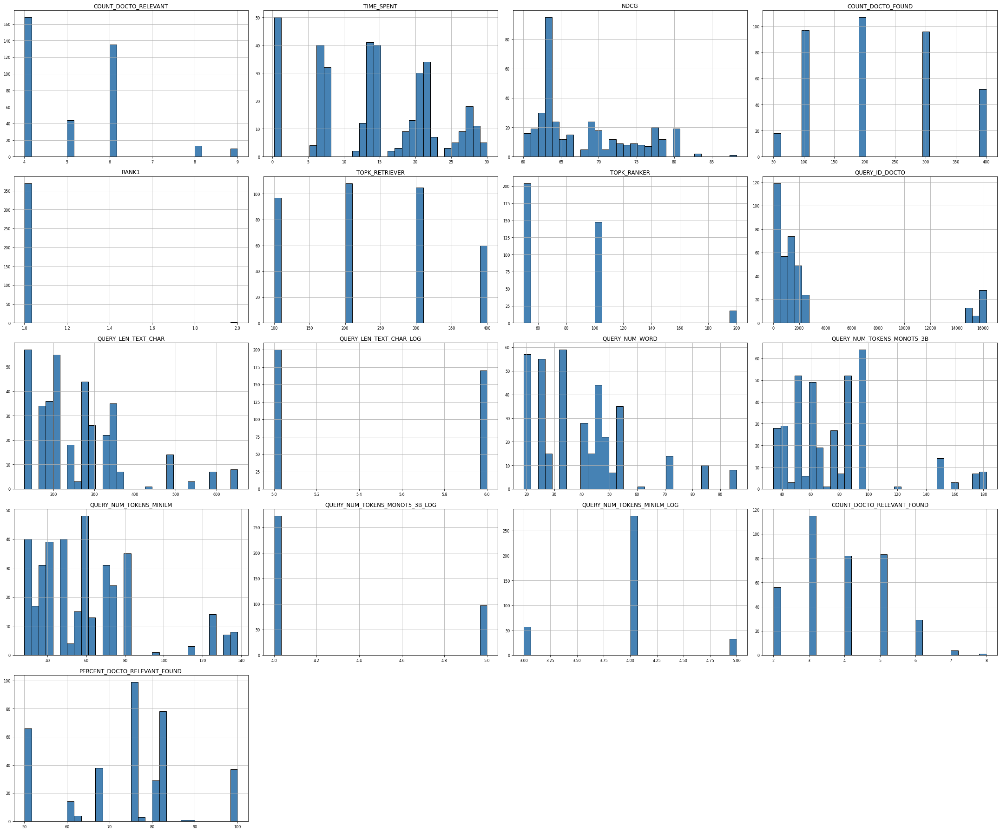

In [ ]:

fig, ax = plt.subplots(1, 1, figsize=(30,25))
ax.set_title('Histogram')
df_top.drop(['QUERY_ID','NDCG_LIMIT'],axis=1).hist(bins=30, color='steelblue', edgecolor='black', linewidth=1.0,
           xlabelsize=8, ylabelsize=8, grid=True, ax=ax)  
plt.tight_layout() 

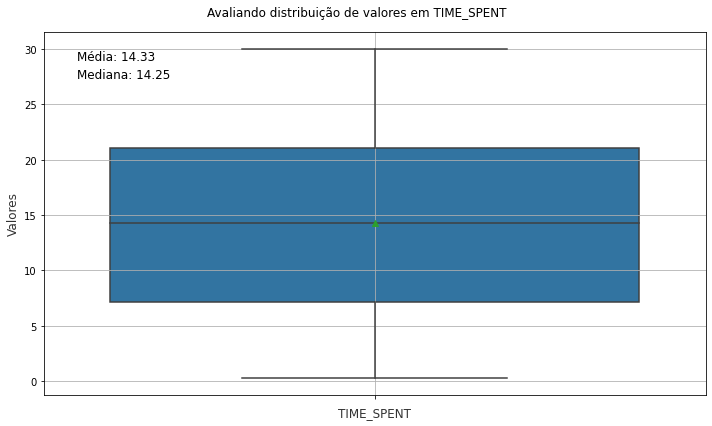

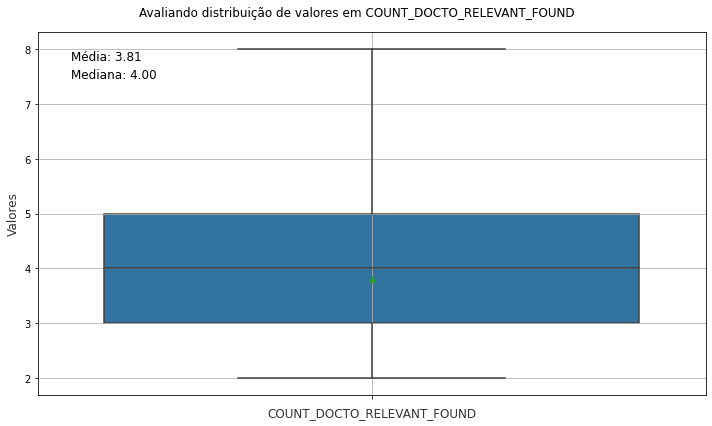

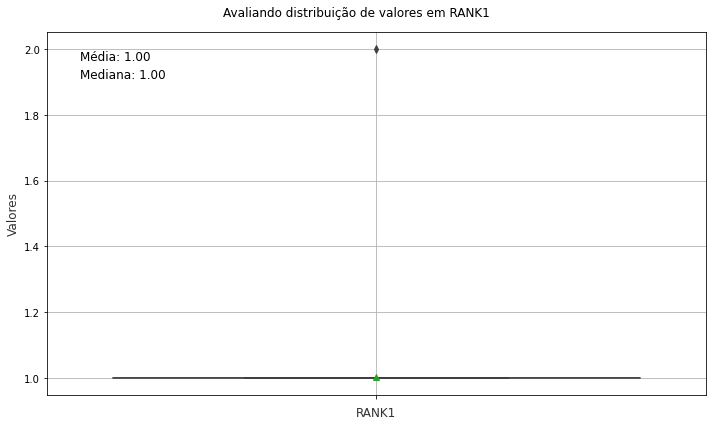

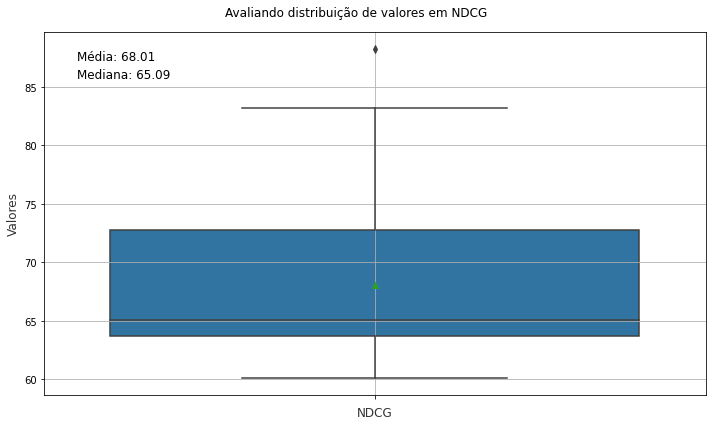

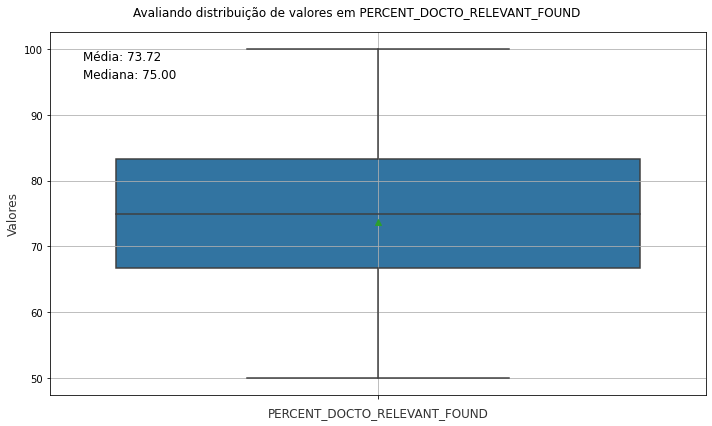

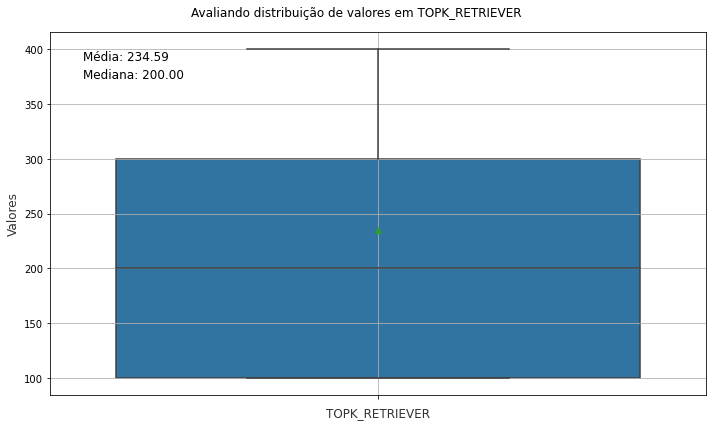

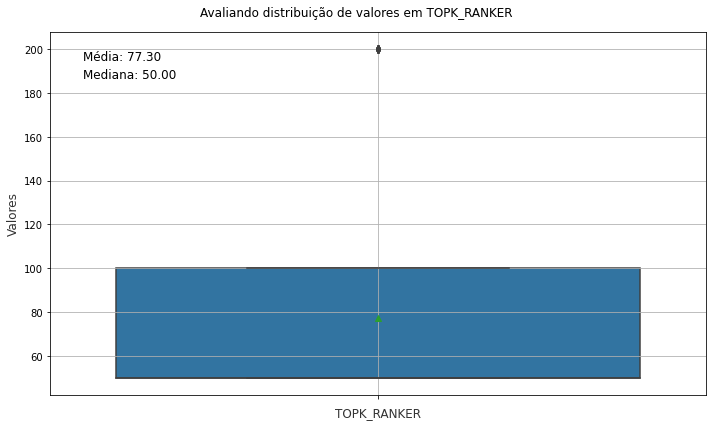

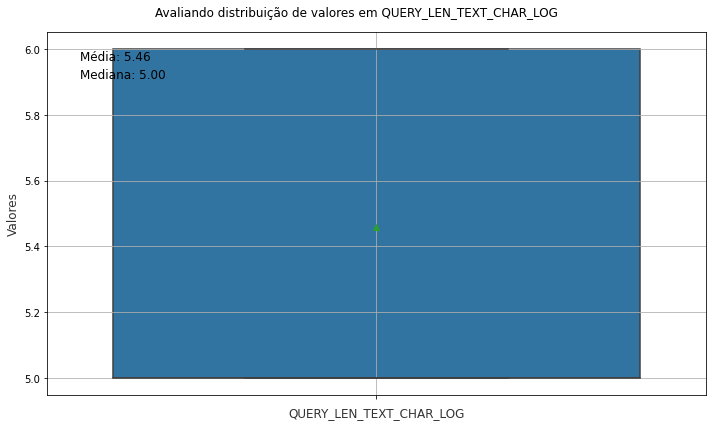

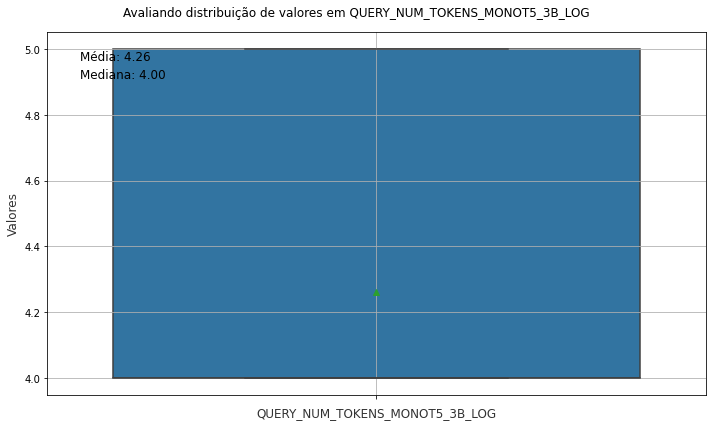

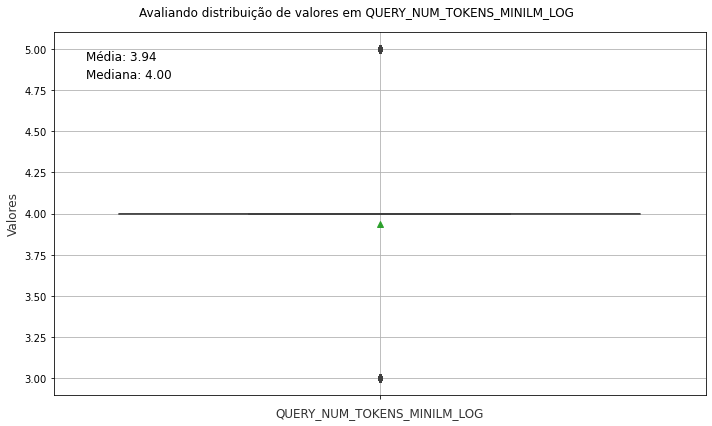

In [ ]:
metrics = {}
for column in ['TIME_SPENT', 'COUNT_DOCTO_RELEVANT_FOUND'] + list_metric + list_category: 
  if df_top[column].dtype != object:
    f, ax = plt.subplots(1, 1, figsize=(10,6))
    f.suptitle(f'Avaliando distribuição de valores em {column}')
    ax = sns.boxplot(y=column, data=df_top, showmeans=True, ax=ax)
    # Gráfico de disperção
    # ax = sns.stripplot(y=column, data=df_top, ax=ax) 

    # Calcula a média e mediana
    mean_val = round(df_top[column].mean(), 3)
    median_val = df_top[column].median()
    metrics[column] = {'media': mean_val, 'mediana':median_val}
    # Imprime a média e mediana no gráfico
    ax.text(0.05, 0.95, f'Média: {mean_val:.2f}', transform=ax.transAxes, fontsize=12, verticalalignment='top')
    ax.text(0.05, 0.9, f'Mediana: {median_val:.2f}', transform=ax.transAxes, fontsize=12, verticalalignment='top')

    plt.grid() 
    # sns.boxplot(data=df_top['{column}'], showmeans=True,  ax=ax)
    ax.set_xlabel(f"{column}",size = 12,alpha=0.8)
    ax.set_ylabel("Valores",size = 12,alpha=0.8)
    plt.xticks(rotation=60)
    plt.tight_layout()  
plt.show()

### Category evaluation

/home/borela/miniconda3/envs/relevar-busca/lib/python3.7/site-packages/ipykernel_launcher.py:42: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


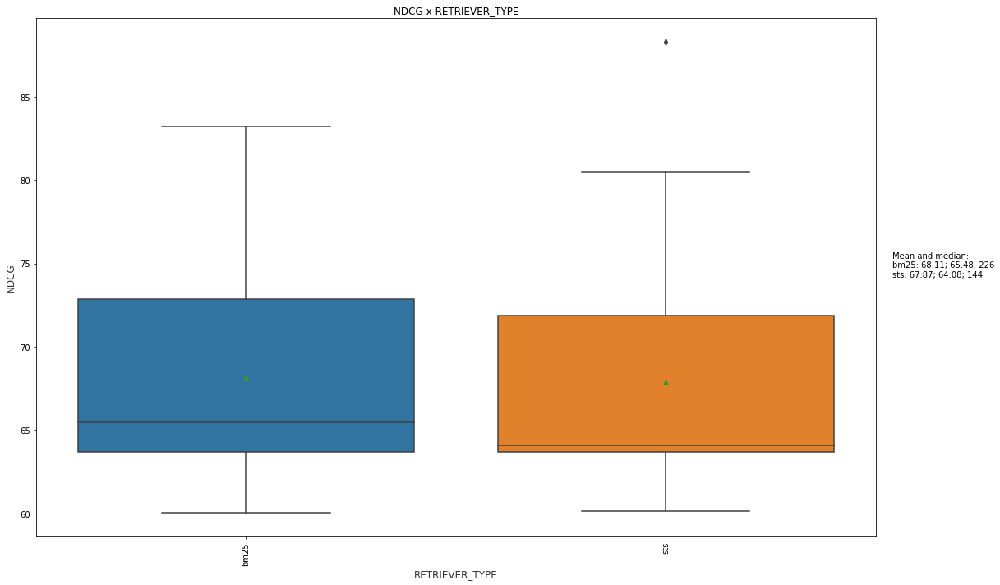

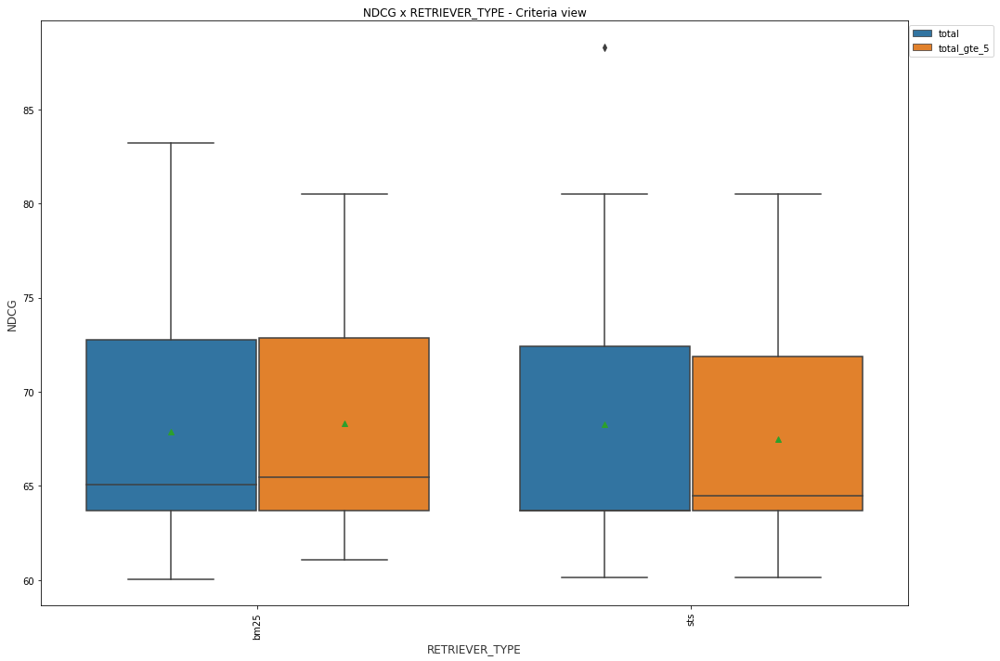

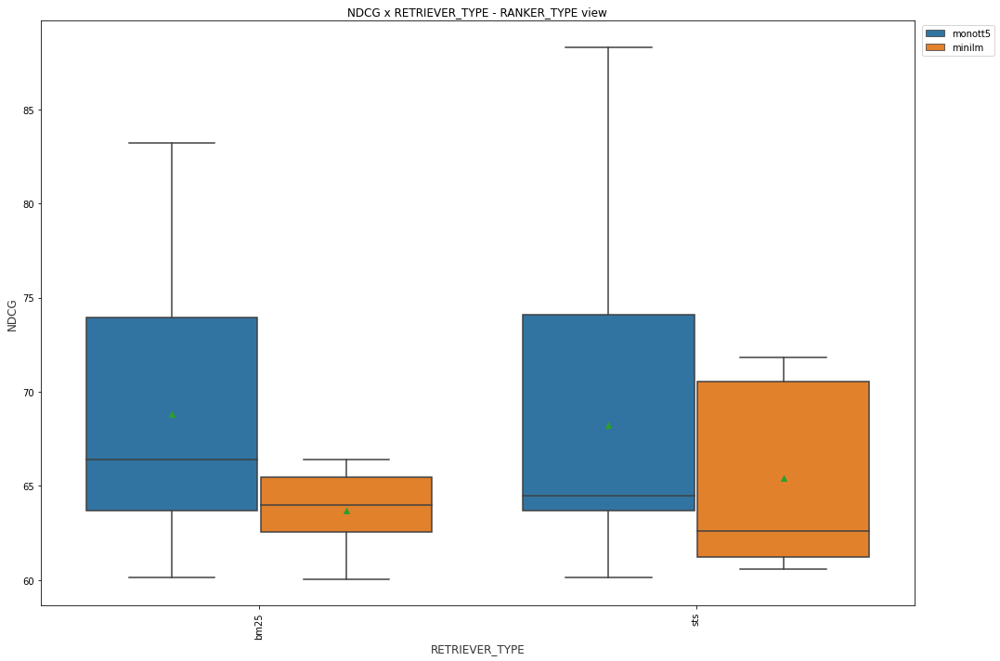

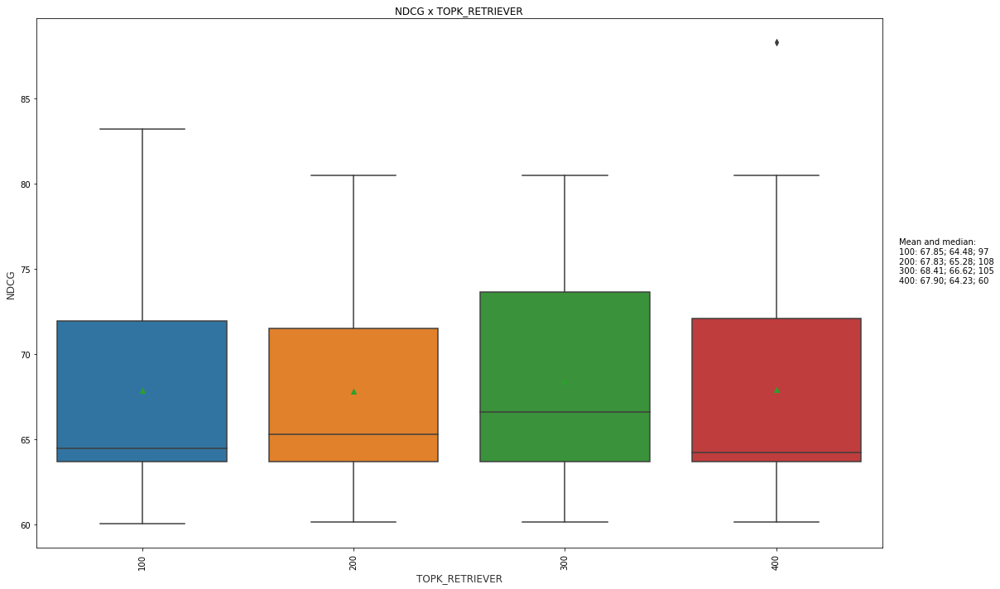

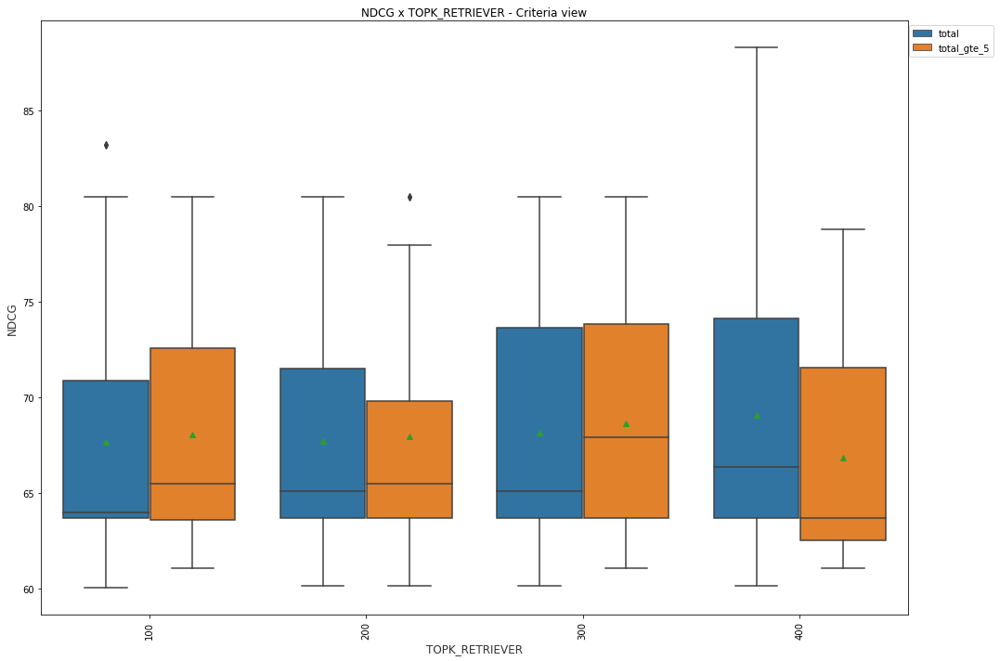

...

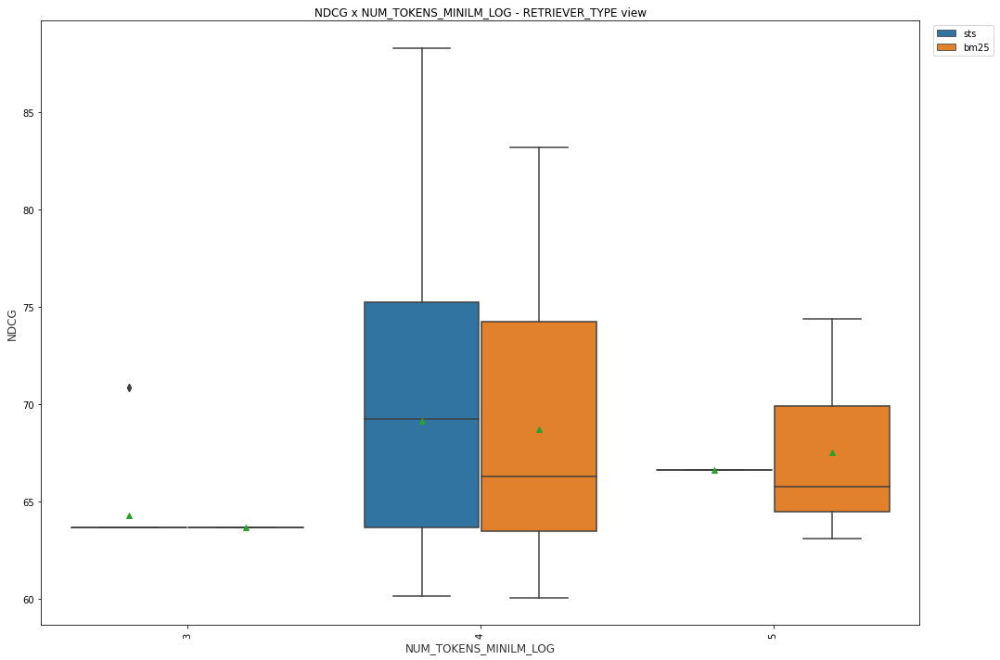

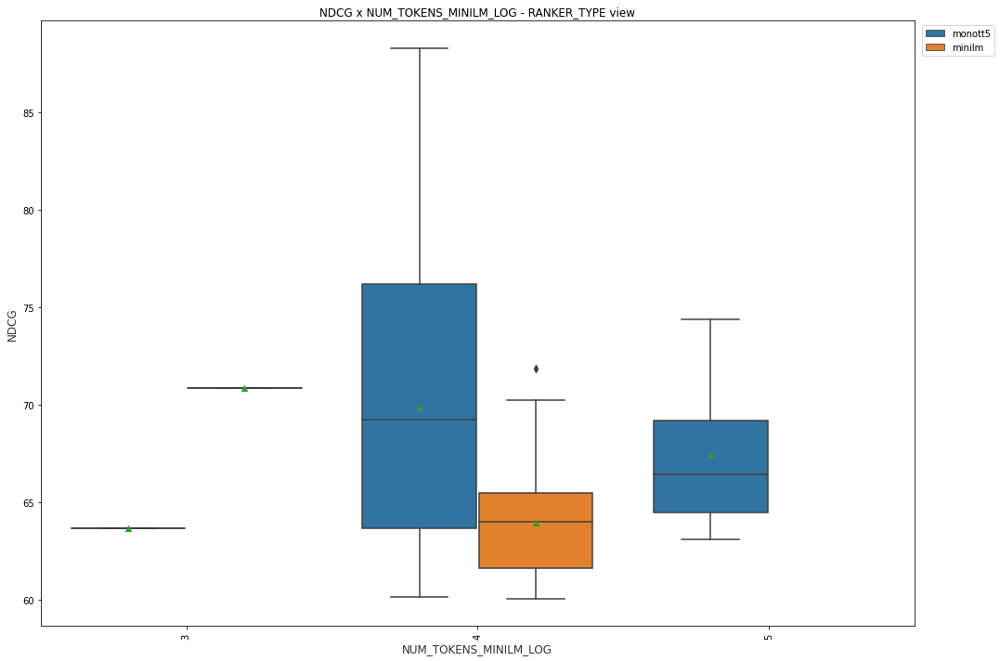

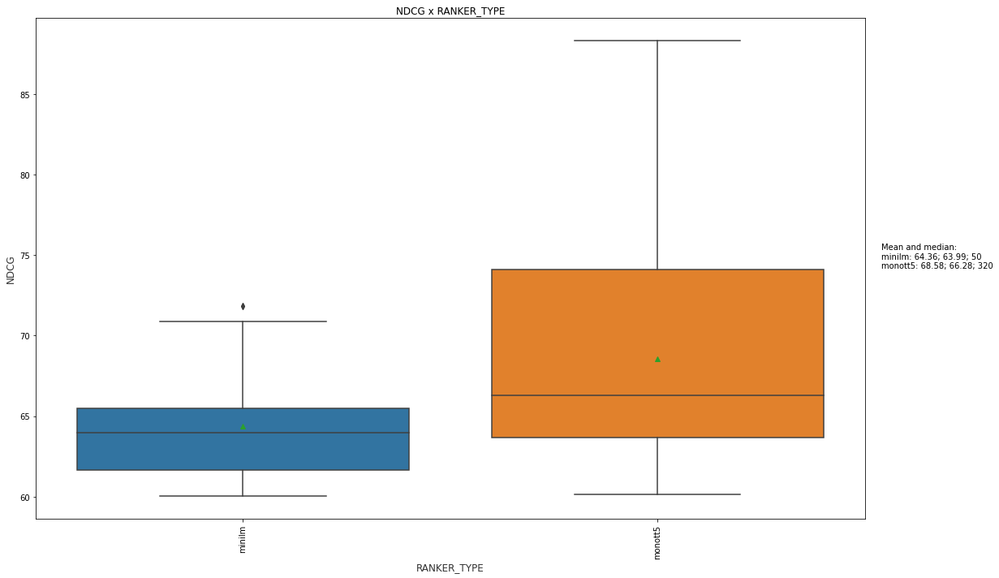

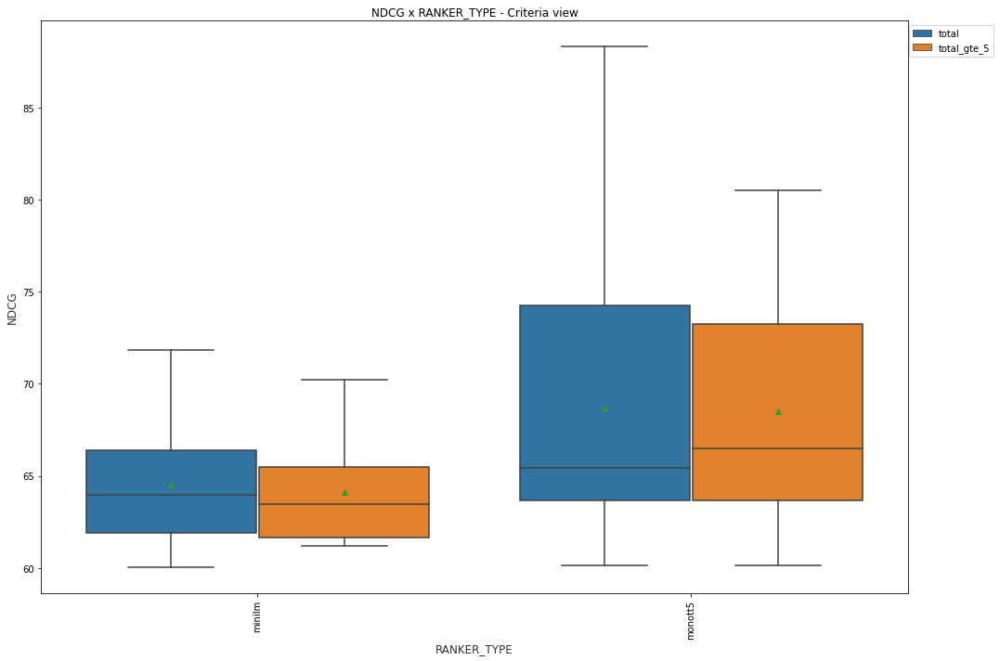

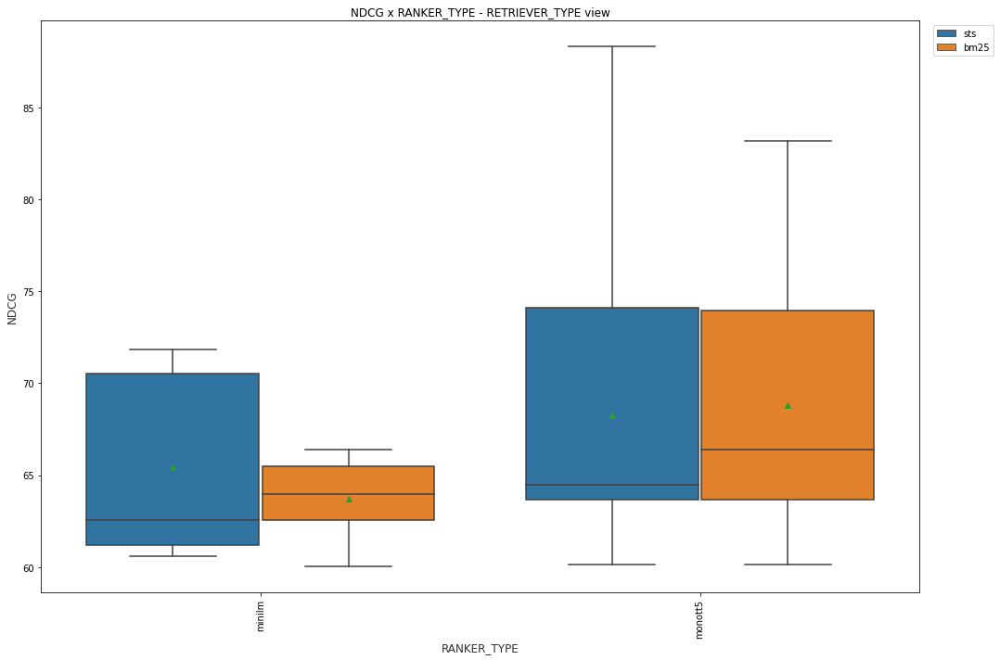

In [ ]:
for context in list_category: 
    for metric in ['NDCG']:
        
        # criar lista com valores únicos da coluna a ser ordenada
        # valores_unicos = sorted(df_top[context].unique())
        
        valores_unicos = sorted(df_top[context].dropna().unique())


        f, ax = plt.subplots(1, 1, figsize=(15,10))
        sns.boxplot(x=context, y=metric, data=df_top, showmeans=True, ax=ax, order=valores_unicos)
        ax.set_xlabel(context,size = 12,alpha=0.8)
        ax.set_ylabel(metric,size = 12,alpha=0.8)
        ax.set_title(f'{metric} x {context}')
        plt.xticks(rotation=90)
        plt.tight_layout()

        # Média e Mediana
        media = df_top.groupby(context)[metric].mean()
        mediana = df_top.groupby(context)[metric].median()
        count = df_top.groupby(context)[metric].count()
        mm_list = [f"{i}: {j:.2f}; {k:.2f}; {l:.0f}" for i,j,k,l in zip(media.index, media, mediana, count)]
        mm_str = "\n".join(mm_list)
        ax.text(1.02, 0.5, f"Mean and median:\n{mm_str}", transform=ax.transAxes)


# Doc - evaluation


In [ ]:
import importlib
importlib.reload(util_evaluation)

<module 'util.util_evaluation' from '/home/borela/fontes/ind-ir/code/util/util_evaluation.py'>

In [ ]:
%%time
df_result_doc = util_evaluation.return_result_per_doc(DATASET_NAME)

/home/borela/miniconda3/envs/relevar-busca/lib/python3.7/site-packages/transformers/convert_slow_tokenizer.py:447: UserWarning: The sentencepiece tokenizer that you are converting to a fast tokenizer uses the byte fallback option which is not implemented in the fast tokenizers. In practice this means that the fast version of the tokenizer can produce unknown tokens whereas the sentencepiece version would have converted these unknown tokens into a sequence of byte tokens matching the original piece of text.
  "The sentencepiece tokenizer that you are converting to a fast tokenizer uses the byte fallback option"


CPU times: user 1min, sys: 136 ms, total: 1min
Wall time: 1min


In [ ]:
df_result_doc.shape

(43560, 54)

In [ ]:
df_result_doc.columns

Index(['COUNT_DOCTO_RELEVANT', 'TIME_SPENT', 'NDCG', 'COUNT_DOCTO_FOUND',
       'RANK1', 'LIST_RANK', 'LIST_DOCTO_FOUND', 'RETRIEVER_TYPE',
       'TOPK_RETRIEVER', 'TOPK_RANKER', 'NDCG_LIMIT', 'CRITERIA',
       'RETRIEVER_MODEL_NAME', 'RANKER_MODEL_NAME', 'QUERY_ID',
       'QUERY_PARADIGMATIC', 'QUERY_AREA_NAME', 'QUERY_ID_DOCTO',
       'QUERY_LEN_TEXT_CHAR', 'QUERY_LEN_TEXT_CHAR_LOG', 'QUERY_NUM_WORD',
       'QUERY_NUM_TOKENS_MONOT5_3B', 'QUERY_NUM_TOKENS_MINILM',
       'QUERY_NUM_TOKENS_MONOT5_3B_LOG', 'QUERY_NUM_TOKENS_MINILM_LOG',
       'COUNT_DOCTO_RELEVANT_FOUND', 'PERCENT_DOCTO_RELEVANT_FOUND',
       'RANKER_TYPE', 'DOC_ID', 'TYPE_QREL', 'DOC_ID_FOUND', 'DOC_NAME',
       'DOC_CLASS', 'DOC_HAS_SCOPE_NOTE', 'DOC_HAS_DEFINITION',
       'DOC_HAS_SYNONYM', 'DOC_HAS_EXAMPLE', 'DOC_HAS_ENGLISH_TRANSLATION',
       'DOC_HAS_SPECIALIZATION', 'DOC_HAS_RELATED_TERM',
       'DOC_HAS_SPANISH_TRANSLATION', 'DOC_HAS_GENERALIZATION',
       'DOC_COUNT_INDEX_AREA', 'DOC_COUNT_INDEX_T

In [ ]:
# list_metric = ['RANK1', 'NDCG', 'PERCENT_DOCTO_RELEVANT_FOUND']
list_category_doc = [
       # about doc
       'TYPE_QREL', 'DOC_CLASS', 'DOC_HAS_SCOPE_NOTE', 'DOC_HAS_DEFINITION',
       'DOC_HAS_SYNONYM', 'DOC_HAS_EXAMPLE', 'DOC_HAS_ENGLISH_TRANSLATION',
       'DOC_HAS_SPECIALIZATION', 'DOC_HAS_RELATED_TERM',
       'DOC_HAS_SPANISH_TRANSLATION', 'DOC_HAS_GENERALIZATION',
       'DOC_LEN_TEXT_CHAR_LOG',
       'DOC_NUM_TOKENS_MONOT5_3B_LOG', 'DOC_NUM_TOKENS_MINILM_LOG'
]



## Found x not found

In [ ]:
df_result_doc_found = df_result_doc[df_result_doc['DOC_ID_FOUND']]

In [ ]:
df_result_doc_not_found = df_result_doc[-df_result_doc['DOC_ID_FOUND']]

In [ ]:
df_result_doc_found.shape, df_result_doc_not_found.shape

((20645, 54), (22915, 54))

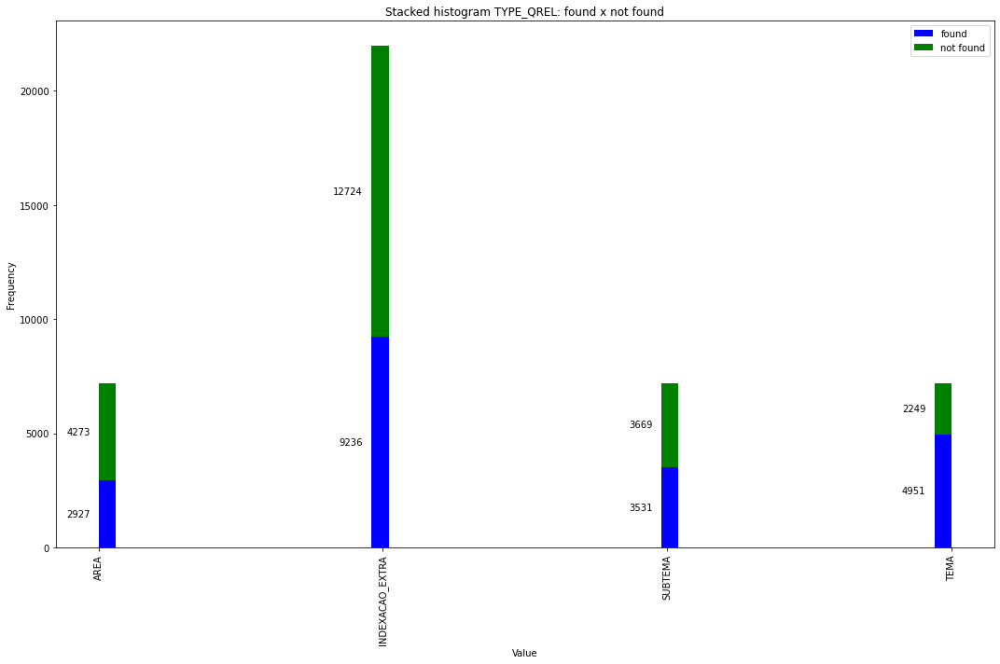

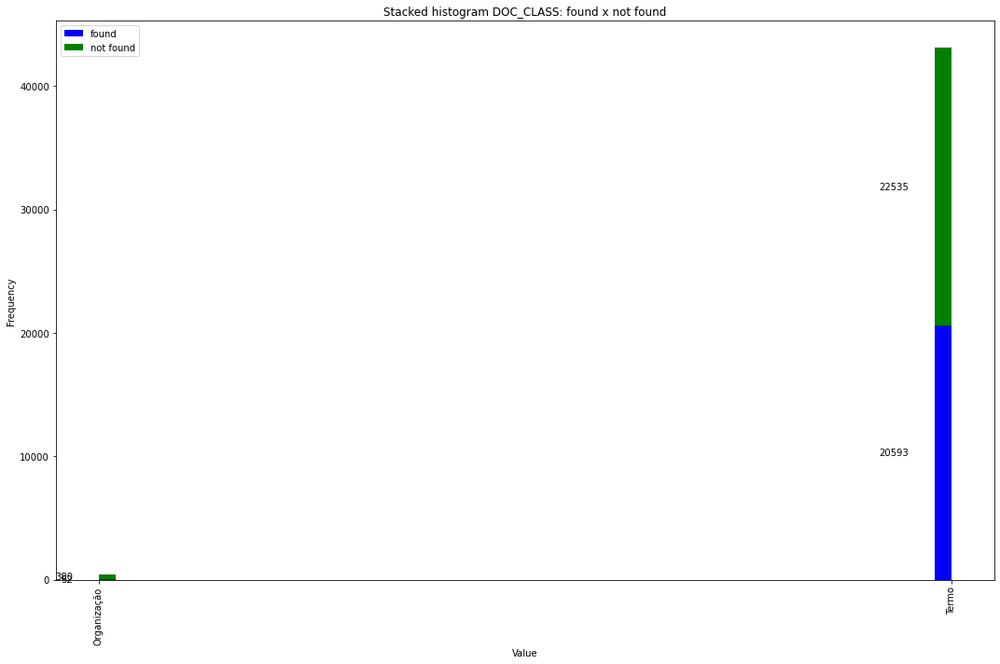

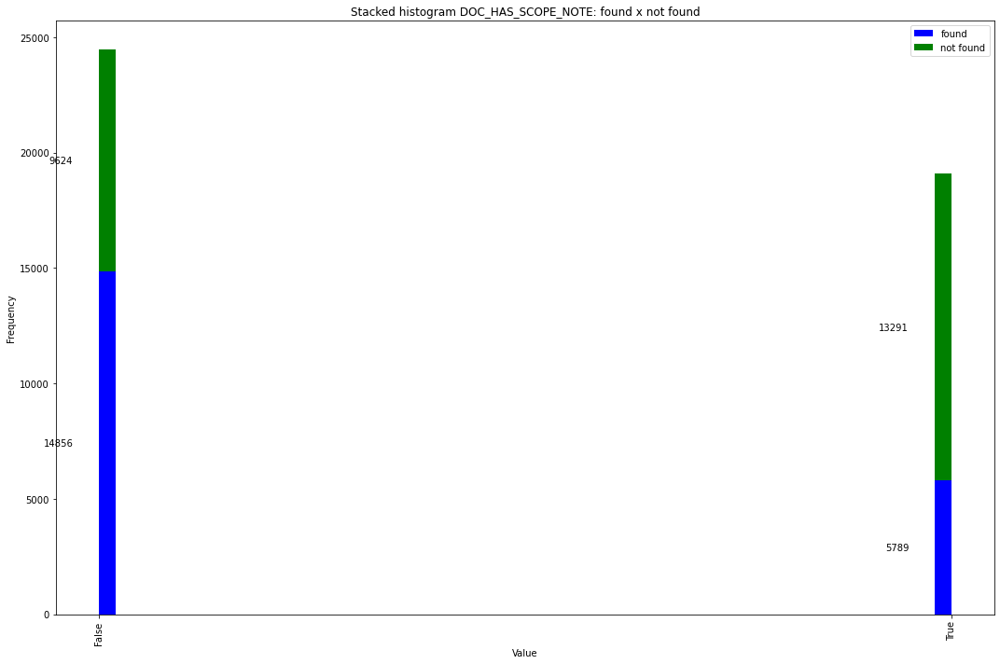

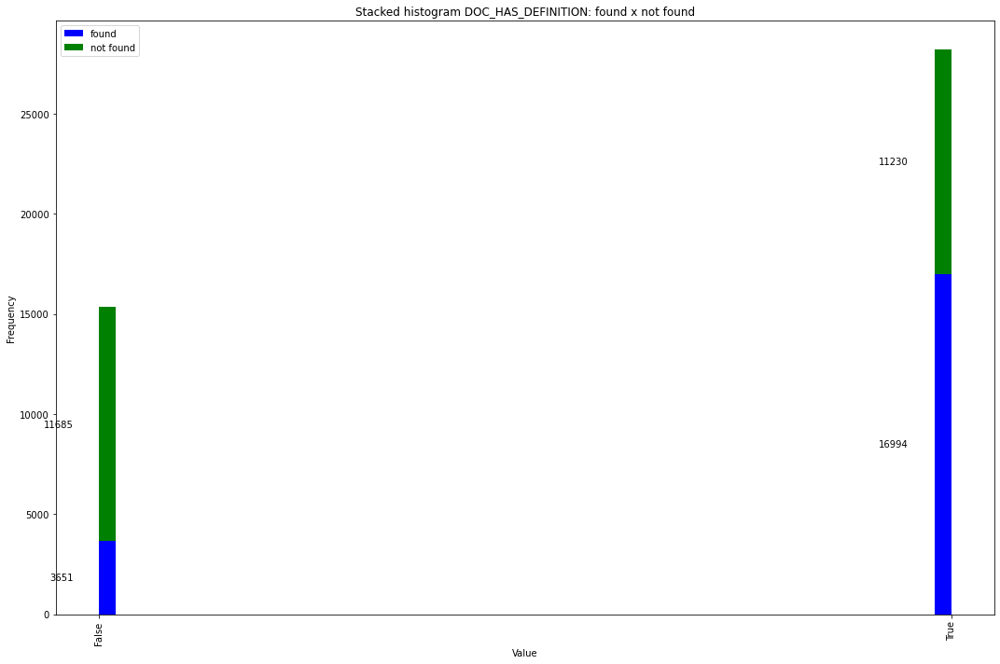

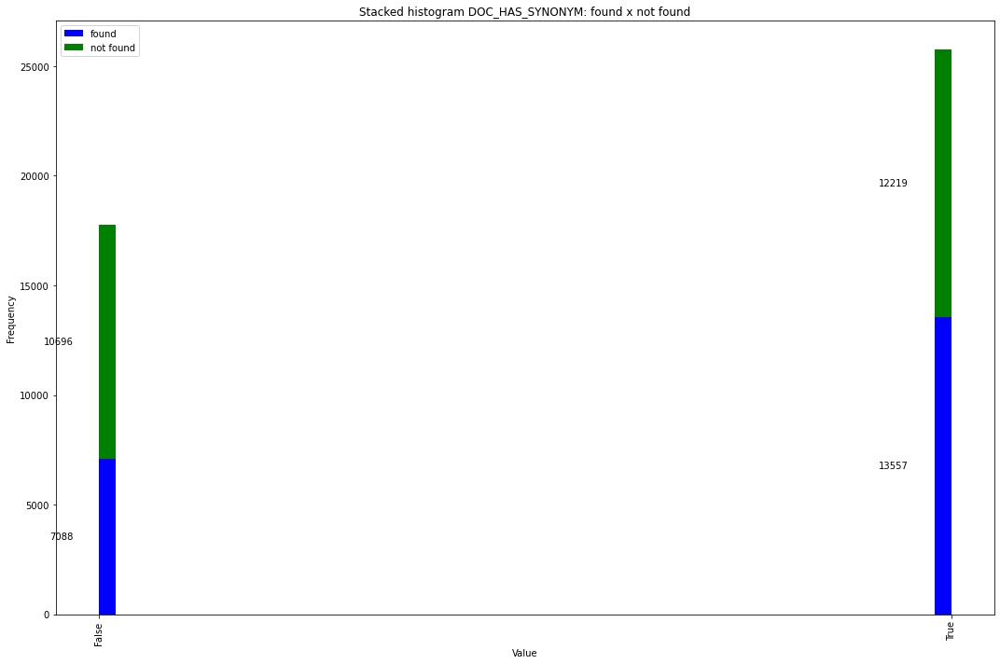

...

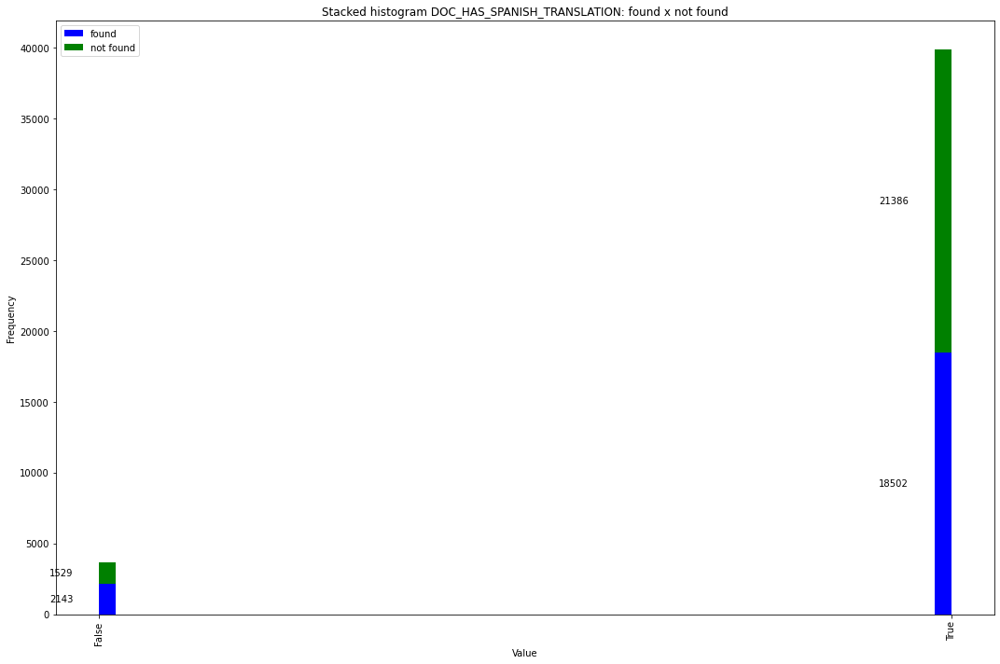

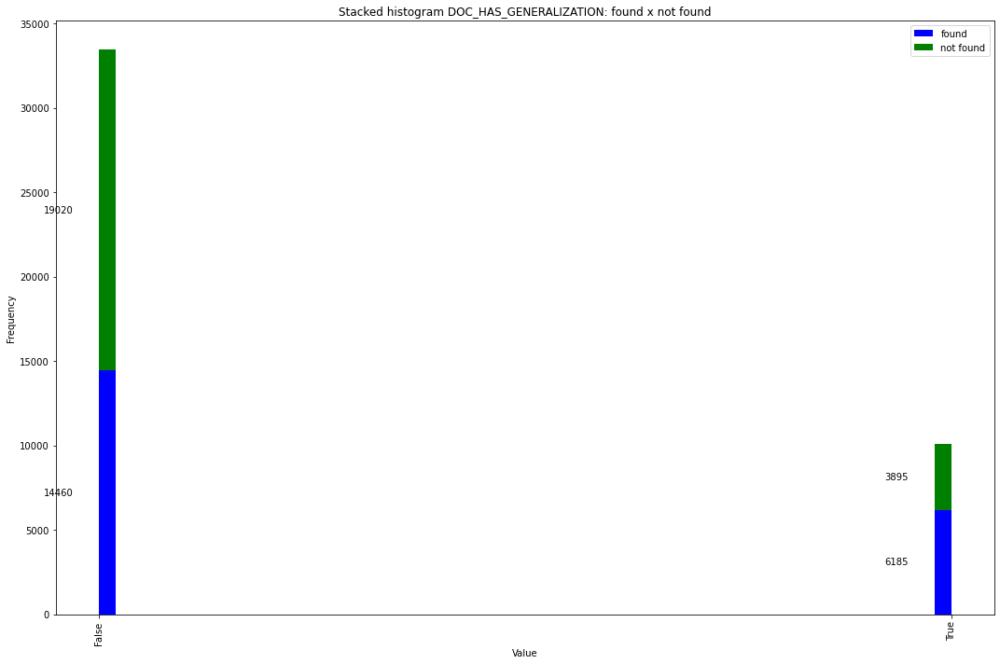

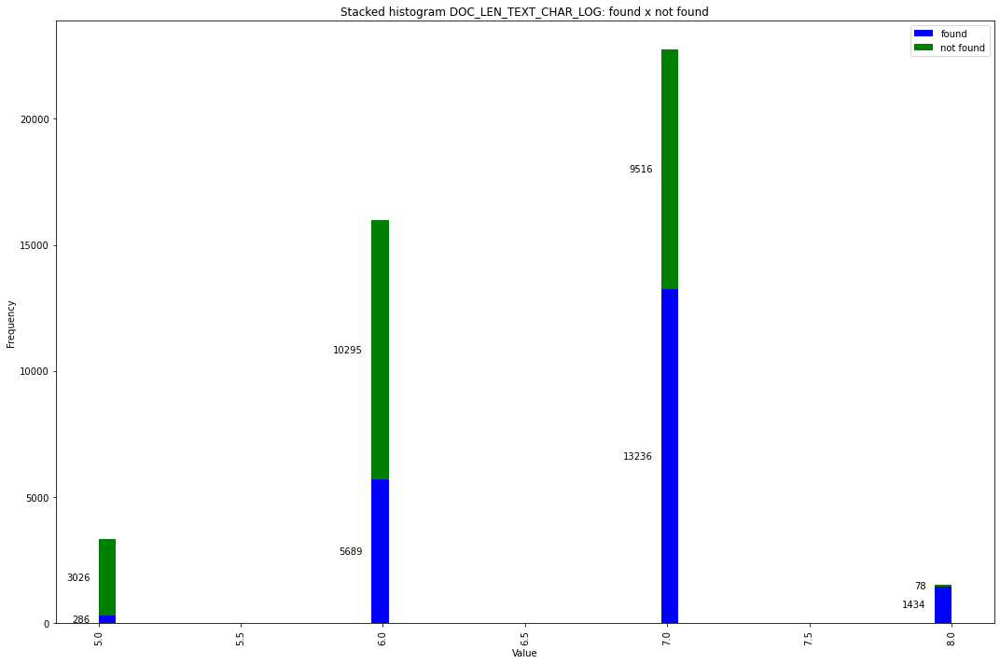

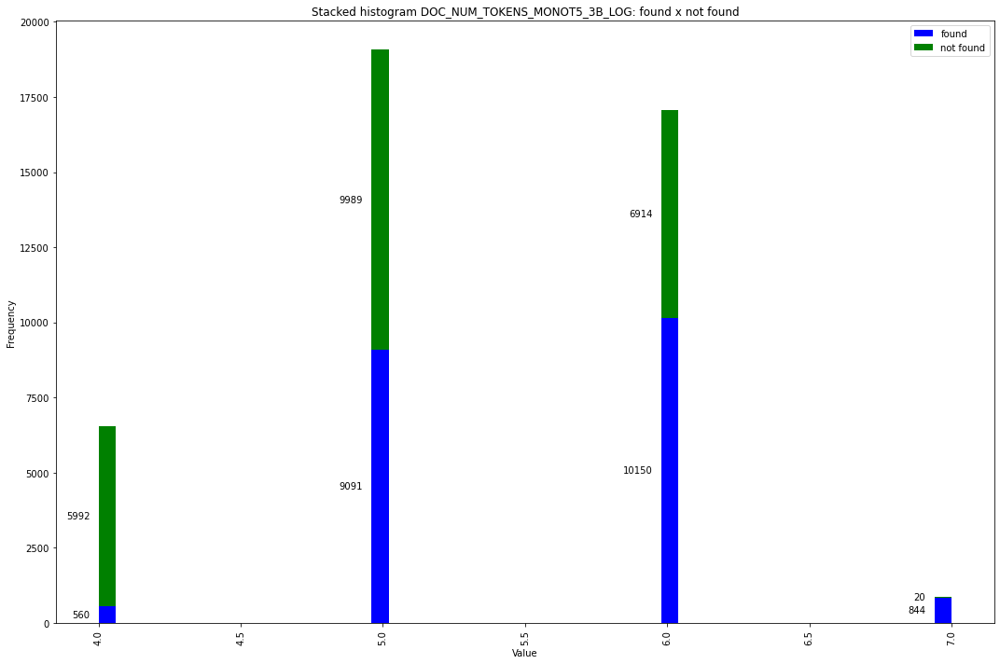

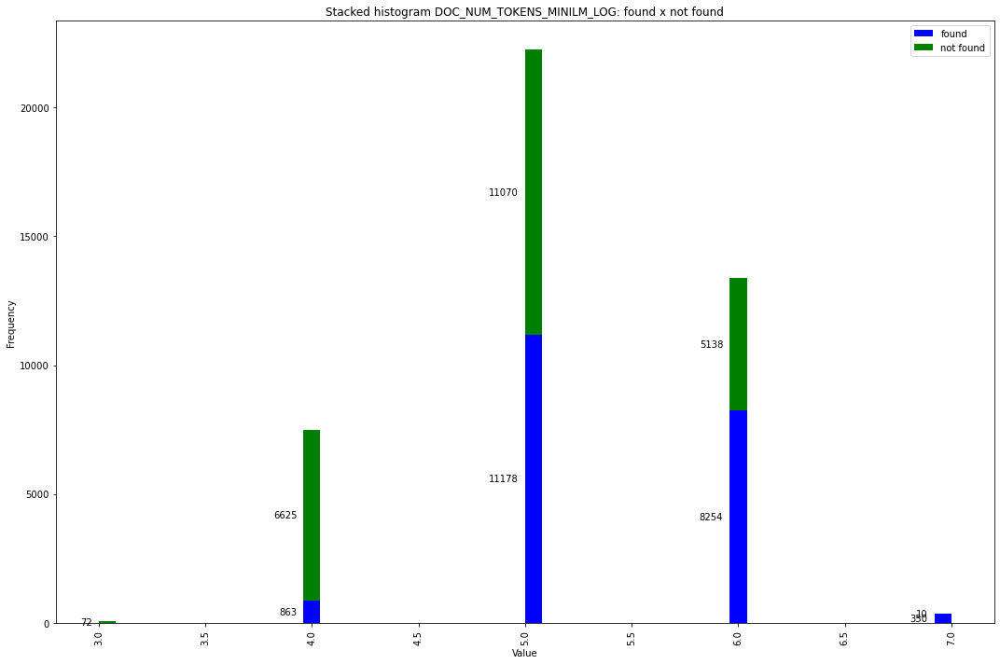

In [ ]:
for column in list_category_doc:
    f, ax = plt.subplots(1, 1, figsize=(15,10))
    plt.hist([df_result_doc_found.sort_values(by=column)[column].dropna(), df_result_doc_not_found.sort_values(by=column)[column].dropna()], color=['blue', 'green'], label=['found', 'not found'], stacked=True, bins=50)

    # Definir os rótulos do eixo X para columns booleanas
    if '_HAS_' in column:
        plt.xticks([0, 1], ['False', 'True'])

    for rect in ax.patches:
        height = rect.get_height()
        width = rect.get_width()
        x = rect.get_x()
        y = rect.get_y()

        if height > 0:
            # ax.text(x + width / 2, y + height + 0.01, int(height), ha='center', va='bottom')
            ax.text(x - 0.03, y + height / 2, int(height), ha='right', va='center')


    plt.legend()
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.title(f'Stacked histogram {column}: found x not found')
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

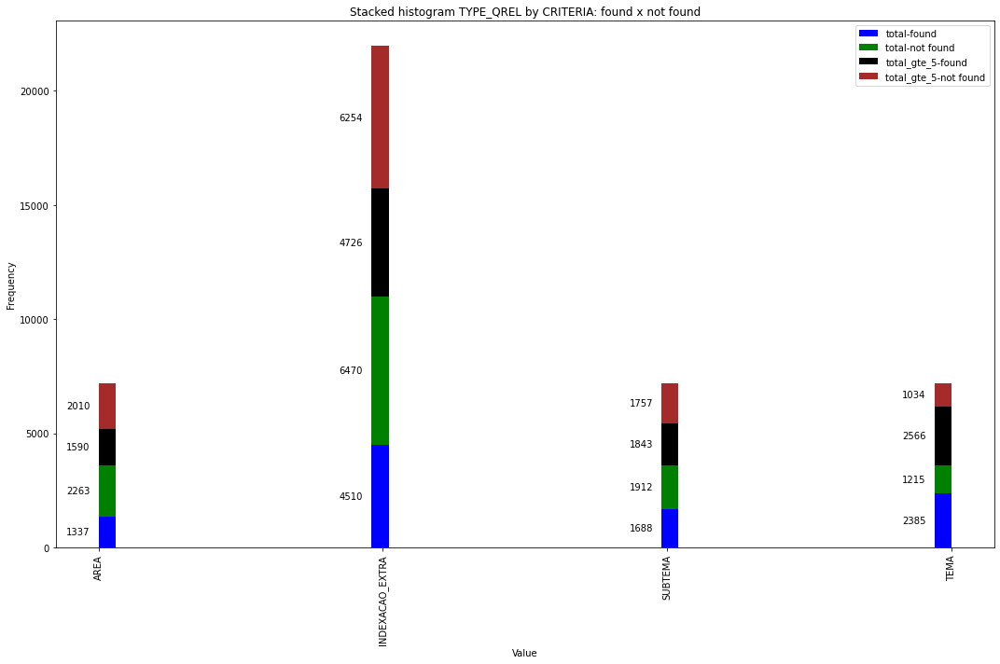

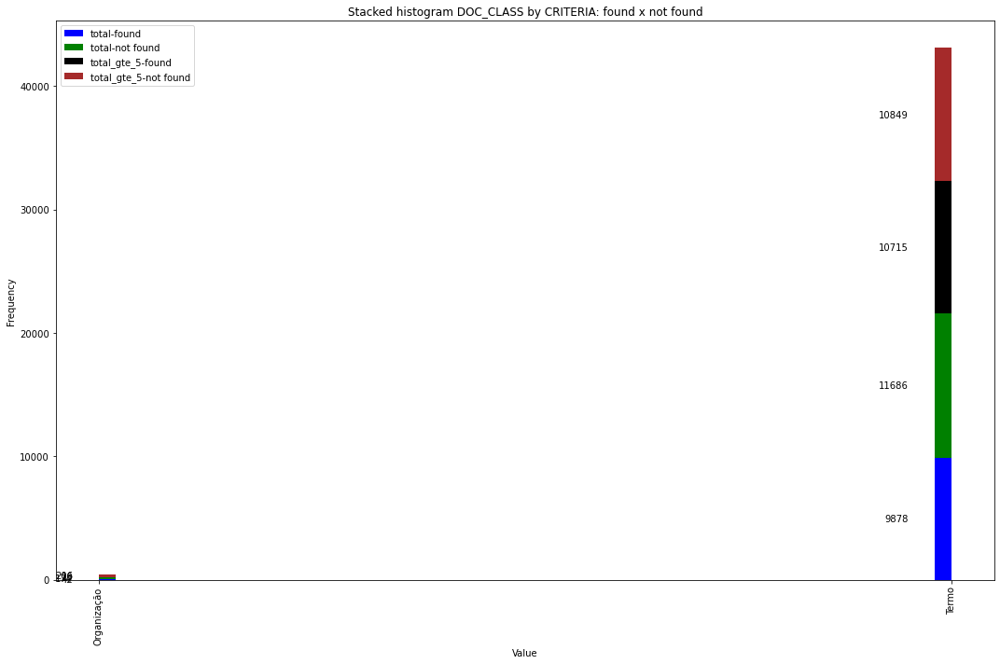

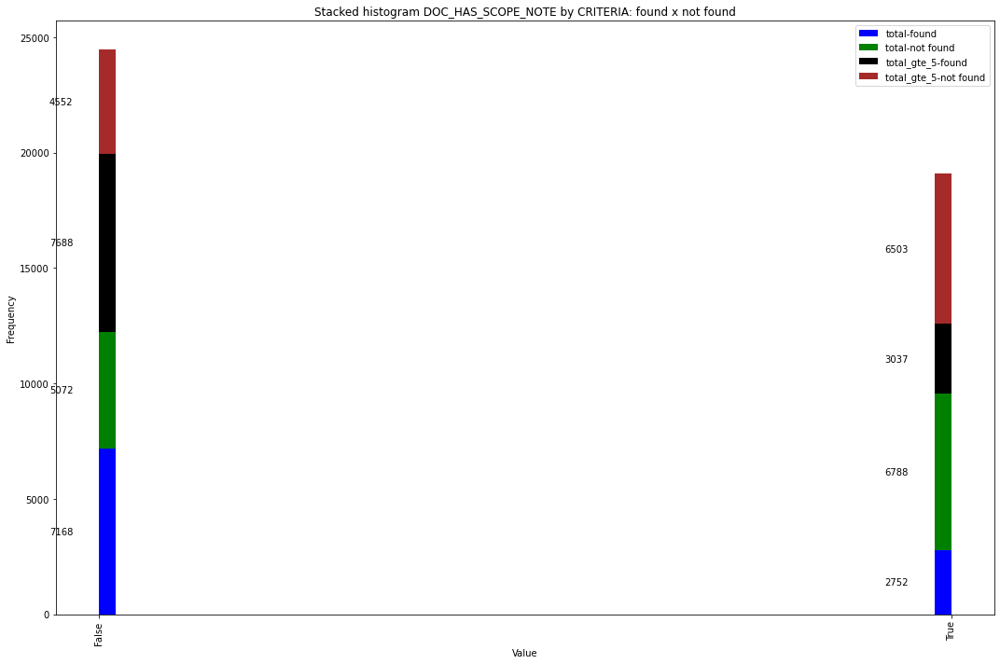

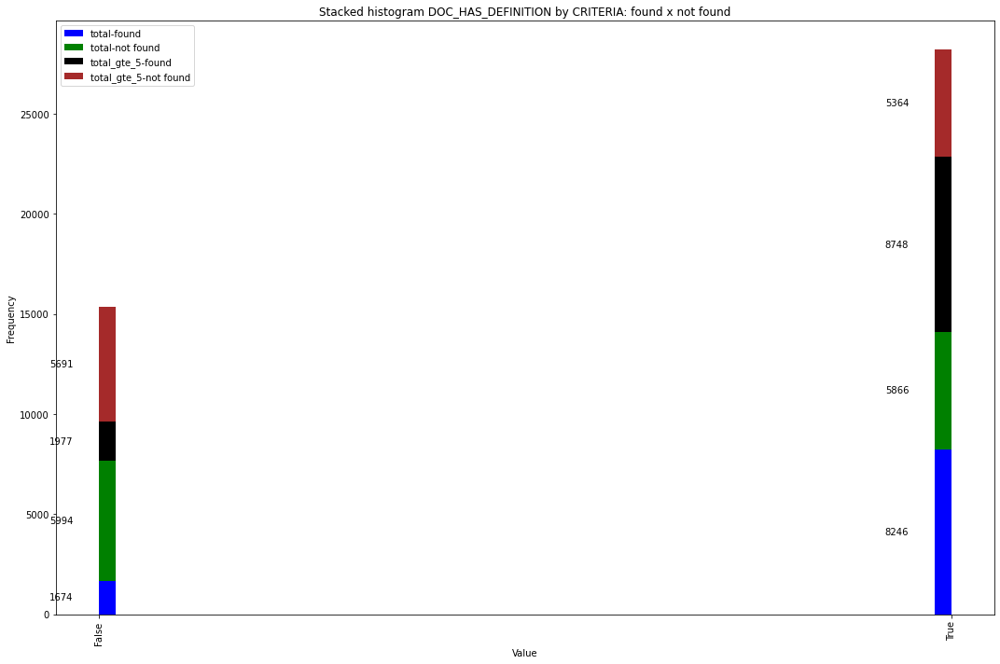

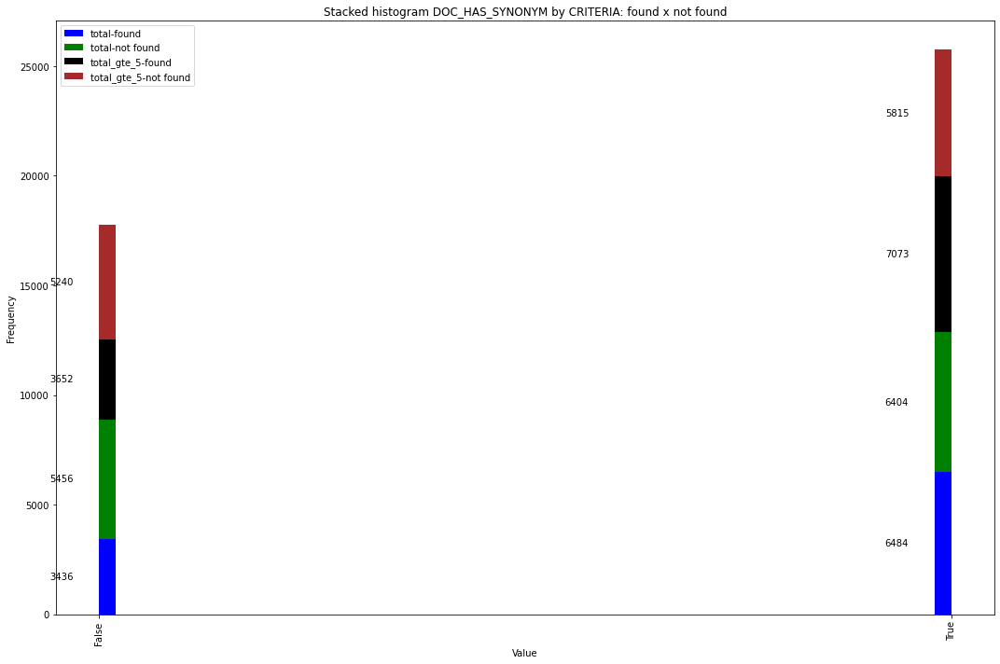

...

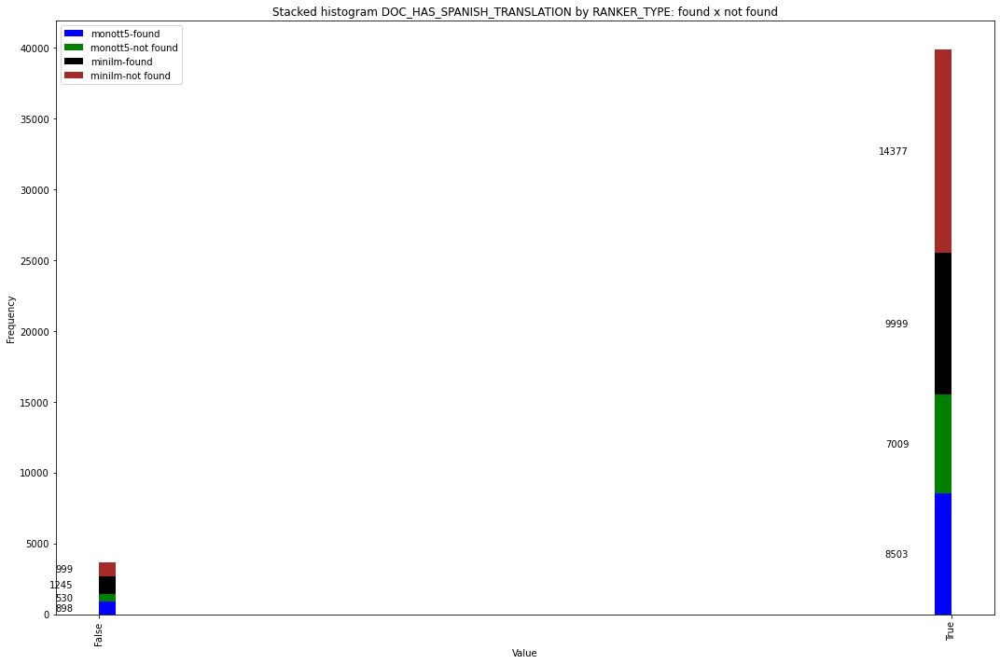

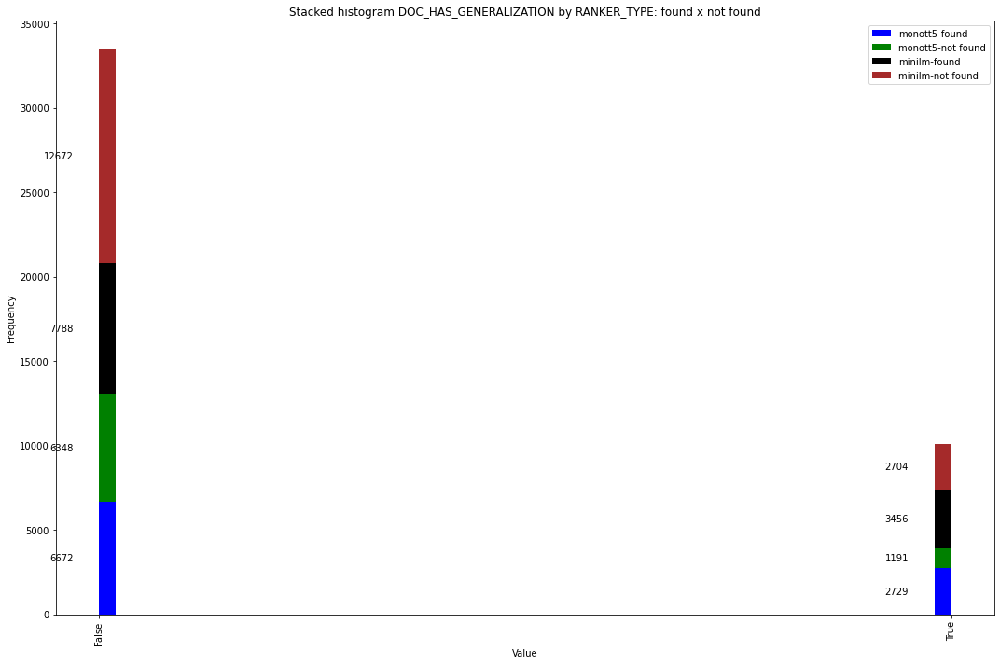

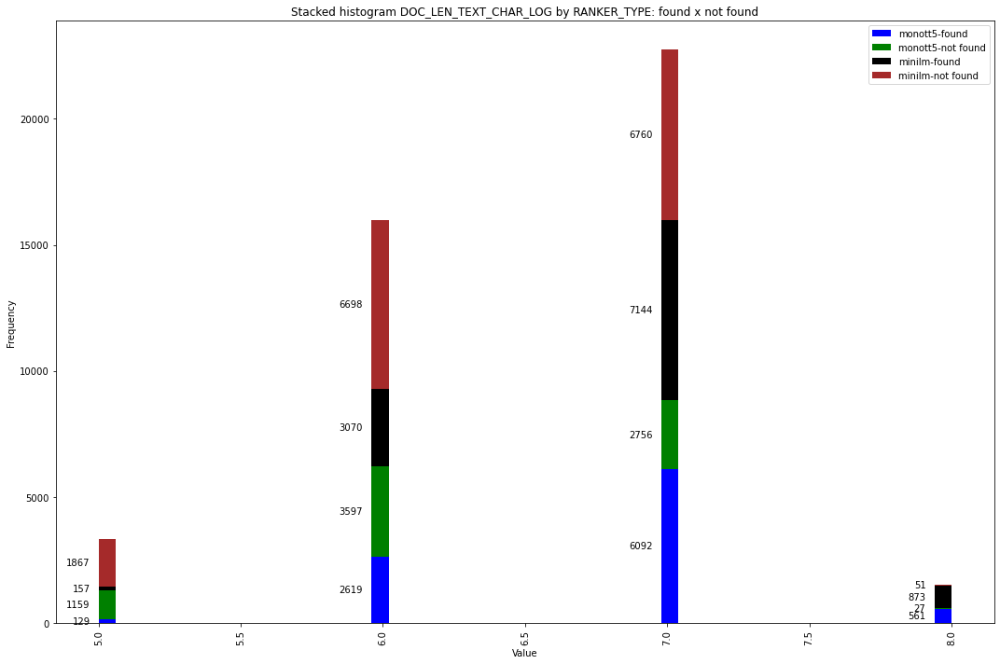

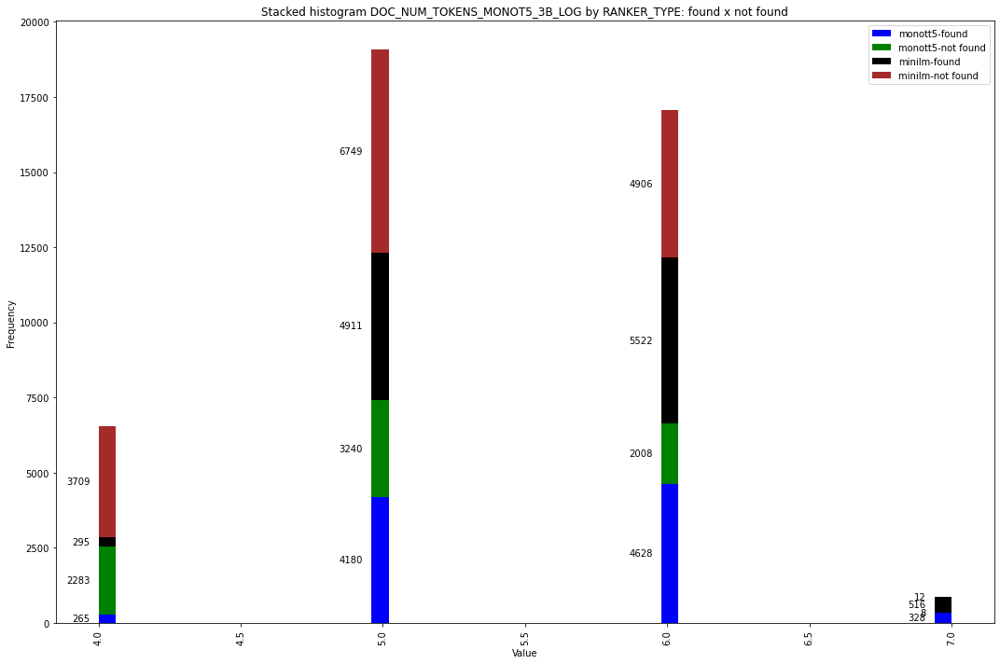

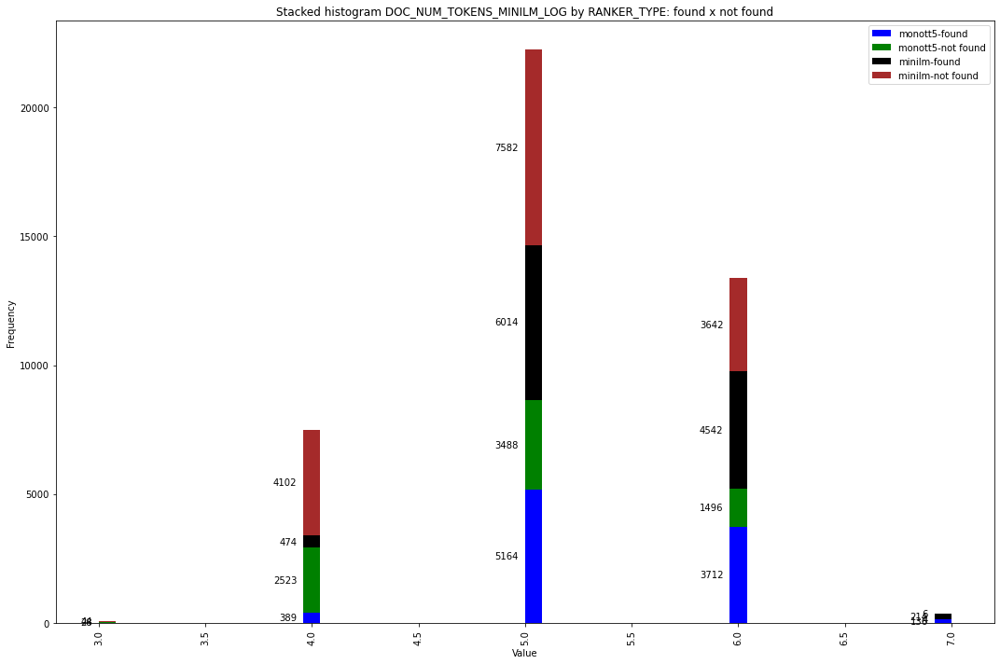

In [ ]:
for hue in ['CRITERIA', 'RETRIEVER_TYPE','RANKER_TYPE']:
    assert len(df_result_doc_found[hue].unique()) == 2, 'It only shows first 2 values'
    value1 = df_result_doc_found[hue].unique()[0]
    value2 = df_result_doc_found[hue].unique()[1]
    for column in list_category_doc:
        f, ax = plt.subplots(1, 1, figsize=(15, 10))
        plt.hist([
            df_result_doc_found[df_result_doc_found[hue] == value1].sort_values(by=column)[column].dropna(),
            df_result_doc_not_found[df_result_doc_not_found[hue] == value1].sort_values(by=column)[column].dropna(),
            df_result_doc_found[df_result_doc_found[hue] == value2].sort_values(by=column)[column].dropna(),
            df_result_doc_not_found[df_result_doc_not_found[hue] == value2].sort_values(by=column)[column].dropna(),
        ],
            color=['blue', 'green', 'black', 'brown'],
            label=[f'{value1}-found', f'{value1}-not found', f'{value2}-found', f'{value2}-not found'],
            stacked=True, bins=50)

        # Definir os rótulos do eixo X para colunas booleanas
        if '_HAS_' in column:
            plt.xticks([0, 1], ['False', 'True'])

        # Adicionar os valores das barras no topo e no lado esquerdo
        for rect in ax.patches:
            height = rect.get_height()
            width = rect.get_width()
            x = rect.get_x()
            y = rect.get_y()

            if height > 0:
                # ax.text(x + width / 2, y + height + 0.01, int(height), ha='center', va='bottom')
                ax.text(x - 0.03, y + height / 2, int(height), ha='right', va='center')

        plt.legend()
        plt.xlabel('Value')
        plt.ylabel('Frequency')
        plt.title(f'Stacked histogram {column} by {hue}: found x not found')
        plt.xticks(rotation=90)
        plt.tight_layout()
        plt.show()


/home/borela/miniconda3/envs/relevar-busca/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.


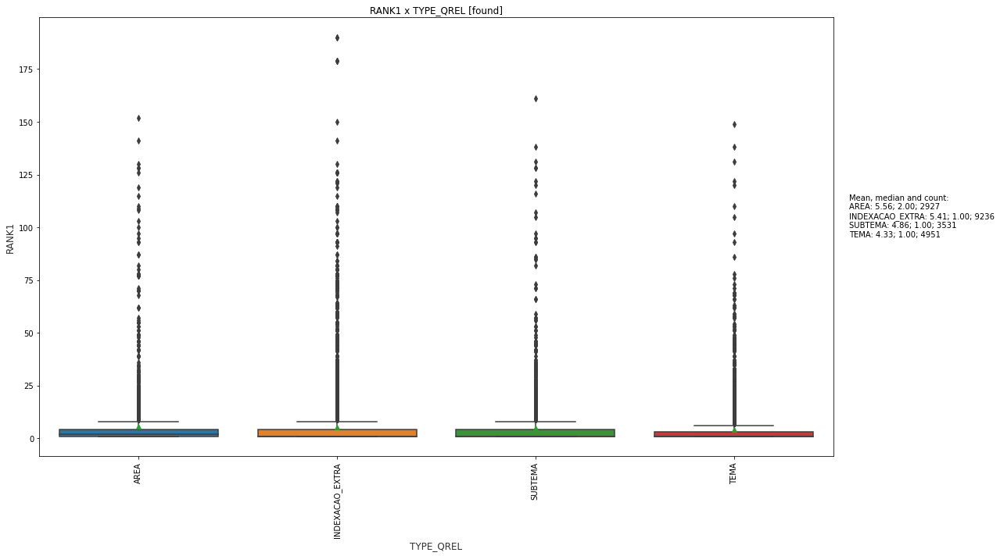

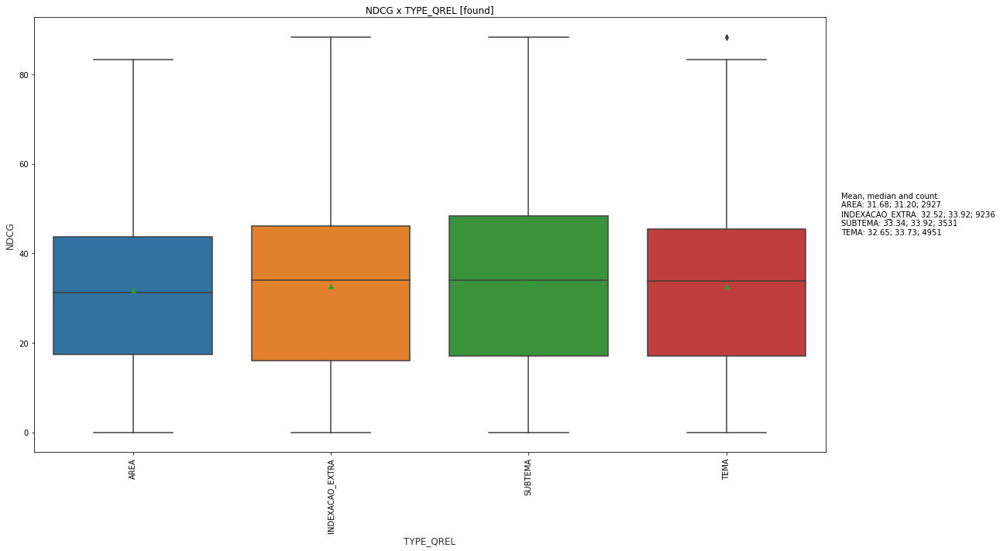

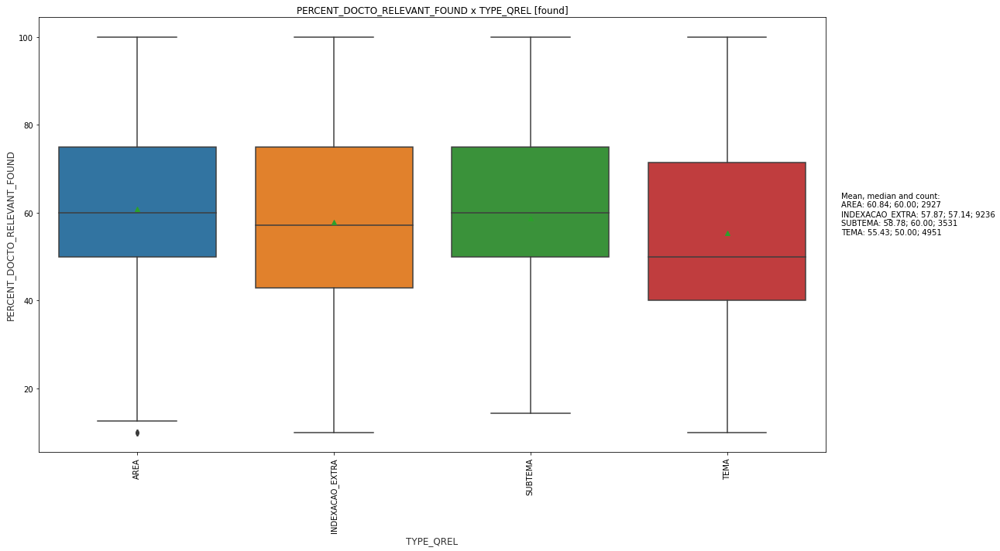

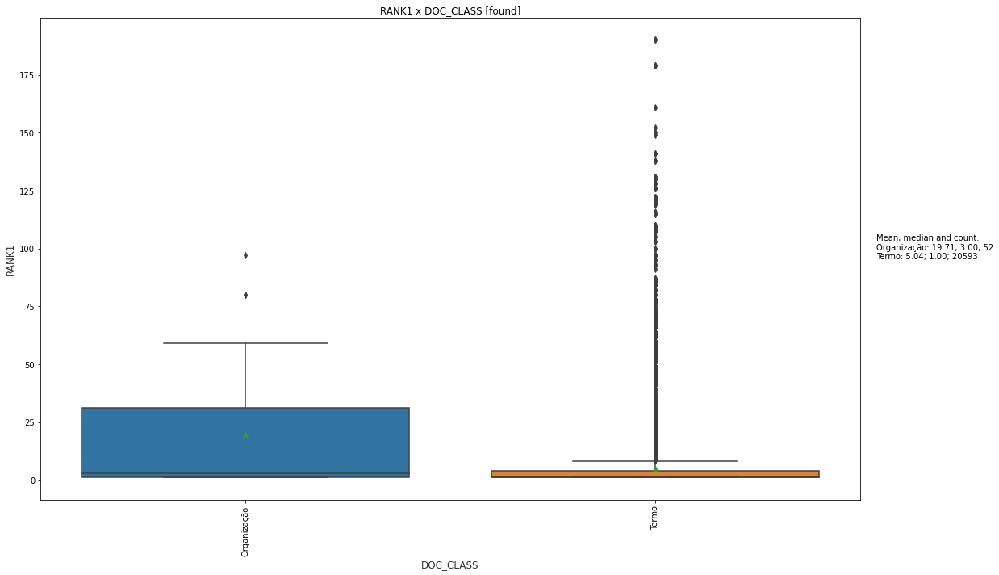

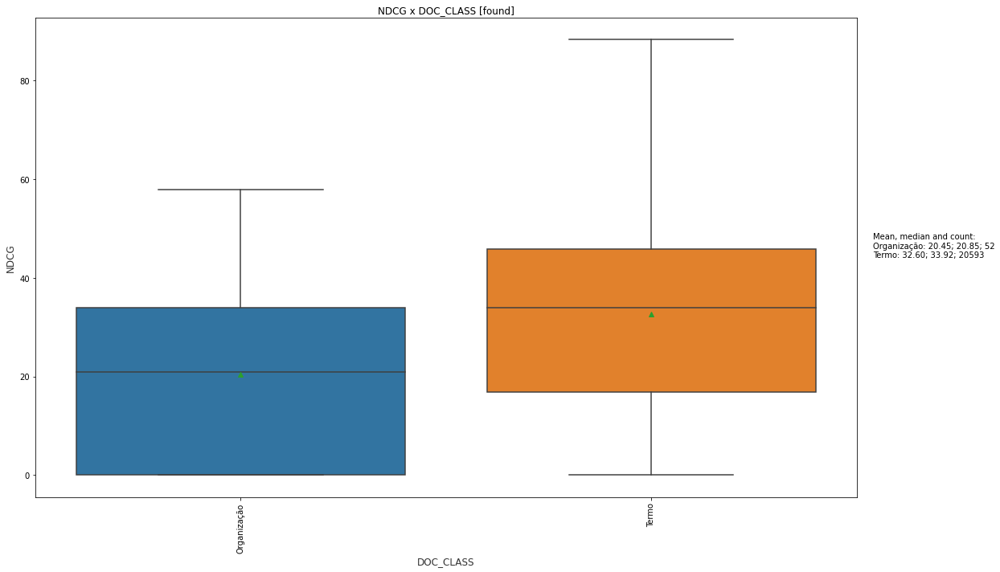

...

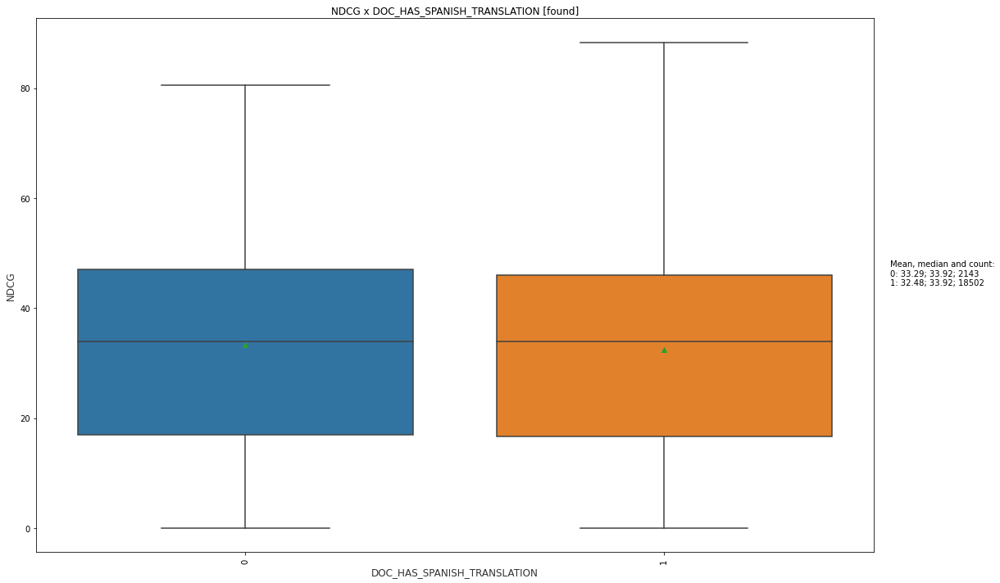

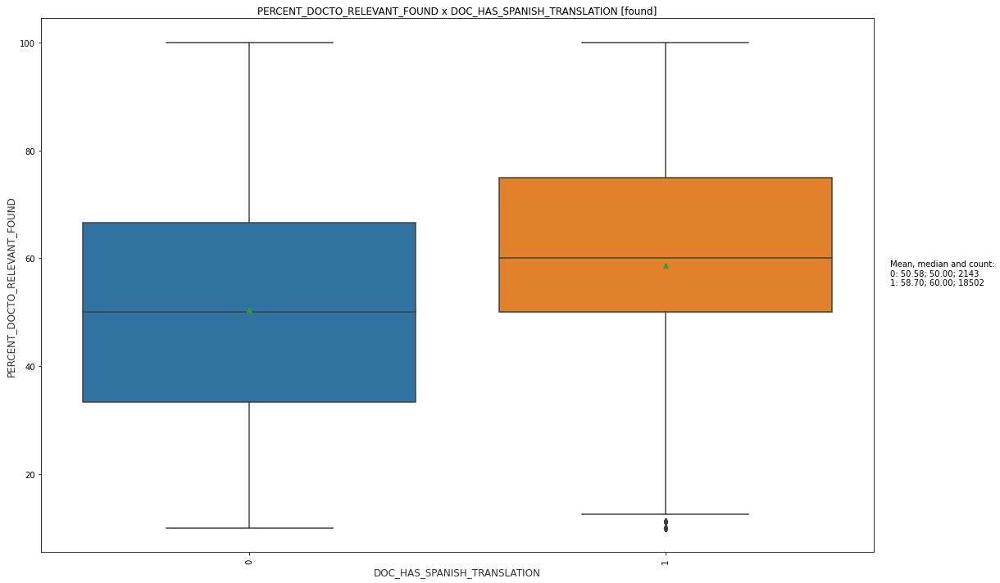

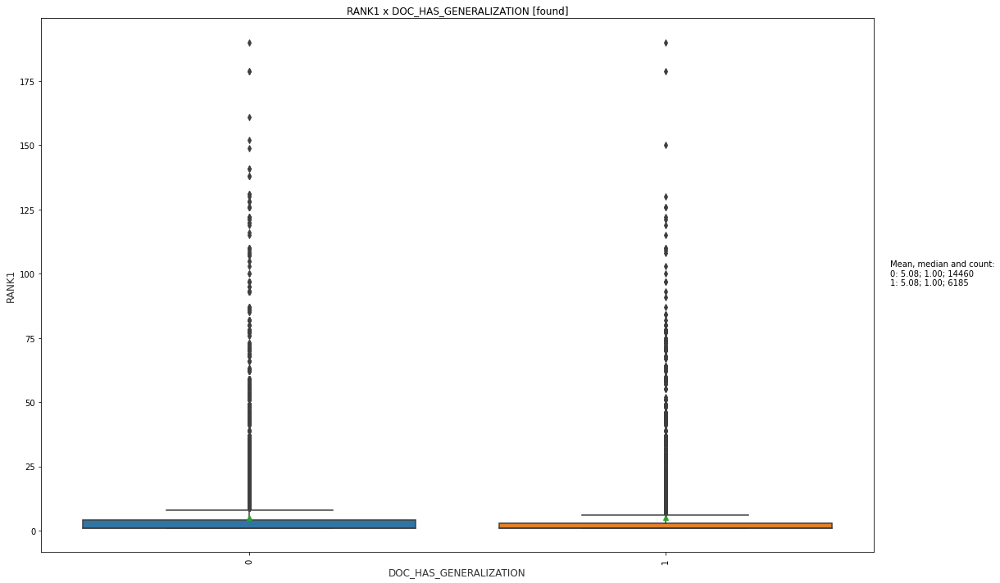

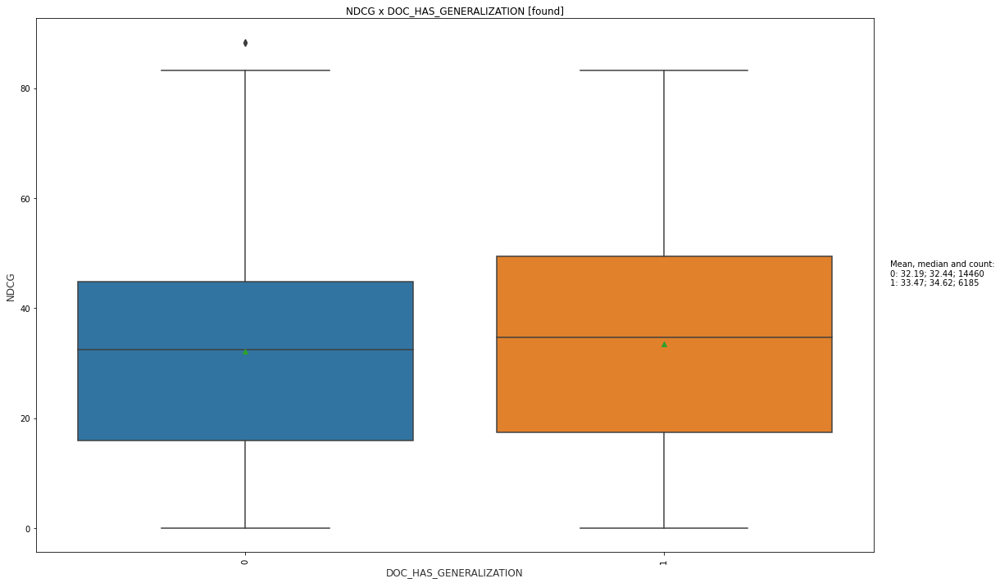

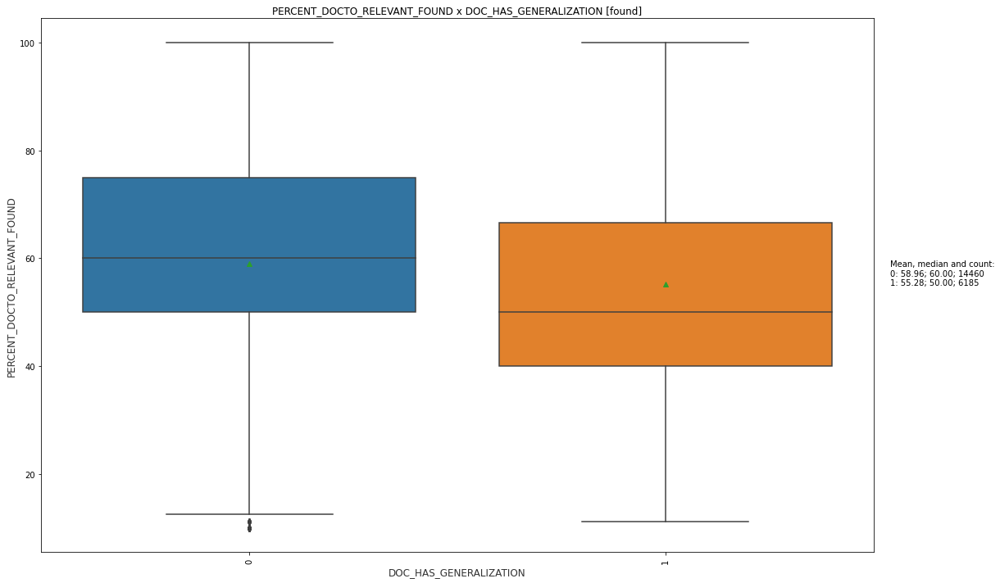

In [ ]:
for context in list_category_doc: 
    for metric in list_metric:
        
        # criar lista com valores únicos da coluna a ser ordenada
        # valores_unicos = sorted(df_result_doc_found[context].unique())
        
        valores_unicos = sorted(df_result_doc_found[context].dropna().unique())


        f, ax = plt.subplots(1, 1, figsize=(15,10))
        sns.boxplot(x=context, y=metric, data=df_result_doc_found, showmeans=True, ax=ax, order=valores_unicos)
        ax.set_xlabel(context,size = 12,alpha=0.8)
        ax.set_ylabel(metric,size = 12,alpha=0.8)
        ax.set_title(f'{metric} x {context} [found]')
        plt.xticks(rotation=90)
        plt.tight_layout()

        # Média e Mediana
        media = df_result_doc_found.groupby(context)[metric].mean()
        mediana = df_result_doc_found.groupby(context)[metric].median()
        count = df_result_doc_found.groupby(context)[metric].count()
        mm_list = [f"{i}: {j:.2f}; {k:.2f}; {l:.0f}" for i,j,k,l in zip(media.index, media, mediana, count)]
        mm_str = "\n".join(mm_list)
        ax.text(1.02, 0.5, f"Mean, median and count:\n{mm_str}", transform=ax.transAxes)

        """
        if context != 'CRITERIA':
            
            f, ax = plt.subplots(1, 1, figsize=(15,10))
            sns.boxplot(x=context, y=metric, hue='CRITERIA' , data=df_result_doc_found, showmeans=True, ax=ax, order=valores_unicos)
            f.subplots_adjust(top=0.5)


            ax.set_xlabel(context,size = 12,alpha=0.8)
            ax.set_ylabel(metric,size = 12,alpha=0.8)
            ax.set_title(f'{metric} x {context} - Criteria view')
            ax.legend(bbox_to_anchor=(1.05, 1), loc='upper center', ncol=1)
            plt.xticks(rotation=90)
            plt.tight_layout()

        if context != 'RETRIEVER_TYPE':
            
            f, ax = plt.subplots(1, 1, figsize=(15,10))
            sns.boxplot(x=context, y=metric, hue='RETRIEVER_TYPE' , data=df_result_doc_found, showmeans=True, ax=ax, order=valores_unicos)
            f.subplots_adjust(top=0.5)


            ax.set_xlabel(context,size = 12,alpha=0.8)
            ax.set_ylabel(metric,size = 12,alpha=0.8)
            ax.set_title(f'{metric} x {context} - RETRIEVER_TYPE view')
            ax.legend(bbox_to_anchor=(1.05, 1), loc='upper center', ncol=1)
            plt.xticks(rotation=90)
            plt.tight_layout()

        if context != 'RANKER_TYPE':
            f, ax = plt.subplots(1, 1, figsize=(15,10))
            sns.boxplot(x=context, y=metric, hue='RANKER_TYPE' , data=df_result_doc_found, showmeans=True, ax=ax, order=valores_unicos)
            f.subplots_adjust(top=0.5)


            ax.set_xlabel(context,size = 12,alpha=0.8)
            ax.set_ylabel(metric,size = 12,alpha=0.8)
            ax.set_title(f'{metric} x {context} - RANKER_TYPE view')
            ax.legend(bbox_to_anchor=(1.05, 1), loc='upper center', ncol=1)
            plt.xticks(rotation=90)
            plt.tight_layout()
        """

In [ ]:
len(df_result_doc_found['DOC_ID'].unique())

303